In [30]:
import matplotlib

def get_rolling_median(a2d, n_agg = 10):
    nsample = a2d.shape[0]
    n_pad = n_agg // 2
    padtop = np.vstack([a2d[0] for _ in range(n_pad)])
    padbottom = np.vstack([a2d[-1] for _ in range(n_pad)])
    padded = np.vstack([padtop, a2d, padbottom])
    a2d_rolling_median = pd.DataFrame(padded).rolling(n_agg).median().iloc[n_agg:, :].values
    return a2d_rolling_median

def get_rolling_median_2d(a2d, agg0 = 10, agg1 = 10):
    median_bg = get_rolling_median(a2d.T, agg1).T
    median_bg = get_rolling_median(a2d, agg0)
    return median_bg

from xrdc.datasets import d2d
def default_featurize(patterns_pp, smooth_ax1 = 'FWHM',
                     threshold_percentile = 50, size_thresh = 10,
                     thicken_ax1 = 1,
                     thicken_ax0 = 1,
                     sizetype = 'vertical'):
    #patterns_pp = gf(patterns, (1, 1.7))
    labeled, feature_masks, activations, norm_, activations_n1 = feat.get_ridge_features(
        patterns_pp,
       smooth_ax1 = smooth_ax1, smooth_ax0 = 2, threshold_percentile = threshold_percentile,
        thicken = True, size_thresh = size_thresh, bgsub=False,
        log_scale_features = False, fwhm_finder=feat.fwhm_finder, do_flood_thicken = False, max_size_flood = 20,
        thicken_ax0 = thicken_ax0, thicken_ax1 = thicken_ax1, flood_threshold=.95, smooth_factor_ax1 = .125,
        sizetype = sizetype)
    return labeled, feature_masks, activations, norm_, activations_n1

In [2]:
from glob import glob

In [3]:
m1 = glob('data/xrd_data/*1min*')
m2 = glob('data/xrd_data/*2min*')
m4 = glob('data/xrd_data/*4min*')

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl


import tensorflow_probability as tfp
import tensorflow as tf


tfk = tf.keras
tfkl = tf.keras.layers
tfpl = tfp.layers
tfd = tfp.distributions

# observed_amp = tf.sqrt((tfd.Independent(tfd.Poisson(amplitude**2))).sample()) + 0.5

2023-04-12 17:18:56.405142: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-12 17:18:56.494930: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-04-12 17:18:56.889556: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/ollie/anaconda3/envs/tf/lib/:/home/ollie/anaconda3/envs/tf/lib/
2023-04-12 17:18:56.889606: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin

In [5]:
def load_one(path):
    return pd.read_csv(path).set_index('2theta')

In [6]:
df_m1 = pd.concat([load_one(p) for p in m1], axis = 1)
df_m2 = pd.concat([load_one(p) for p in m2], axis = 1)
df_m4 = pd.concat([load_one(p) for p in m4], axis = 1)

patterns = df_m4.values.T

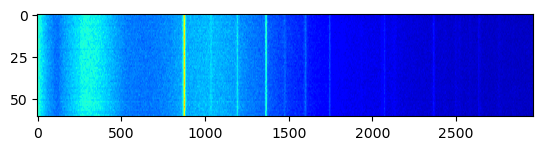

In [7]:
plt.imshow(df_m2.values.T, aspect = 10, cmap = 'jet')

In [9]:
from xrdc import source_separation as sep

In [10]:
threshold = 20
bg_smooth = 20
bg_smooth_post = 20


background, fast_q, slow_T, fast_T = sep.separate_signal(patterns, background_after_filter = False,
                                 threshold = threshold, smooth_q = 1.7, smooth_neighbor_background = 0,
                                smooth_q_background = bg_smooth,
                                 bg_fill_method = 'simple')

agged_background = np.mean(background, axis = 0)

background_variation = background - np.mean(background, axis = 0)

(0, 0)


In [11]:
from xrdc.source_separation import gf

from sklearn.utils import resample

from scipy.stats import kstest

In [12]:
import slide_tricks as st

In [13]:
from xrdc import fourier
from xrdc import featurization as feat

In [14]:
%matplotlib inline

In [15]:
from scipy.signal import peak_widths as pw, find_peaks

In [16]:
sig = 2.5
# area= np.sqrt(2 * np.pi * sig**2)

In [17]:
integration_scale = 2 * np.pi * 2.35 * sig / 2

In [18]:
peak = fourier.lowpass_g(100, patterns[0])
#peak = peak / peak.sum()

#peak = (peak == 1).astype(float)

In [19]:
from xrdc import featurization as feat

In [20]:
peak = fourier.lowpass_g(100, patterns[0])

In [21]:
(peak > (peak.max() / 2)).sum()

7

In [22]:
subsample = 1

In [23]:
sig = np.sqrt((peak.sum()**2) / (2 * np.pi))
sig_int = int(sig)

In [24]:
blocksize = 10

In [25]:
from sklearn.utils import resample

In [26]:
from xrdc import noise_analysis as noise

In [27]:
from importlib import reload
reload(noise)

<module 'xrdc.noise_analysis' from '/home/ollie/anaconda3/envs/tf/lib/python3.9/site-packages/xrdc-1.0-py3.9.egg/xrdc/noise_analysis.py'>

In [28]:
_, agged, mean, sterr = noise.get_aggregate_stderr(fast_q, peak, 10)
pairwise_diffs = noise.cartesian_diff(mean, mean)
pairwise_stderr = noise.cartesian_quad(sterr, sterr)
zscores = (np.abs(pairwise_diffs) / (pairwise_stderr + 1e-9))

arr = np.median(zscores, axis = 0)
rowmask = (arr < np.percentile(arr, 50))
select_zscores = np.einsum('i,j->ij', rowmask, ~rowmask)
bgmask_1d = (select_zscores == False).all(axis = 0)
off_diag_mask = (np.roll(np.eye(len(fast_q[0][::blocksize])), -1, axis = 0) +\
            np.roll(np.eye(len(fast_q[0][::blocksize])), 1, axis = 0)).astype(bool)

### Overlapping sliding blocks:

Overlap = block size - 1

#### pairwise diffs before aggregation:

In [48]:
blocksizes = np.arange(1, 41)

# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns

peak = None

# TODO distinguish between stride and block size
z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, 1, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True, mode = 'agg_last')
        for bs in blocksizes[1:]])


pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)
pairwise (60, 2962)


KeyboardInterrupt: 

Overlap = block size - 1


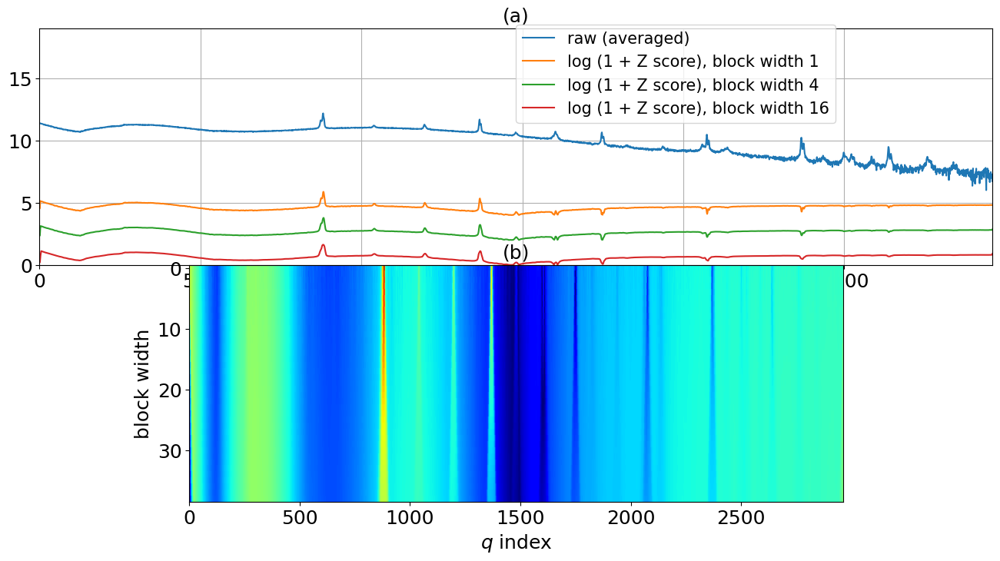

In [69]:
print('Overlap = block size - 1')
noise.plot_twopanel(arr2d, z_vs_blocksize, aspect = 18.3)

#### pairwise diffs after aggregation:

In [60]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns

peak = None

# TODO distinguish between stride and block size
z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, 1, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True, mode = 'agg_first')
        for bs in blocksizes[1:]])


Overlap = block size - 1


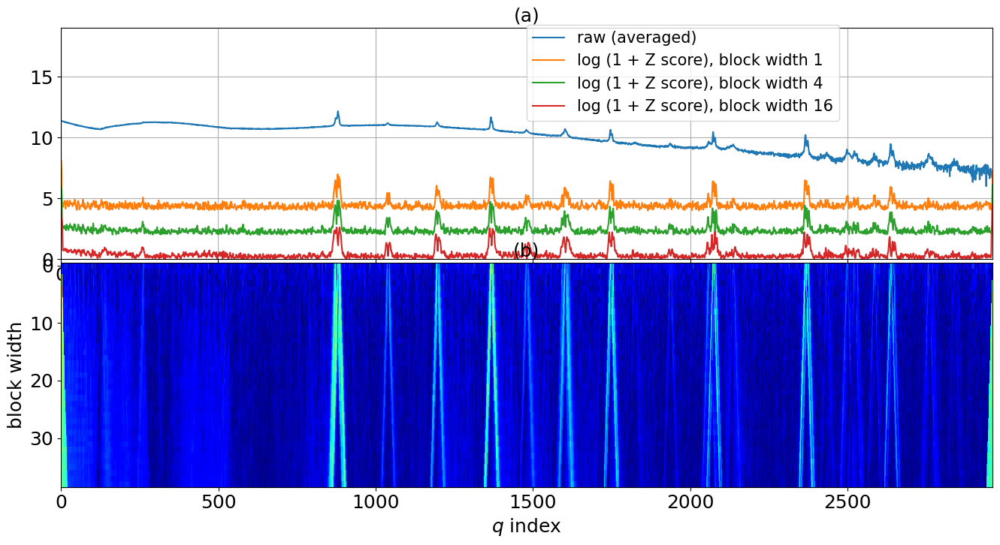

In [63]:
print('Overlap = block size - 1')
noise.plot_twopanel(arr2d, z_vs_blocksize, aspect = 18.3)


In [127]:
reload(noise)

<module 'xrdc.noise_analysis' from '/home/ollie/anaconda3/envs/tf/lib/python3.9/site-packages/xrdc-1.0-py3.9.egg/xrdc/noise_analysis.py'>

### Fig. 2.1

#### Block size 1:

In [28]:
arr2d = patterns

In [29]:
# bs = 1
# noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(arr2d, bs, ptype='square'), shifts=False,
#                       mode = 'agg_first').shape

In [30]:
from statsmodels.distributions.empirical_distribution import ECDF

# paper figures start here


In [31]:
def boot_mean(a2d, N = 10):
    """
    subsample rows, then return the average
    """
    return resample(a2d, n_samples = N).mean(axis = 0)

def boot_upsample(a2d, N = 10):
    """
    generate new samples by subsampling rows and averaging
    
    returns array of the same shape as the input
    """
    nrows = a2d.shape[0]
    return np.vstack([boot_mean(a2d, N = N) for _ in range(nrows)])

In [272]:
def setfonts(size1 = 15, size2 = 15):
    plt.rcParams.update({'font.size': size1})
    plt.rcParams.update({'axes.labelsize': size2})
    plt.rcParams.update({'axes.titlesize': size2})
    plt.rcParams.update({'xtick.labelsize': size2})
    plt.rcParams.update({'ytick.labelsize': size2})
#     plt.rcParams.update({'figure.figsize': (12, 12)})

In [194]:
patterns = df_m4.values.T

bs = 1

q = df_m1.index
        


    
# arr2d = patterns#[:10]
arr2d = boot_upsample(patterns, N = 10)

def kernel_agg(arr2d, bs, shift, q = None):
    arr2d = np.roll(arr2d, shift, axis = 1)
    kernel = noise.mk_square(arr2d, bs)
    idxs, arr_conv = noise.c2d(arr2d, kernel)
    if q is None:
        return arr_conv[:, ::bs]
    else:
        return arr_conv[:, ::bs], q[::bs]
        

def plot_fig2(bs):
    agged, qsub = kernel_agg(arr2d, bs, 0, q = q)
#     stderr = noise.boot_stderr(arr2d)
#     mean = noise.boot_mean(arr2d)
    stderr = noise.boot_stderr(agged)
    mean = noise.boot_mean(agged)

    zscores, cdfs = noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(patterns, bs, ptype='square'),
                                         shifts=False, mode = 'cdf', signed = False)
    means = np.array([cdf.x[1:].mean() for cdf in cdfs])
    # TODO is this right?
    # TODO move to module
    pvals = 2 * np.array([np.min([1 - cdf(mu + mu), cdf(0.)]) for mu, cdf in zip(means, cdfs)])
#     print(arr2d.shape, agged.shape, zscores[::bs].shape)
#     pvals = noise.boot_pvalue(agged, zscores[::bs], cdfs)
    
    zscores[:40] = 0
    zscores[-1] = 0

    iplot = 1
    if bs == 1:
        a, b = 5, 1
        ax = plt.subplot(a, b, 1)
        plt.autoscale(enable=True, axis='x', tight=True)
        waterfall(agged[::6], 100 * bs, qsub)
        ax.set_title('', y=1.0, pad=-14)
        iplot = 2
    else:
        a, b = 4, 1

#     ax = plt.subplot(a, b, iplot)
#     plt.autoscale(enable=True, axis='x', tight=True)
#     #plt.plot(qsub, mean, label = 'mean')
#     agged_1, qsub_1 = kernel_agg(arr2d, 1, 0, q = q)
#     plt.plot(qsub_1, agged_1.mean(axis = 0), label = 'mean')
#     plt.grid()
#     ax.set_title('mean', y=1.0, pad=-14)
#     iplot += 1
    
    ax = plt.subplot(a, b, iplot)
    plt.autoscale(enable=True, axis='x', tight=True)
    #plt.plot(qsub, mean, label = 'mean')
    agged_1, qsub_1 = kernel_agg(arr2d, 1, 0, q = q)
    mean_1 = noise.boot_mean(agged_1)
#     print(agged_1.shape, qsub_1.shape, arr2d.shape, q.shape)
    plt.plot(qsub_1, mean_1, label = 'mean ($\mu$)')
    plt.grid()
    ax.set_title('mean ($\mu$)', y=1.0, pad=-14)
    iplot += 1

    ax = plt.subplot(a, b, iplot)
    #plt.plot(qsub, stderr, label = 'standard error')
    plt.plot(qsub, 100 * stderr / mean, label = 'standard error / mean (percent)')
    plt.autoscale(enable=True, axis='x', tight=True)
    ax.set_title('$\sigma_M / \mu$ (percent)', y=1.0, pad=-14)
    plt.xlabel('$2 \\theta$ (deg)')
    plt.grid()
    iplot += 1

    ax = plt.subplot(a, b, iplot)
    #plt.plot(q, np.log(1 + zscores))
    plt.plot(q, np.abs(zscores))
    plt.autoscale(enable=True, axis='x', tight=True)
    ax.set_title('Z score', y=1.0, pad=-14)
    plt.grid()
    iplot += 1

    ax = plt.subplot(a, b, iplot)
    #plt.scatter(qsub, np.log10(pvals + 1e-6))
    plt.plot(qsub, np.log10(pvals + 1e-4))
#     plt.ylim((-4, 0))
    plt.autoscale(enable=True, axis='x', tight=True)
    ax.set_title('$\\log_{10}(p)$', y=.5, pad=-14)
    iplot += 1

    # ax.set_title('(c)', y=1.0, pad=-14)
    # plt.xlabel('$2 \\theta$ (deg)')

    plt.grid()
    #return pvals
    return zscores, cdfs

agged, qsub = kernel_agg(arr2d, bs, 0, q = q)
#     stderr = noise.boot_stderr(arr2d)
#     mean = noise.boot_mean(arr2d)
stderr = noise.boot_stderr(agged)
mean = noise.boot_mean(agged)

zscores, cdfs = noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(patterns, bs, ptype='square'),
                                     shifts=False, mode = 'cdf', signed = False)
means = np.array([cdf.x[1:].mean() for cdf in cdfs])
# TODO is this right?
# TODO move to module
pvals = 2 * np.array([np.min([1 - cdf(mu + mu), cdf(0.)]) for mu, cdf in zip(means, cdfs)])
#     print(arr2d.shape, agged.shape, zscores[::bs].shape)
#     pvals = noise.boot_pvalue(agged, zscores[::bs], cdfs)

zscores[:40] = 0
zscores[-1] = 0


signed False
pairwise (60, 2962)
pairwise (60, 2962)


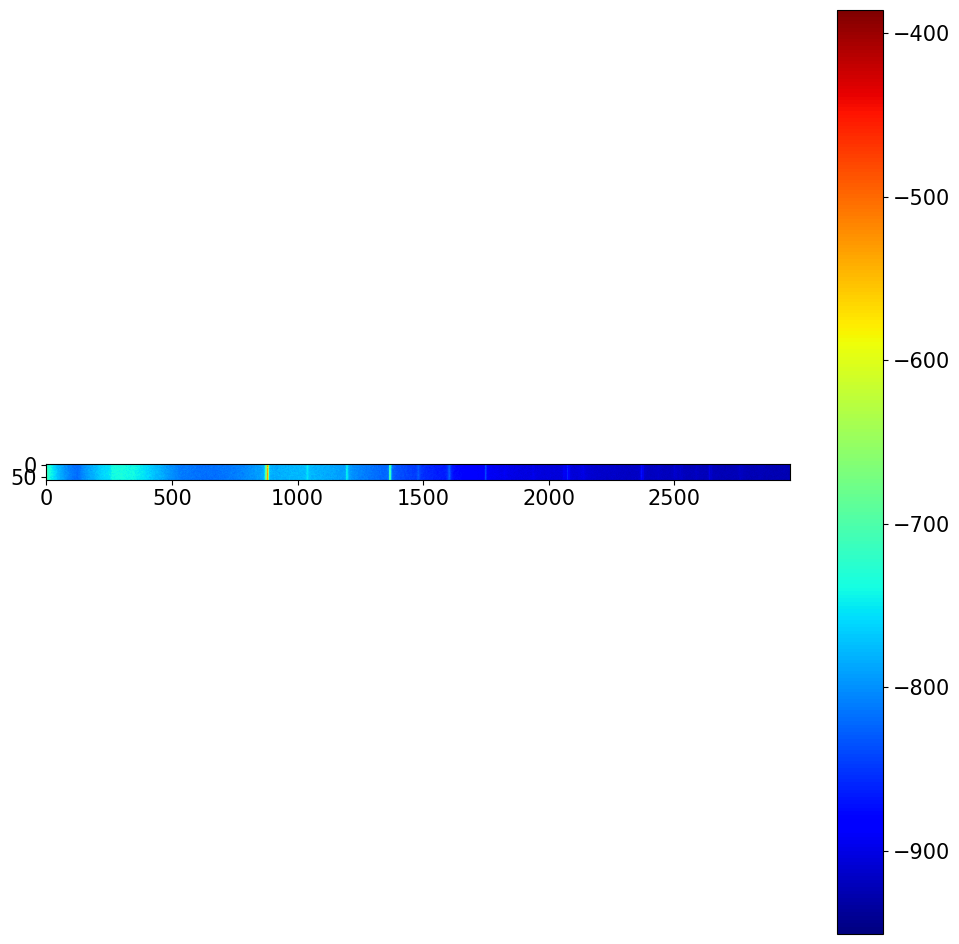

In [199]:
plt.imshow(patterns_agged - floor, cmap = 'jet')
plt.colorbar()

In [248]:
import matplotlib.cm as cm
matplotlib.rcParams['figure.figsize'] =(10, 8)

# Convert the value to a color using the jet colormap



def waterfall(arr2d, offset, q, mpl_ax = None, **kwargs):
    if mpl_ax is not None:
        for i, row in enumerate(arr2d):
            mpl_ax.plot(q, row + offset * i, **kwargs)
    else:
        for i, row in enumerate(arr2d):
            plt.plot(q, row + offset * i, **kwargs)
        #plt.plot(q, row + offset * i, color = cm.viridis(i / len(arr2d)), **kwargs)
        

def plot_fig1(bs = 1):
    a, b = 3, 1
    ax = plt.subplot(a, b, 1)
    
    plt_heatmap(np.log(patterns_agged - floor), mpl_ax = ax,
           title = 'Measurement heatmap', hide_xlabels = True)
    
    plt.hlines(list(range(len(patterns_agged)))[::6], 0, 100, color = 'k')

#     plt.autoscale(enable=True, axis='x', tight=True)
#     #plt.plot(qsub, mean, label = 'mean')
#     agged_1, qsub_1 = kernel_agg(arr2d, 1, 0, q = q)
#     mean_1 = noise.boot_mean(agged_1)
# #     print(agged_1.shape, qsub_1.shape, arr2d.shape, q.shape)
#     plt.plot(qsub_1, mean_1, label = 'mean ($\mu$)')
#     plt.grid()
#     ax.set_title('mean ($\mu$)', y=1.0, pad=-14)
    
    ax = plt.subplot(a, b, 2)
    plt.autoscale(enable=True, axis='x', tight=True)
    waterfall(patterns_agged[::6], 100 * bs, qsub)
    #waterfall(agged, 100 * bs, qsub)
    plt.grid()
    ax.set_xticklabels([])

    ax.set_title('Measurement cross-sections', y=1.0, pad=-14)
    

    ax = plt.subplot(a, b, 3)
    #plt.plot(qsub, stderr, label = 'standard error')
    plt.plot(qsub, 100 * stderr / mean, label = 'standard error / mean (percent)')
    plt.autoscale(enable=True, axis='x', tight=True)
    ax.set_title('$\sigma_M / \mu$ (percent)', y=1.0, pad=-14)
    plt.xlabel('$2 \\theta$ (deg)')
    plt.grid()
    
    return zscores, cdfs

def plt_heatmap(patterns_agged, mpl_ax = None, title = None, 
                hide_xlabels = False, cmap = 'jet', **kwargs):
    if mpl_ax is None:
        ax = plt
    else:
        ax = mpl_ax
    if mpl_ax is None:
        ax.xticks(xticks)
        ax.xlim(xlim)
        ax.title(title)
    else:
        ax.set_xticks(xticks)
        ax.set_xlim(xlim)
        ax.set_title(title)
        if hide_xlabels:
#             ax.set_xticks([])
            ax.set_xticklabels([])
    return ax.imshow((patterns_agged), cmap = cmap, aspect = heatmap_aspect,
              extent=[_q.min(), _q.max(), 0, len(patterns_agged) - 1], **kwargs)

# Fig. 1

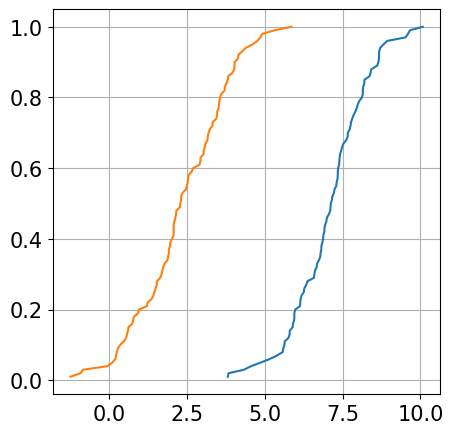

In [69]:
bs = 8
np.max(zscores[::bs])

c = cdfs[np.argmax(zscores[::bs]) + 1]

# c = cdfs[95]
c2 = cdfs[40]

cdf = c
mu = c.x[1:].mean()

matplotlib.rcParams['figure.figsize'] =(5, 5)
plt.plot(c.x, c.y)
plt.plot(c2.x, c2.y)
plt.grid()

In [70]:
def zs_pvals(bs):
    agged, qsub = kernel_agg(arr2d, bs, 0, q = q)
    stderr = noise.boot_stderr(agged)
    mean = noise.boot_mean(agged)

    zscores, cdfs = noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(patterns, bs, ptype='square'),
                                         shifts=False, mode = 'cdf', signed = False)
    means = np.array([cdf.x[1:].mean() for cdf in cdfs])
    # TODO is this right?
    # TODO move to module
    pvals = 2 * np.array([np.min([1 - cdf(mu + mu), cdf(0.)]) for mu, cdf in zip(means, cdfs)])
    
    zscores[:bs] = 0
    zscores[-bs:] = 0

    return (q, zscores), (qsub, pvals)

In [50]:
zzpp = []
# zzpp.append((z2, p2))
# zzpp.append((z4, p4))

sizes = np.arange(2, 65)
#for bs in [2, 4, 8, 16, 32, 64]:
for bs in sizes:
    zzpp.append(zs_pvals(bs))
    
zs, ps = zip(*zzpp)

_q, _ = zs[0]

signed False
pairwise (60, 1481)
pairwise (60, 1481)
signed False
pairwise (60, 988)
pairwise (60, 988)
signed False
pairwise (60, 741)
pairwise (60, 741)
signed False
pairwise (60, 593)
pairwise (60, 593)
signed False
pairwise (60, 494)
pairwise (60, 494)
signed False
pairwise (60, 424)
pairwise (60, 424)
signed False
pairwise (60, 371)
pairwise (60, 371)
signed False
pairwise (60, 330)
pairwise (60, 330)
signed False
pairwise (60, 297)
pairwise (60, 297)
signed False
pairwise (60, 270)
pairwise (60, 270)
signed False
pairwise (60, 247)
pairwise (60, 247)
signed False
pairwise (60, 228)
pairwise (60, 228)
signed False
pairwise (60, 212)
pairwise (60, 212)
signed False
pairwise (60, 198)
pairwise (60, 198)
signed False
pairwise (60, 186)
pairwise (60, 186)
signed False
pairwise (60, 175)
pairwise (60, 175)
signed False
pairwise (60, 165)
pairwise (60, 165)
signed False
pairwise (60, 156)
pairwise (60, 156)
signed False
pairwise (60, 149)
pairwise (60, 149)
signed False
pairwise (60, 14

Fig. 2, different presentation:

In [51]:
# zvals = np.array([elt[1] for elt in zs])

# plt.imshow(np.log(.5 + zvals), aspect = 200, cmap = 'jet', interpolation = 'none')

In [71]:
# def fig2_heatmap(aspect = .5, ylabel = None):
#     plt.title('Z score heatmap')
#     _zvals = np.array([elt[1] for elt in zs])
#     zvals = np.vstack((_zvals, [_zvals[-1]]))
#     n, m = zvals.shape
#     zvals = zvals.reshape((n // 2, -1, m)).mean(axis = 1)

#     # zvals = np.vstack((np.zeros_like(zvals[0]), zvals))

#     plt.imshow(zvals, extent=[_q.min(), _q.max(), np.max(sizes), np.min(sizes)], cmap='jet',
#               aspect = aspect, interpolation = 'none')
#     plt.xlabel('$2\\theta$ (degrees)')
#     plt.ylabel(ylabel)

In [72]:
def ragged_agg(arr, stride):
    npad = stride - (len(arr) % stride)
    padleft, padright = npad // 2, npad // 2 + npad % 2
    arr = np.pad(arr, (padleft, padright))
    return np.reshape(arr, (len(arr) // stride, stride)).mean(axis = 1)

In [385]:
# def ragged_agg2(arr, stride):
#     """
#     geometric mean
#     """
#     npad = stride - (len(arr) % stride)
#     padleft, padright = npad // 2, npad // 2 + npad % 2
#     arr = np.pad(arr, (padleft, padright))
#     arr = np.reshape(arr, (len(arr) // stride, stride)) + 1e-3
#     return arr.prod(axis = 1)**(1 / stride)    

def ragged_agg2(arr, stride, C = 1):
    """
    geometric mean
    """
    npad = stride - (len(arr) % stride)
    padleft, padright = npad // 2, npad // 2 + npad % 2
    arr = np.pad(arr, (padleft, padright))
    arr = np.reshape(arr, (len(arr) // stride, stride)) + 1e-3
    return arr.prod(axis = 1)**(C / stride)    

In [430]:
import matplotlib
matplotlib.rcParams['figure.figsize'] =(10, 5)

colors = ['red', 'green', 'blue', 'orange', 'brown']
#sizes_selected = [2, 4, 8, 16, 64]
sizes_selected = [2, 4, 8, 32]

TODO: correct pairwise aggregation of Z scores?

In [393]:
xticks = [i for i in range(5,56, 5)]
xlim = [5, 59]


<IPython.core.display.Javascript object>


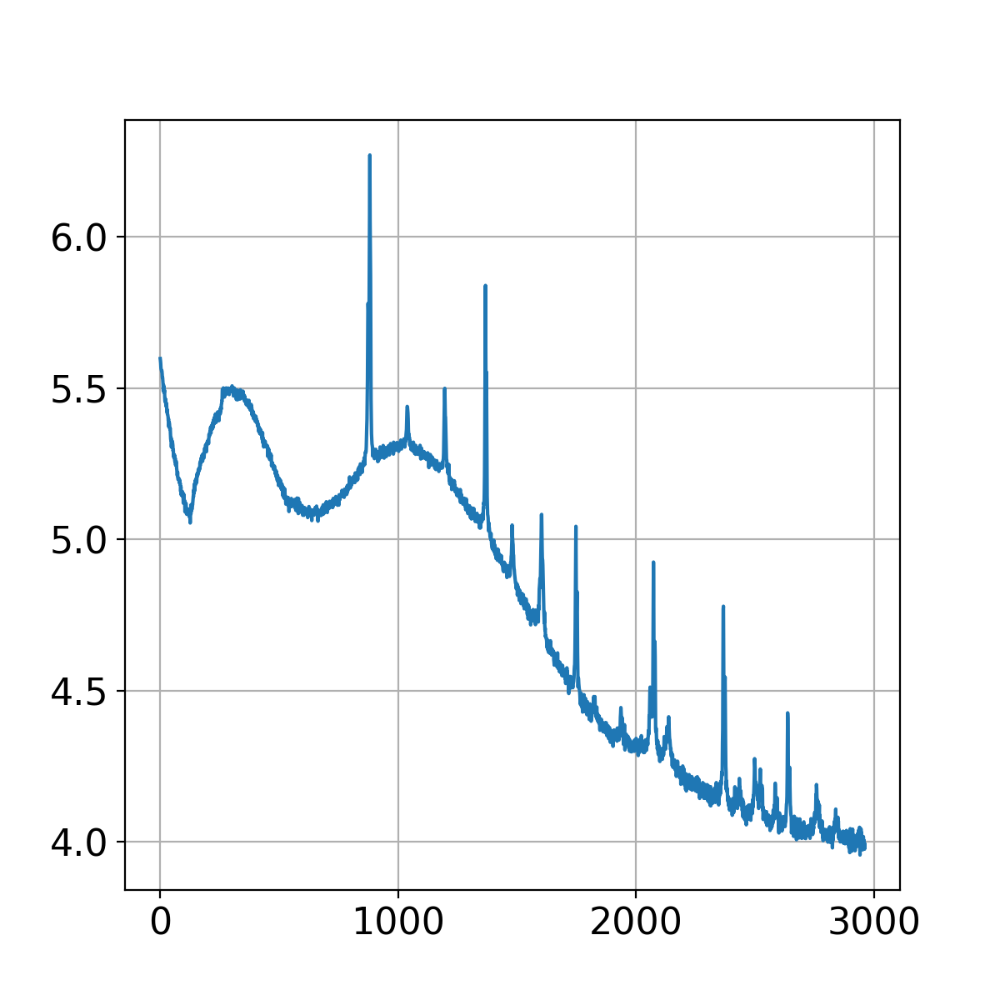

In [312]:
%matplotlib notebook
plt.rcParams["figure.figsize"] = [6, 6]
plt.plot(np.log(patterns.mean(axis = 0)))
plt.grid()

In [516]:
def fig2_topright(plt):
    """
    third panel
    """
    i = 0
    off_scale = 10
    for zz, pp, s in zip(zs, ps, sizes):
        if s not in [2, 4, 8, 16, 32]:
            continue
        _q, _z = zz
        offset = i * off_scale
        plt.plot(_q, _z + offset, label = '{}'.format(s),
                color= colors[i])
        plt.semilogy()
        i += 1
    plt.grid()
    plt.legend(ncol = 1, bbox_to_anchor=(1.0, 1), loc='upper left')  # Move the legend to the right
    plt.set_xlabel('$2 \\theta$ (deg)')
    plt.set_ylabel('$t~\mathrm{statistic}$')
    plt.set_ylim((.5, 180))


ax24_ymax = 4
skipratio = 16#16
def fig2_bottomright(plt):
    """
    fourth panel
    """
    i = 0
    off_scale = .1
    for zz, pp, s in zip(zs, ps, sizes):
#     for zz, pp, s in zip(zs[::-1], ps[::-1], sizes[::-1]):
        if s not in [2, 4, 8, 32]:
            continue
        _q, _p = pp
        skip = max(1, int(skipratio / s))
#         plt.plot(ragged_agg(np.array(_q), skip), np.log10(
#+ (i - 1.5) * off_scale
        log_p = np.log10(ragged_agg2(_p, skip, 1))
        is_zero = (log_p == log_p.min())
        log_p[is_zero] += (i - 2) * off_scale
        plt.plot(ragged_agg(np.array(_q), skip), -log_p,  'o',
#                  color = colors[i], markersize = 6, label = '$\\log_{10}p$, ' + str(s))
                 color = colors[i], markersize = 5, label = '' + str(s))
        i += 1
    n, m  =patterns.shape
    a1d = (patterns.reshape((n // 2, -1, m)).mean(axis = 1)).mean(axis = 0) / 100
    plt.grid(which = 'both')
    plt.set_xticks([i for i in range(5,61, 5)])
    plt.legend(loc = 'upper right', framealpha = .9, ncol = 4)
    plt.set_xlabel('$2 \\theta$ (deg)')
    #plt.set_ylim((None, 0.8))
    plt.set_ylim((0, ax24_ymax))
    plt.set_ylabel('$-\\log_{10}(p)$')

In [518]:
# mark

In [519]:
def imshow_add_inner_title(ax, title_text):
    # Add title on top of the heatmap
#     title_text = 'Heatmap Title'
    title_x = 0.5  # x position in relative coordinates (0 to 1)
    title_y = 0.1  # y position in relative coordinates (0 to 1)
    ax.text(title_x, title_y, title_text, transform=ax.transAxes,
            horizontalalignment='center', verticalalignment='center',
            fontsize=size1, color='black',
            bbox={'facecolor': 'white', 'edgecolor': 'none', 'alpha': 0.8, 'pad': 5})

/tmp/ipykernel_62552/4260135099.py:100: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  ax22.set_ylim((0, ymax))


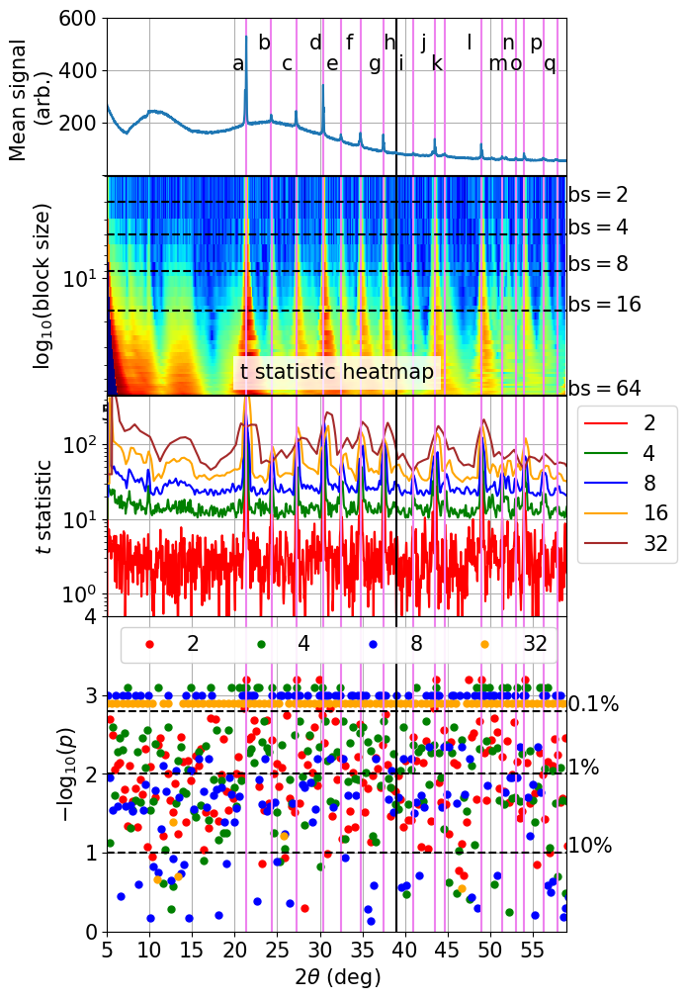

In [520]:
%matplotlib inline

vline_color = 'violet'
special_color = 'black'

fsize = 15
setfonts(size1 = fsize, size2 = fsize)
plt.rcParams["figure.figsize"] = [6, 12]

from scipy.signal import find_peaks
x = gf(patterns.mean(axis = 0), 4)
# peak indices
peaks, _ = find_peaks(x, height=0, prominence=4, width = [0, 20])
# peaks = np.hstack((peaks, [2760]))
special_peak = np.array([1832])
peaks = np.hstack((peaks, [1832, 2760, 1937, 2850]))

_zvals = np.array([elt[1] for elt in zs])
zvals = np.vstack((_zvals, [_zvals[-1]]))
n, m = zvals.shape
zvals = zvals.reshape((n // 2, -1, m)).mean(axis = 1)

gs0 = matplotlib.gridspec.GridSpec(4,1, height_ratios=[1, 1.4, 1.4, 2])
fig1 = plt.figure()

# ax11 = fig1.add_subplot(gs0[0,0])
# ax12 = fig1.add_subplot(gs0[1,0])
# ax22 = fig1.add_subplot(gs0[0,1])
# ax24 = fig1.add_subplot(gs0[1,1])

ax11 = fig1.add_subplot(gs0[0])
ax12 = fig1.add_subplot(gs0[1])
ax22 = fig1.add_subplot(gs0[2])
ax24 = fig1.add_subplot(gs0[3])

fig1.subplots_adjust(hspace=0)


ax11.grid()
ax11.set_xlim(xlim)
ax11.set_ylim(0, 600)
ax11.vlines((q[peaks] + q[peaks]) / 2, 0, 600, color = vline_color)
ax11.vlines((q[special_peak] + q[special_peak]) / 2, 0, 600, color = special_color)

letts = iter_letters()
for i, peaki in enumerate(sorted(peaks)):
    ax11.text(q[peaki] - 1.7, 400 + 80 * (i % 2), next(letts))

ax11.plot(q, patterns.mean(axis = 0))
ax11.set_ylabel('Mean signal \n(arb.)')

yticks = ax11.yaxis.get_major_ticks() 
yticks[0].label1.set_visible(False)
ax11.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) 


yticks = ax22.yaxis.get_major_ticks() 
yticks[0].label1.set_visible(False)
ax22.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) 

theat_aspect = 17 # 23.6
ax12.imshow(np.log(1 + zvals), extent=[_q.min(), _q.max(), np.max(sizes), np.min(sizes)], cmap='jet',
          aspect = theat_aspect, interpolation = 'none')#39
ax12.set_yscale('log')
ax12.vlines((q[peaks] + q[peaks + 1]) / 2, 0, 64, color = vline_color)
ax12.vlines((q[special_peak] + q[special_peak + 1]) / 2, 0, 64, color = special_color)
ax12.hlines([2 + 1, 4 + 1, 8 + 1, 16 + 1, 65], xlim[0], xlim[1] + 5, color = 'k', linestyles=['--'])
ax12.set_ylim((64, 2))
bs_s_fmt = 'bs$={}$'
ax12.text(xlim[1], 2 + 1, bs_s_fmt.format(2))
ax12.text(xlim[1], 4 + 1, bs_s_fmt.format(4))
ax12.text(xlim[1], 8 + 1, bs_s_fmt.format(8))
ax12.text(xlim[1], 16 + 1, bs_s_fmt.format(16))
ax12.text(xlim[1], 64 + 1, bs_s_fmt.format(64))


ax12.set_xlim(xlim) 
ax12.set_xlabel('$2 \\theta$ (deg)')
ax12.set_ylabel('$\\log_{10}(\mathrm{block~size})$')
imshow_add_inner_title(ax12, 't statistic heatmap')
# plt.grid(which = 'both')
xticks = [i for i in range(5,56, 5)]
ax12.set_xticks(xticks)


ymax = 450
fig2_topright(ax22)
ax22.vlines((q[peaks] + q[peaks + 1]) / 2, 0, ymax, color = vline_color)
ax22.vlines((q[special_peak] + q[special_peak + 1]) / 2, 0, ymax, color = special_color)
ax22.set_ylim((0, ymax))
# ax22.yaxis.set_label_position("right")
ax22.set_xlim(xlim)


fig2_bottomright(ax24)
ax24.set_xlim(xlim)
ax24.text(xlim[1], 2.8, '$0.1 \%$')
ax24.text(xlim[1], 2, '$1 \%$')
ax24.text(xlim[1], 1, '$10 \%$')
ax24.vlines((q[peaks] + q[peaks + 1]) / 2, 0, ax24_ymax, color = vline_color)
ax24.vlines((q[special_peak] + q[special_peak + 1]) / 2, 0, ax24_ymax, color = special_color)
ax24.hlines([2.8, 2, 1], xlim[0], xlim[1] + 5, color = 'k', linestyles=['--'])

# ax24.yaxis.set_label_position("right")

# fig1.tight_layout()
fig1.show()

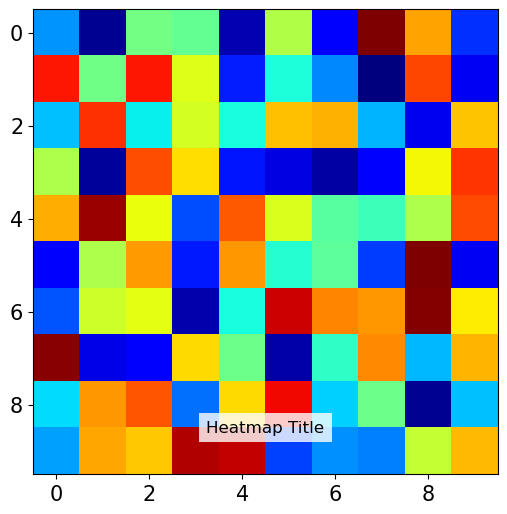

In [503]:
import numpy as np
import matplotlib.pyplot as plt

data = np.random.rand(10, 10)

fig, ax = plt.subplots()
heatmap = ax.imshow(data, cmap='jet')

# Add title on top of the heatmap
title_text = 'Heatmap Title'
title_x = 0.5  # x position in relative coordinates (0 to 1)
title_y = 0.1  # y position in relative coordinates (0 to 1)
ax.text(title_x, title_y, title_text, transform=ax.transAxes,
        horizontalalignment='center', verticalalignment='center',
        fontsize=12, color='black',
        bbox={'facecolor': 'white', 'edgecolor': 'none', 'alpha': 0.8, 'pad': 5})

plt.show()


Fig. 3 data:

# median

In [205]:
a2d = patterns
N = 10

patterns_agged = boot_upsample(patterns, N = 10)

threshold = 20
bg_smooth = 0#20
bg_smooth_post = 0#20

nn = 1
patterns_agged = patterns.reshape(60 // nn, nn, -1).mean(axis = 1)

# patterns_agged = boot_upsample(patterns, N = 10)

# patterns_agged = gf(patterns_agged, (4, 0))

#background, fast_q, slow_T, fast_T = sep.separate_signal(patterns, background_after_filter = False,
background, fast_q, slow_T, fast_T = sep.separate_signal(patterns_agged,
                                background_after_filter = False,
                                threshold = threshold, smooth_q = 1.5,
                                smooth_neighbor_background = 0,
                                smooth_q_background = 4,
                                 bg_fill_method = 'simple')

agged_background = np.median(background, axis = 0)
floor = patterns_agged.min()

# bg_agged = background.reshape(60 // nn, nn, -1).mean(axis = 1)


background_variation = background - np.mean(background, axis = 0)

matplotlib.rcParams['figure.figsize'] =(10, 10)
heatmap_aspect = .2 * nn

(0, 0)


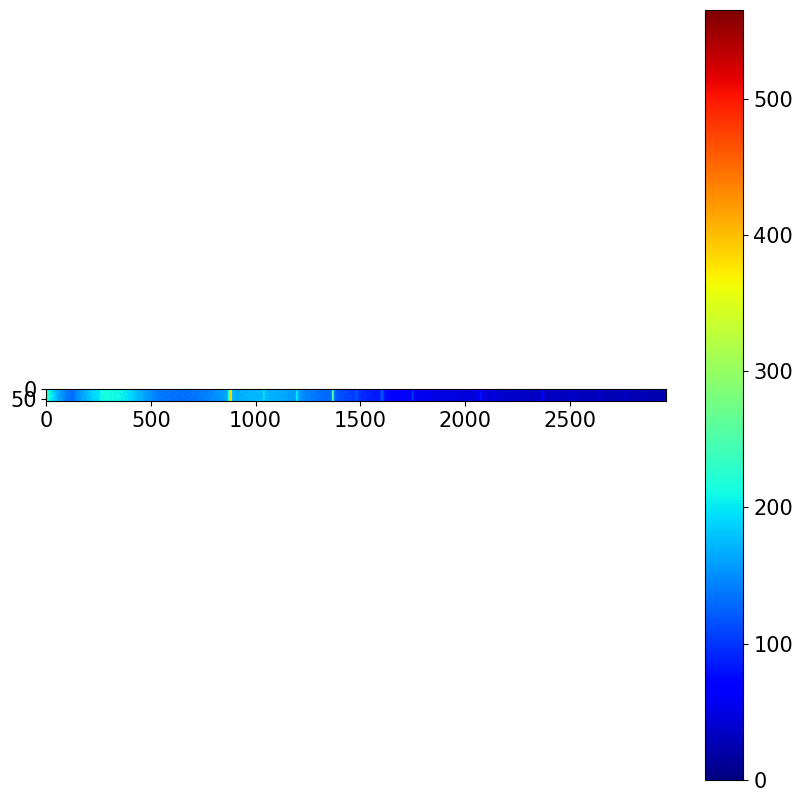

In [207]:
plt.imshow(patterns_agged - floor, cmap = 'jet')
plt.colorbar()

In [235]:
threshold = 15
bg_smooth = 0#20
bg_smooth_post = 20

# nn = 1



slow_q, fast_q, slow_T, fast_T = sep.separate_signal(patterns_agged,
                                background_after_filter = False,
                                threshold = threshold, smooth_q = 1.5,
                                smooth_neighbor_background = 0,
                                smooth_q_background = 4,
                                 bg_fill_method = 'simple')

agged_background = np.median(slow_q, axis = 0)

median_bg = get_rolling_median(slow_q.T, 20).T
median_bg = get_rolling_median(slow_q, 20)


# bg_agged = background.reshape(60 // nn, nn, -1).mean(axis = 1)


background_variation = slow_q - np.mean(slow_q, axis = 0)

(0, 0)


In [236]:
%matplotlib inline
matplotlib.rcParams['figure.figsize'] =(10, 4)
# sep.iplot_rows(patterns, background)
# plt.ylim((0, 100))
istart, iend = 1000, 2000
sep.iplot_rows(patterns_agged[:, istart:iend], background[:, istart:iend],
               np.vstack([agged_background for _ in range(len(patterns_agged))])[:, istart:iend],
              median_bg[:, istart:iend])
# )

interactive(children=(IntSlider(value=29, description='i', max=59), Output(layout=Layout(height='550px'))), _d…

/tmp/ipykernel_62552/3412530072.py:18: RuntimeWarning: divide by zero encountered in log
  plt_heatmap(np.log(patterns_agged - floor), mpl_ax = ax,
/tmp/ipykernel_62552/3412530072.py:44: RuntimeWarning: invalid value encountered in divide
  plt.plot(qsub, 100 * stderr / mean, label = 'standard error / mean (percent)')


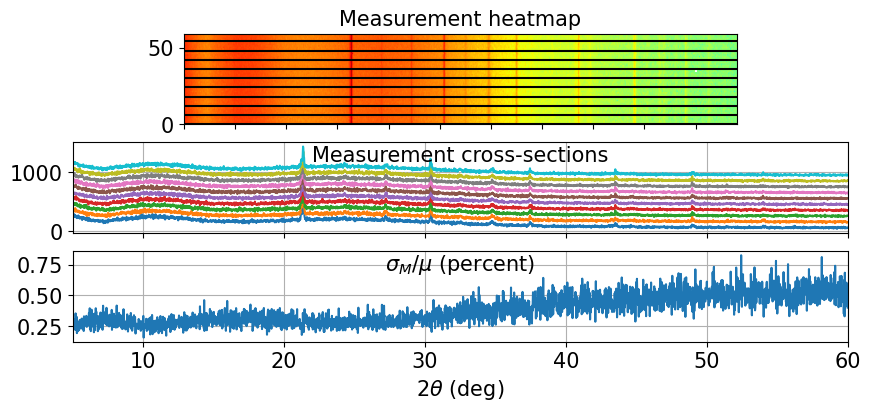

In [237]:
plot_fig1(1); # this works (i think), just takes a while to run

# Fig. 3

10
-7.29740107118144


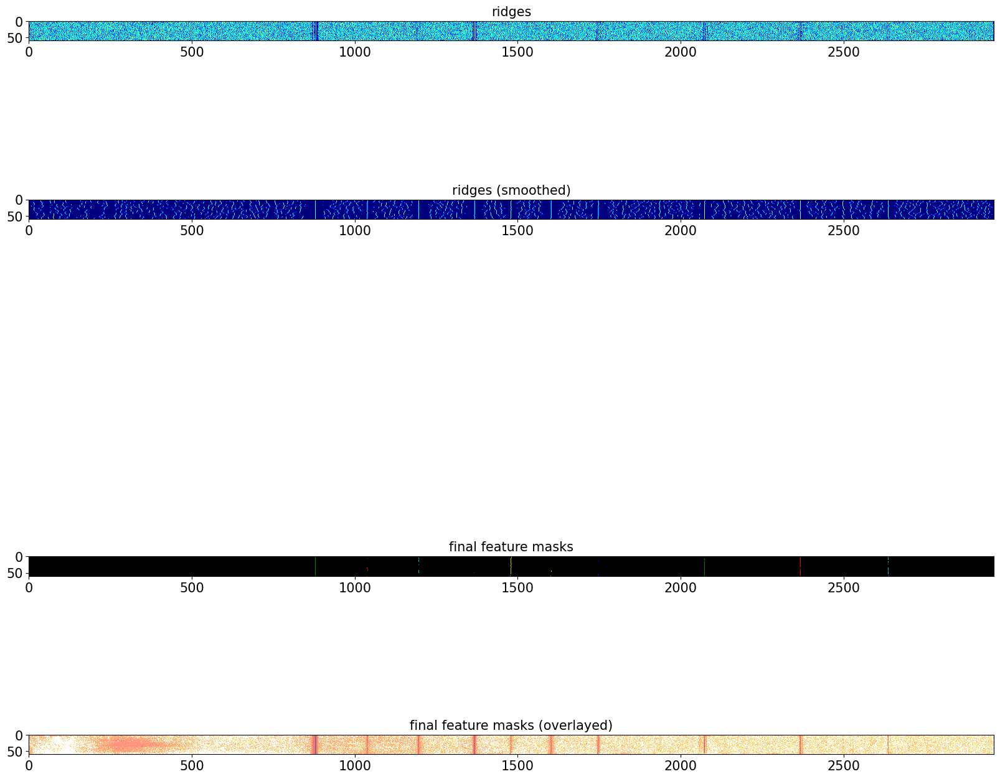

In [238]:
matplotlib.rcParams['figure.figsize'] =(10, 10)

a, b = 5, 1

background = median_bg
# background = slow_q



patterns_pp = patterns_agged - background
labeled, feature_masks, activations, _norm, activations_n1 = default_featurize(patterns_pp,
                                                                              smooth_ax1 = 4,
                                                                              threshold_percentile = 15,
                                                                              thicken_ax1=0,
                                                                              thicken_ax0 = 0,
                                                                              size_thresh = 59,
                                                                              sizetype='count');

labeled = feat.shuffle(labeled, thicken_ax0 = 0, thicken_ax1= 5, sign = False)

In [239]:
def clip_neg(arr, offset = 1):
    arr = arr.copy()
    arr[arr < 0] = 0
    arr += offset
    return arr

In [240]:
from importlib import reload
reload(feat)

<module 'xrdc.featurization' from '/home/ollie/anaconda3/envs/tf/lib/python3.9/site-packages/xrdc-1.0-py3.9.egg/xrdc/featurization.py'>

In [329]:
letters = ['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
def iter_letters():
    for l in letters:
        yield l

/tmp/ipykernel_62552/1084114702.py:12: RuntimeWarning: divide by zero encountered in log
  agged_with_offset = np.log(patterns_agged - patterns_agged.min())
/tmp/ipykernel_62552/1084114702.py:19: RuntimeWarning: divide by zero encountered in log
  plt_heatmap(np.log(patterns_agged - floor), mpl_ax = ax,
/tmp/ipykernel_62552/1084114702.py:35: RuntimeWarning: invalid value encountered in divide
  ax.plot(qsub, 100 * stderr / mean, label = 'standard error / mean (percent)')


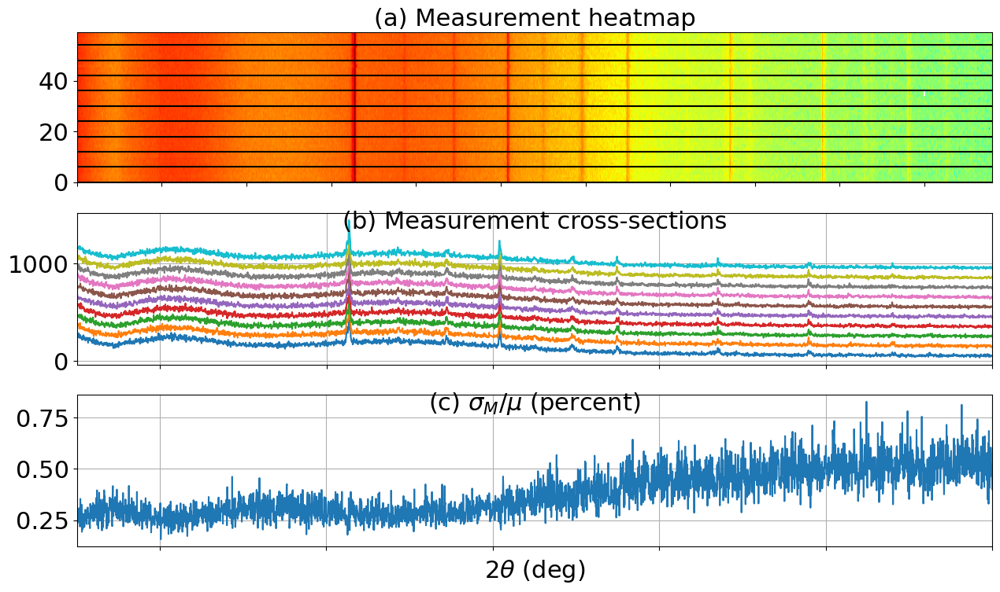

In [284]:
mpl.rcParams['figure.figsize'] =(15, 8.5)
setfonts(22, 22)

fig, axes = plt.subplots(nrows=3, ncols=1)
it = iter(axes)

# floor = np.median(patterns_agged - background, axis = 0).min()#(np.median(patterns_agged, axis = 0) - np.median(background, axis = 0)).min()
floor = patterns_agged.min()

heatmap_aspect = .15#10 * nn

agged_with_offset = np.log(patterns_agged - patterns_agged.min())
vmin = np.nanmin(agged_with_offset[agged_with_offset != -np.inf])
vmax = np.nanmax(agged_with_offset[agged_with_offset != np.inf])

ax = next(it)
letts = iter_letters()
rawname = 'Measurement'
plt_heatmap(np.log(patterns_agged - floor), mpl_ax = ax,
       title = '({}) Measurement heatmap'.format(next(letts)), hide_xlabels = True)
ax.hlines(list(range(len(patterns_agged)))[::6], 0, 100, color = 'k')


ax = next(it)
ax.autoscale(enable=True, axis='x', tight=True)
waterfall(patterns_agged[::6], 100 * bs, qsub, mpl_ax=ax)
#waterfall(agged, 100 * bs, qsub)
ax.grid()
ax.set_xticklabels([])
ax.set_title('({}) Measurement cross-sections'.format(next(letts)), y=1.0, pad=-14)


ax = next(it)
ax.plot(qsub, 100 * stderr / mean, label = 'standard error / mean (percent)')
ax.autoscale(enable=True, axis='x', tight=True)
ax.set_title('({}) $\sigma_M / \mu$ (percent)'.format(next(letts)), y=1.0, pad=-14)
ax.set_xticklabels([])

plt.xlabel('$2 \\theta$ (deg)')
ax.grid()


/tmp/ipykernel_62552/97793966.py:14: RuntimeWarning: divide by zero encountered in log
  agged_with_offset = np.log(patterns_agged - patterns_agged.min())
/tmp/ipykernel_62552/97793966.py:20: RuntimeWarning: divide by zero encountered in log
  plt_heatmap(np.log(patterns_agged - floor), mpl_ax = ax,


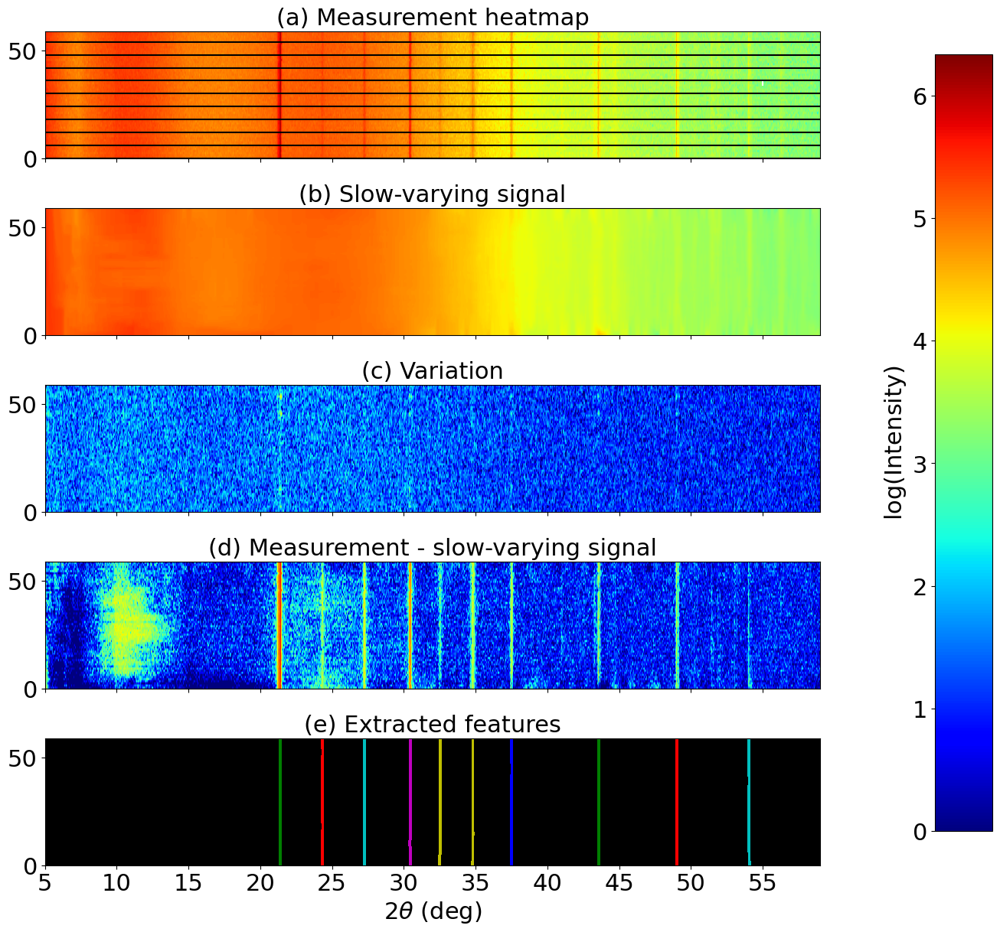

In [292]:
mpl.rcParams['figure.figsize'] =(15, 14.5)
setfonts(22, 22)

fig, axes = plt.subplots(nrows=5, ncols=1)
it = iter(axes)
letts = iter_letters()


# floor = np.median(patterns_agged - background, axis = 0).min()#(np.median(patterns_agged, axis = 0) - np.median(background, axis = 0)).min()
floor = patterns_agged.min()

heatmap_aspect = .15#10 * nn

agged_with_offset = np.log(patterns_agged - patterns_agged.min())
vmin = np.nanmin(agged_with_offset[agged_with_offset != -np.inf])
vmax = np.nanmax(agged_with_offset[agged_with_offset != np.inf])

ax = next(it)
rawname = 'Measurement'
plt_heatmap(np.log(patterns_agged - floor), mpl_ax = ax,
       title = '({}) Measurement heatmap'.format(next(letts)), hide_xlabels = True)
ax.hlines(list(range(len(patterns_agged)))[::6], 0, 100, color = 'k')

# plt.imshow(np.log(np.abs(fast_T)), cmap = 'jet', aspect = heatmap_aspect)
bgname = 'Slow-varying signal'
ax = next(it)
plt_heatmap(np.log(background - floor), mpl_ax = ax, vmin = vmin, vmax = vmax, title = '({}) '.format(next(letts)) + bgname,
           hide_xlabels = True)



# plt.imshow(np.log(background), cmap = 'jet', aspect = heatmap_aspect, interpolation = 'none',
#           vmax = np.log(patterns).max())
varname = 'Variation'
ax = next(it)
plt_heatmap(np.log(np.abs(fast_T)), mpl_ax = ax, vmin = vmin, vmax = vmax, title = '({}) '.format(next(letts)) + varname,
           hide_xlabels = True)

signame = 'Measurement - slow-varying signal'
ax = next(it)
im = plt_heatmap(np.log(clip_neg(patterns_agged - background)),
            mpl_ax= ax, vmin = vmin, vmax = vmax, title = '({}) '.format(next(letts)) + signame,
                hide_xlabels = True)

featname = 'Extracted features'
ax = next(it)
plt_heatmap((labeled % 7) + (labeled != 0), interpolation = 'none', mpl_ax = ax, title = '({}) '.format(next(letts)) + featname,
           hide_xlabels = False, cmap = feat.int_colorcycle)
plt.xlabel('$2 \\theta$ (deg)')


cbar_ax = fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([.9, 0.15, 0.05, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('$\log(\mathrm{Intensity})$')
cbar.ax.yaxis.set_label_position('left')
cbar.ax.yaxis.set_ticks_position('left')

fig.show()

(0, 0)
Peak at 69, start iteration with error = 3.1220401228453927
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 

Peak at 67, start iteration with error = 1.218949109298246
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 

Peak at 207, iteration 0: error = -6.707693399122363
bounds ([-29.8, -6493.201192221655, 0, 0, 0], [625.8, inf, inf, 596.0, 596.0])
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 

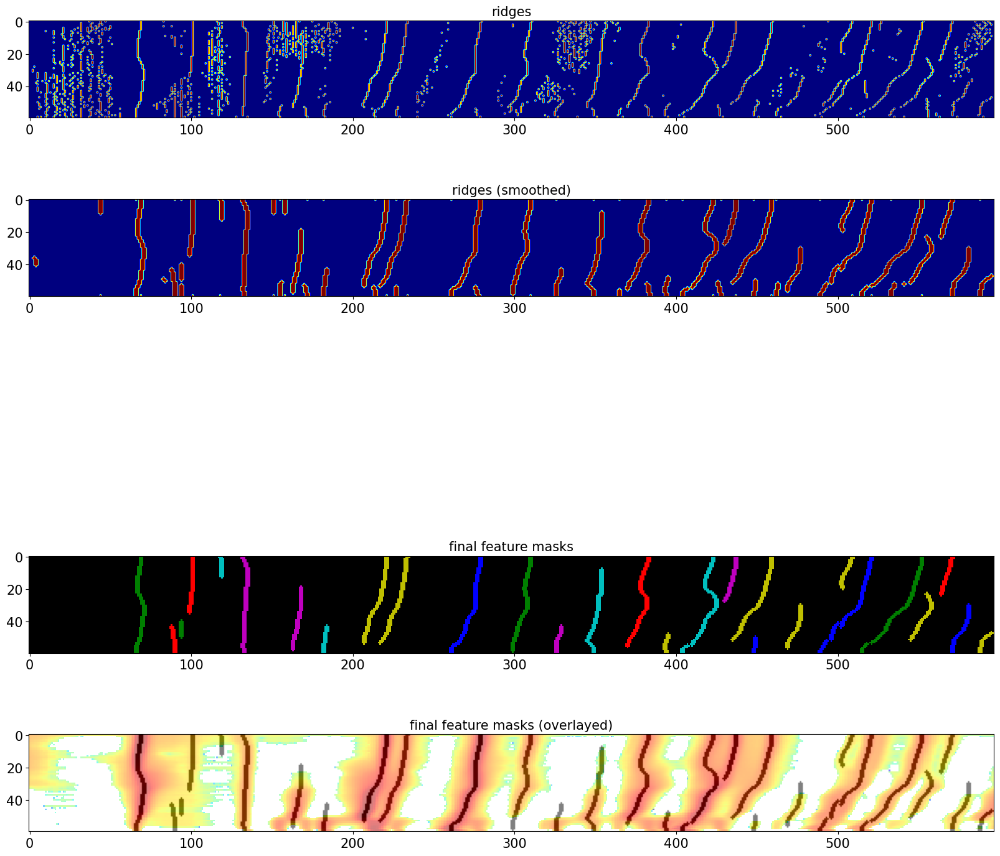

In [231]:
slow_q, fast_q, slow_T, fast_T = sep.separate_signal(d2d.patterns)
background = get_rolling_median_2d(slow_q, agg0 = 20, agg1 = 20)

patterns_pp = d2d.patterns - background
labeled, feature_masks, activations, _norm, activations_n1 = default_featurize(patterns_pp);

In [218]:
straight_feature_map = feat.get_peakshift_corrected_heatmap(patterns_pp, activations, labeled)

/tmp/ipykernel_62552/3669306002.py:16: RuntimeWarning: divide by zero encountered in log
  plt_heatmap(np.log(d2d.patterns - floor), mpl_ax = ax, vmin = vmin, vmax = vmax,


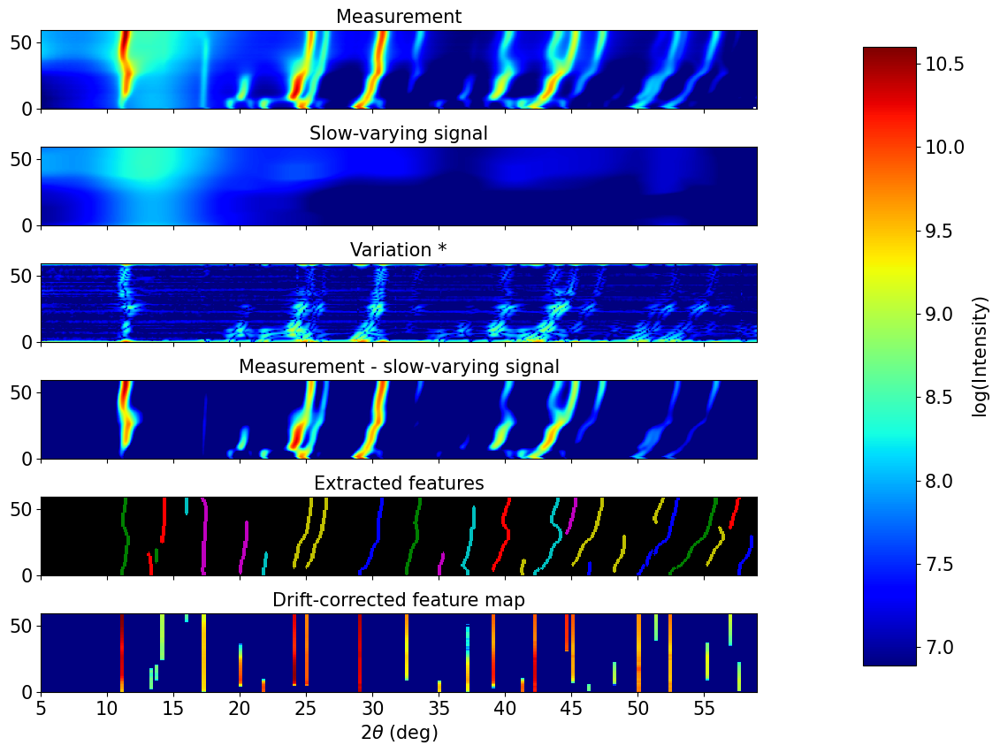

In [191]:
# TODO font size
mpl.rcParams['figure.figsize'] =(12, 10)

fig, axes = plt.subplots(nrows=6, ncols=1)

# floor = 0#patterns_agged.min()
floor = d2d.patterns.min()

heatmap_aspect = .10#10 * nn

agged_with_offset = np.log(d2d.patterns)
vmin = np.nanmin(agged_with_offset[agged_with_offset != -np.inf])
vmax = np.nanmax(agged_with_offset[agged_with_offset != np.inf])

ax = axes[0]
plt_heatmap(np.log(d2d.patterns - floor), mpl_ax = ax, vmin = vmin, vmax = vmax,
           title = rawname, hide_xlabels = True)



ax = axes[1]
plt_heatmap(np.log(background - floor), mpl_ax = ax, vmin = vmin, vmax = vmax, title = bgname,
           hide_xlabels = True)


ax = axes[2]
# plt_heatmap(np.log(np.abs(fast_T)), mpl_ax = ax, vmin = vmin, vmax = vmax, title = 'Noise',
#            hide_xlabels = True)
# plt_heatmap(np.log(np.abs(fast_T / d2d.patterns)), mpl_ax = ax, title = varname,
#            hide_xlabels = True)
plt_heatmap(np.log(np.abs(fast_T)), mpl_ax = ax, title = varname + ' *',
           hide_xlabels = True, vmax = vmax, vmin = vmin / 4)


ax = axes[3]
im = plt_heatmap(np.log(clip_neg(d2d.patterns - background)),
            mpl_ax= ax, vmin = vmin, vmax = vmax, title = signame,
                hide_xlabels = True)

ax = axes[4]
plt_heatmap(((labeled % 7) + (labeled != 0)) * (clip_neg(straight_feature_map) > 0),
            interpolation = 'none', mpl_ax = ax,
            title = featname,
           hide_xlabels = True, cmap = feat.int_colorcycle)

ax = axes[5]
plt_heatmap(np.log(clip_neg(straight_feature_map) + 1), interpolation = 'none', mpl_ax = ax,
            title = 'Drift-corrected feature map',
           hide_xlabels = False, cmap = 'jet')

# feat.imshow_labeled(labeled, aspect = 2.18)

plt.xlabel('$2 \\theta$ (deg)')


cbar_ax = fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([.9, 0.15, 0.05, 0.7])
cbar = fig.colorbar(im, cax=cbar_ax)
cbar.set_label('$\log(\mathrm{Intensity})$')
# cbar.ax.yaxis.set_label_position('left')
# cbar.ax.yaxis.set_ticks_position('left')

fig.show()

In [177]:
np.log(np.abs(fast_T / d2d.patterns)).max()

0.8495619528815742

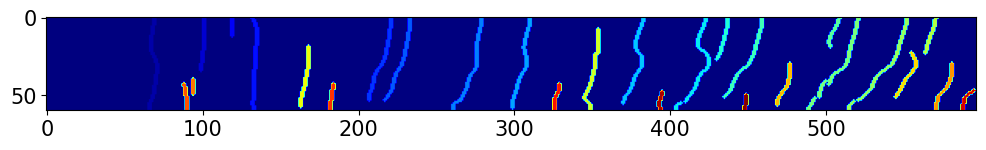

In [136]:
plt.imshow(100 * labeled, cmap = 'jet')

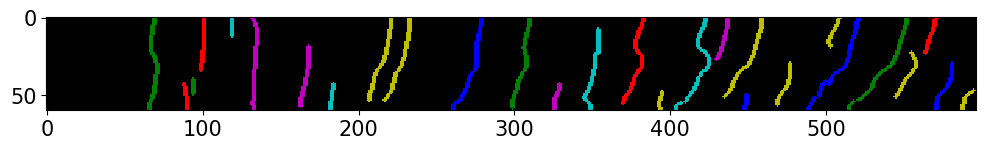

In [141]:
plt.imshow((labeled % 7) + (labeled != 0), interpolation='none', cmap = feat.int_colorcycle)

# Fig 5/6

signed False


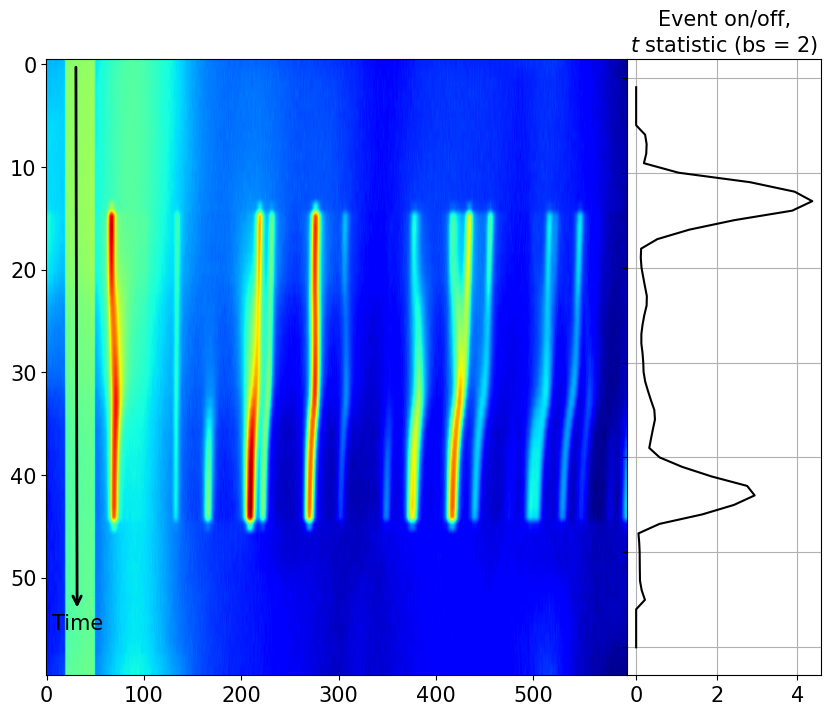

In [2145]:
from xrdc.datasets import d2d

plt.rcParams["figure.figsize"] = [10, 8]

synthetic = (d2d.patterns - background).copy()

extra_background = np.zeros_like(synthetic)


synthetic[:15, :] = 0
synthetic[-15:, :] = 0
synthetic += background

extra_background[:, 20:50] = np.max(synthetic) / 10
synthetic += extra_background

synthetic = gf(synthetic, (.5, 0.5))
#synthetic = gf(synthetic, (0, 0))

synthnoise = np.random.normal(size = np.prod(synthetic.shape)).reshape(synthetic.shape) * 30
# synthnoise = resample(np.vstack([fast_T[15:45, :], fast_T[15:45, :]]))
# synthnoise = resample(synthnoise.T).T
synthetic += synthnoise

bs = 2
zscoresT, cdfsT = noise.padded_zscores(synthetic.T, bs, noise.mk_peak_blocksize(synthetic.T, bs, ptype='square'),
                     shifts=False, mode = 'agg_first', signed = False)
zscoresT[:2 * bs + 1] = 0
zscoresT[-2 * bs - 1:] = 0

gs0 = matplotlib.gridspec.GridSpec(1,2, width_ratios=[3,1])
fig1 = plt.figure()

# fig1.subplots_adjust(hspace=0)

ax11 = fig1.add_subplot(gs0[0])
ax12 = fig1.add_subplot(gs0[1])


# ax12.tick_params(
#     axis='x',          # changes apply to the x-axis
#     which='both',      # both major and minor ticks are affected
#     bottom=False,      # ticks along the bottom edge are off
#     top=False,         # ticks along the top edge are off
#     labelbottom=False) 



aoff = 30
ax11.imshow(np.log(synthetic), cmap = 'jet', aspect = 10.55)
ax11.annotate("Time", xy=(aoff, 0.), xytext=(aoff -25, 55),
            arrowprops=dict(arrowstyle="<-", lw = 2))

# fig1.subplots_adjust(left=0.2)

# yticks = ax12.yaxis.get_major_ticks() 
# yticks[0].label1.set_visible(False)



ax12.plot(zscoresT, np.arange(len(synthetic)), color = 'k')
ax12.set_yticklabels([]);
ax12.grid()
ax12.set_title('Event on/off,\n$t$ statistic (bs = 2)')
fig1.subplots_adjust(wspace=0)


# ax12.tick_params(
#     axis='y',          # changes apply to the x-axis
#     which='both',      # both major and minor ticks are affected
#     left=False,      # ticks along the bottom edge are off
#     top=False,         # ticks along the top edge are off
#     labelbottom=False) 

In [2146]:
reload(feat)

<module 'xrdc.featurization' from '/home/ollie/anaconda3/envs/tf/lib/python3.9/site-packages/xrdc-1.0-py3.9.egg/xrdc/featurization.py'>

In [2147]:
ifeat = 1


In [2366]:
def find_feat_transitions(ifeat, imin = 2, imax = 47):
    """
    Find where a feature turned on and off, given its label value
    """
    def filt_candidates(ij_candidate_pairs):
        return (ij for ij in ij_candidate_pairs if ij[0] >= imin and ij[0] <= imax)
    def j_of_i(i, ij_candidates):
        js = []
        for ii, jj in ij_candidates:
            if ii == i:
                js.append(jj)
        js = np.array(js)
        js = js[~np.isnan(js)]
#         print(js)
        return int(np.mean(js))
    xmin, xmax, ystart, yend = feat.get_features_range(labeled, ifeat)

    i_on_candidates, j_on_candidates = np.where((thick_labeled == ifeat) & turned_on)
    ij_candidate_pairs = tuple(zip(i_on_candidates, j_on_candidates))
    ij_candidate_pairs = filt_candidates(ij_candidate_pairs)
    i_on_candidates = i_on_candidates[i_on_candidates > 0]
    i_on = max(np.nanpercentile((i_on_candidates), 40, method = 'nearest'), xmin)
#     ij_candidate_pairs += ()
    j_on = j_of_i(i_on, ij_candidate_pairs)
#     print(i_on)
    if len(i_on_candidates) == 0:
        raise ValueError
    

    i_off_candidates, j_off_candidates = np.where((thick_labeled == ifeat) & turned_off)
    ij_candidate_pairs = tuple(zip(i_off_candidates, j_off_candidates))
    ij_candidate_pairs = tuple(filt_candidates(ij_candidate_pairs))

    
    if len(i_off_candidates) == 0:
        raise ValueError
    i_off_median = np.nanpercentile((i_off_candidates), 75, method = 'nearest')
    if i_off_median + 1 == len(labeled):
        raise ValueError
    i_off = min(i_off_median, xmax)

        
    if len(ij_candidate_pairs) > 0:
        i_off = min(i_off_median, xmax)
    else:
        i_off = xmax
    if i_off < i_on:
        raise ValueError
    j_off = j_of_i(i_off, ij_candidate_pairs)


#     print(i_on, i_off)
    return (i_on, j_on), (i_off, j_off)

def filter_feat(ifeat, labeled, bound_coords):
#     (xmin, _), (xmax, _) = find_feat_transitions(ifeat)
    new = labeled.copy()
    try:
        (xmin, ystart), (xmax, yend) = find_feat_transitions(ifeat)
        featmask = labeled == ifeat
        vi, hi = np.indices(labeled.shape)
        outside_mask = ((vi < xmin) | (vi > xmax))
        inside_mask = ~outside_mask
        xormask = outside_mask & featmask

        bound_coords[ifeat] = ((xmin, ystart), (xmax, yend))
        return new * (~xormask)
    except ValueError:
        print('dropping feature', ifeat)
        new[new == ifeat] = 0
        return new

def filter_feats(labeled):
    coords = dict()
    reducer = lambda lab1, idx: filter_feat(idx, lab1, coords)
    return reduce(reducer, list(range(1, labeled.max() + 1)), labeled), coords

In [2367]:
#tmp = labeled.copy()
labeled = tmp.copy()
labeled[-15:, :] = 0

In [2521]:
bsi, bsj = 2, 4
zthresh = 3
nboot = 100

from functools import reduce

from numpy.lib.stride_tricks import sliding_window_view as window

def boot_flat(arr, N = 10):
    flat = arr.ravel()
    return np.vstack([resample(flat, replace = True) for _ in range(N)])

def boot_flat_pair_z(arr1, arr2, N = 100, signed = True):
    samples1 = boot_flat(arr1, N = N)
    samples2 = boot_flat(arr2, N = N)
    diffs = samples1 - samples2
    diff_mu = (arr2 - arr1).mean()
    diff_mu_std = diffs.mean(axis = 1).std(axis = 0)
    if not signed:
        diff_mu = np.abs(diff_mu)
    return diff_mu / (diff_mu_std + 1e-9)

patches = window(synthetic, (bsi, bsj), (0, 1))
patches = noise.to_shape(patches, synthetic.shape + (bsi, bsj), mode = 'edge')[::bsi, ::bsj, ...]
#patches = patches[..., ::]

zstream = np.zeros_like(synthetic)

for i, (row1, row2) in enumerate(zip(patches, patches[1:])):
    for j, (arr1, arr2) in enumerate(zip(row1, row2)):
        zstream[i * bsi][j * bsj] = boot_flat_pair_z(arr1, arr2, N = nboot)
zstream = sep.NDinterpolation(zstream)
zstream[-bsi:, :] = 0
# zstream = gf(zstream, (bsi / 4, bsj / 4))


thick_labeled = feat.shuffle(labeled, thicken_ax0 = 0, thicken_ax1 = 0, sign = False)
high_z_mask = (zstream > zthresh) & (thick_labeled > 0)

low_z_mask = (zstream < -zthresh) & (thick_labeled > 0)
state_changes = high_z_mask

turned_on = (high_z_mask ^ np.roll(high_z_mask, -1, axis = 0)) & high_z_mask
turned_off = (low_z_mask ^ np.roll(low_z_mask, -1, axis = 0)) & low_z_mask

turned_on = feat.shuffle(turned_on, thicken_ax0 = 2, thicken_ax1 = 1)
turned_off = feat.shuffle(turned_off, thicken_ax0 = 2, thicken_ax1 = 1)

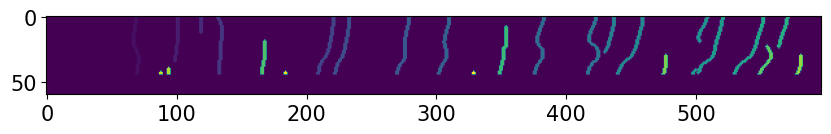

In [2522]:
plt.imshow(labeled)

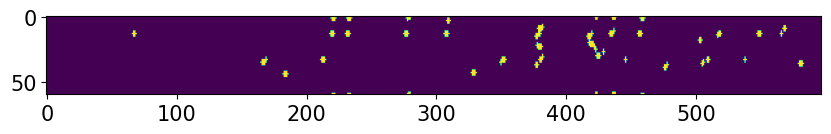

In [2523]:
plt.imshow(turned_on)

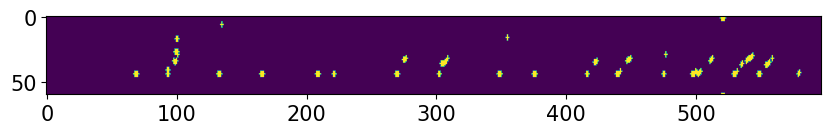

In [2524]:
plt.imshow(turned_off)

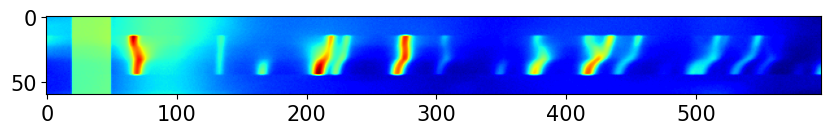

In [2525]:
plt.imshow(np.log(synthetic), cmap = 'jet')

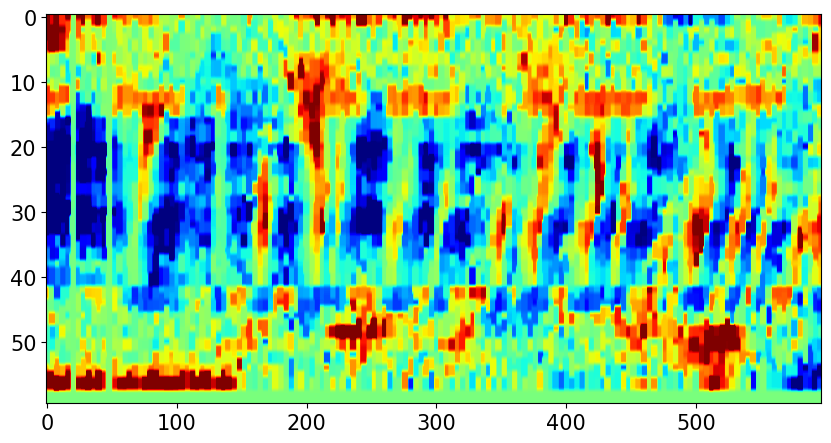

In [2526]:
plt.imshow(zstream, cmap = 'jet', vmin = -5, vmax = 5, aspect = 5)
# plt.colorbar()

In [2527]:
stream_labeled, coords = filter_feats(labeled);

dropping feature 2
dropping feature 3
dropping feature 4
dropping feature 11
dropping feature 13
dropping feature 16
dropping feature 19
dropping feature 22
dropping feature 23
dropping feature 24
dropping feature 25


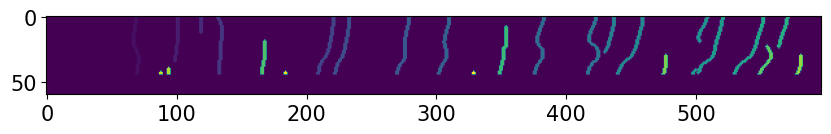

In [2528]:
plt.imshow(labeled)

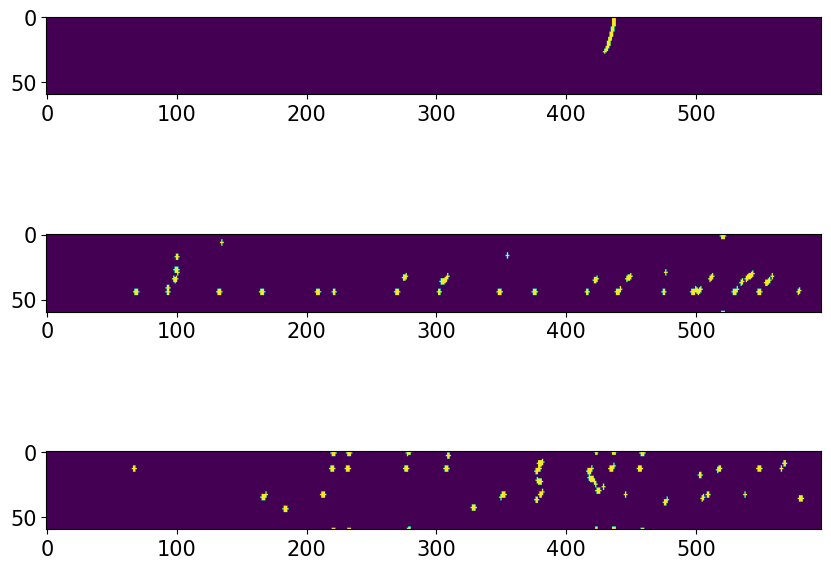

In [2529]:
ii = 11
lmask = labeled == ii
a, b = 3, 1
plt.subplot(a, b, 1)
plt.imshow(lmask)

plt.subplot(a, b, 2)
plt.imshow(turned_off * lmask + turned_off)

plt.subplot(a, b, 3)
plt.imshow(turned_on * lmask + turned_on)

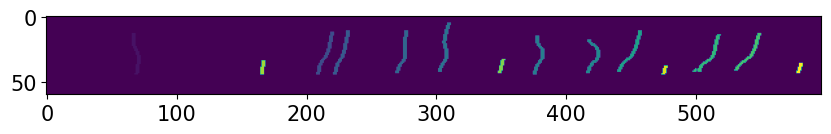

In [2530]:
plt.imshow(stream_labeled)

In [2531]:
from xrdc import visualization as vis

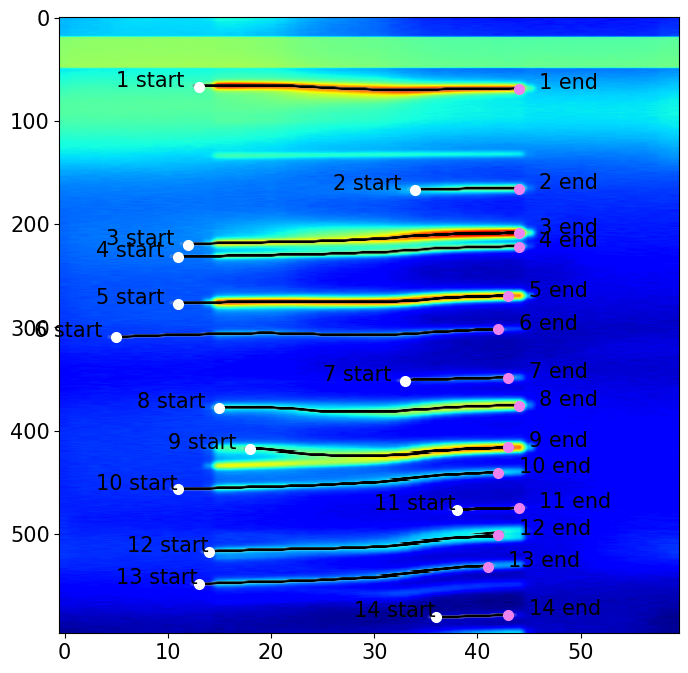

In [2532]:
def plot_endpoints(coords, transpose = True, text = True,
                  size = 7, start_suff = ' start', end_suff = ' end',
                  text_offset_2 = 8, text_offset = 2, flip_y_coords = False):
    
    nsamples = len(synthetic)
    
    for ifeat, ((xstart, ystart), (xend, yend)) in enumerate(sorted(coords.values(), key=lambda tup: tup[0][1])):
        if transpose:
            (xstart, ystart), (xend, yend) = (ystart, xstart), (yend, xend)
        if flip_y_coords:
            ystart, yend = nsamples - ystart - 1, nsamples - yend - 1
        plt.plot([ystart], [xstart], 'o', color = 'white', markersize = size)
        plt.plot([yend], [xend], 'o', color = 'violet', markersize = size)
        if text:
            plt.text(ystart - text_offset_2, xstart, '{}{}'.format(ifeat + 1, start_suff))
            plt.text(yend + text_offset, xend, '{}{}'.format(ifeat + 1, end_suff))
#plt.imshow(np.log(synthetic.T), aspect = .1, cmap = 'jet')
# plt.imshow(np.sign(stream_labeled).T, aspect = .1, cmap = 'Greys', alpha = .5)
vis.overlay_mask(np.log(synthetic.T), np.sign(stream_labeled).T.astype(float),
                 ax = plt, aspect = .1)
plot_endpoints(coords)

Text(0.5, 1.0, 'Numbered events')

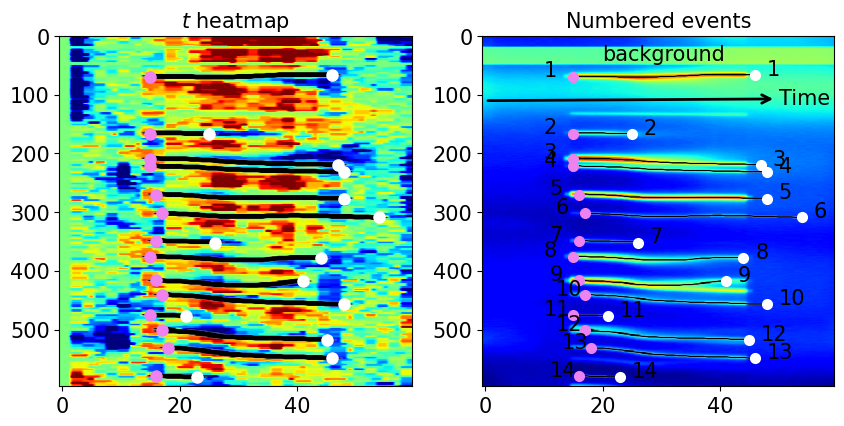

In [2546]:
a, b = 1, 2

plt.subplot(a, b, 1)
traces = feat.shuffle(np.sign(stream_labeled).T.astype(float), thicken_ax0=3)

plt.title('$t$ heatmap')
vis.overlay_mask((-zstream.T)[:, ::-1], traces[:, ::-1],
                 ax = plt, aspect = .1, vmin = -5, vmax = 5)
plot_endpoints(coords, text = False, size = 8, flip_y_coords = True)

plt.subplot(a, b, 2)
plt.title('')
vis.overlay_mask(np.log(synthetic.T)[:, ::-1], np.sign(stream_labeled).T.astype(float)[:, ::-1],
                 ax = plt, aspect = .1)
plot_endpoints(coords, start_suff='', end_suff='',
               text_offset = -5, text_offset_2=-2, flip_y_coords=True)

bgoff = 5
plt.annotate("background", xy=(0, bgoff + 30.), xytext=(20, bgoff + 37))

aoff = 80
plt.annotate("Time", xy=(0, aoff + 30.), xytext=(50, aoff + 37),
            arrowprops=dict(arrowstyle="<-", lw = 2))
plt.title('Numbered events')

Text(50, 37, 'Time')

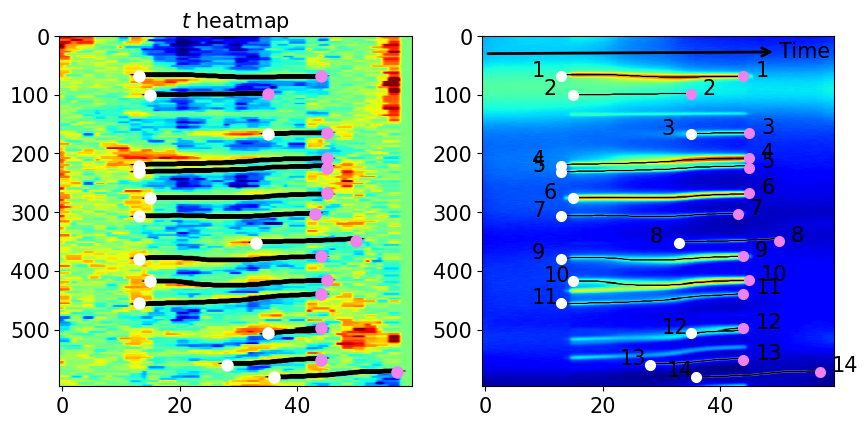

In [1703]:
a, b = 1, 2

plt.subplot(a, b, 1)
traces = feat.shuffle(np.sign(stream_labeled).T.astype(float), thicken_ax0=3)

plt.title('$t$ heatmap')
vis.overlay_mask(zstream.T, traces,
                 ax = plt, aspect = .1, vmin = -8, vmax = 8)
plot_endpoints(coords, text = False, size = 8)

plt.subplot(a, b, 2)
plt.title('')
vis.overlay_mask(np.log(synthetic.T), np.sign(stream_labeled).T.astype(float),
                 ax = plt, aspect = .1)
plot_endpoints(coords, start_suff='', end_suff='', text_offset_2=5)

plt.annotate("Time", xy=(0, 30.), xytext=(50, 37),
            arrowprops=dict(arrowstyle="<-", lw = 2))

Text(50, 37, 'Time')

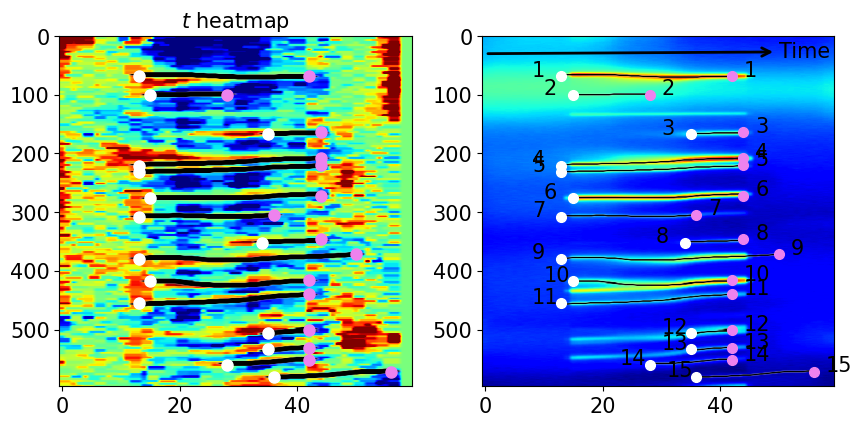

In [1670]:
a, b = 1, 2

plt.subplot(a, b, 1)
traces = feat.shuffle(np.sign(stream_labeled).T.astype(float), thicken_ax0=3)

plt.title('$t$ heatmap')
vis.overlay_mask(zstream.T, traces,
                 ax = plt, aspect = .1, vmin = -5, vmax = 5)
plot_endpoints(coords, text = False, size = 8)

plt.subplot(a, b, 2)
plt.title('')
vis.overlay_mask(np.log(synthetic.T), np.sign(stream_labeled).T.astype(float),
                 ax = plt, aspect = .1)
plot_endpoints(coords, start_suff='', end_suff='', text_offset_2=5)

plt.annotate("Time", xy=(0, 30.), xytext=(50, 37),
            arrowprops=dict(arrowstyle="<-", lw = 2))

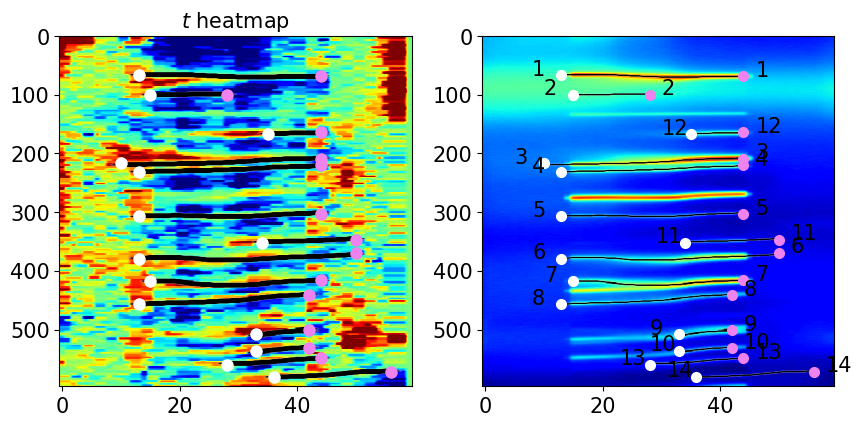

In [1490]:
a, b = 1, 2

plt.subplot(a, b, 1)
traces = feat.shuffle(np.sign(stream_labeled).T.astype(float), thicken_ax0=3)

plt.title('$t$ heatmap')
vis.overlay_mask(zstream.T, traces,
                 ax = plt, aspect = .1, vmin = -5, vmax = 5)
plot_endpoints(coords, text = False, size = 8)

plt.subplot(a, b, 2)
plt.title('')
vis.overlay_mask(np.log(synthetic.T), np.sign(stream_labeled).T.astype(float),
                 ax = plt, aspect = .1)
plot_endpoints(coords, start_suff='', end_suff='', text_offset_2=5)

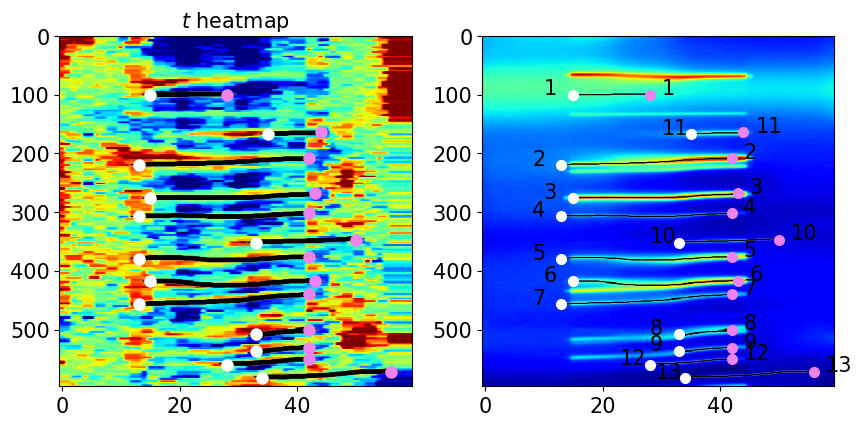

In [1447]:
a, b = 1, 2

plt.subplot(a, b, 1)
traces = feat.shuffle(np.sign(stream_labeled).T.astype(float), thicken_ax0=3)

plt.title('$t$ heatmap')
vis.overlay_mask(zstream.T, traces,
                 ax = plt, aspect = .1, vmin = -5, vmax = 5)
plot_endpoints(coords, text = False, size = 8)

plt.subplot(a, b, 2)
plt.title('')
vis.overlay_mask(np.log(synthetic.T), np.sign(stream_labeled).T.astype(float),
                 ax = plt, aspect = .1)
plot_endpoints(coords, start_suff='', end_suff='', text_offset_2=5)

22.75 43.75
dropping feature 2
dropping feature 3
55.5 44.0
8.0 42.75
7.0 42.75
12.0 43.75
12.5 43.5
3.5 46.0
12.5 44.25
dropping feature 11
12.0 42.75
dropping feature 13
21.0 43.0
48.0 44.0
dropping feature 16
29.0 44.75
28.0 44.5
dropping feature 19
dropping feature 20
dropping feature 21
dropping feature 22
54.0 42.75
dropping feature 24
dropping feature 25
dropping feature 26
dropping feature 27
dropping feature 28


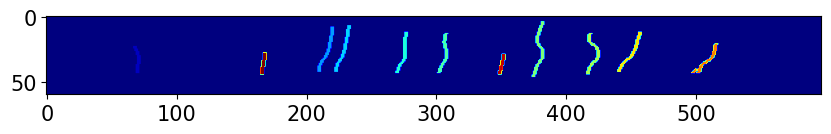

In [784]:
plt.imshow(, cmap = 'jet')

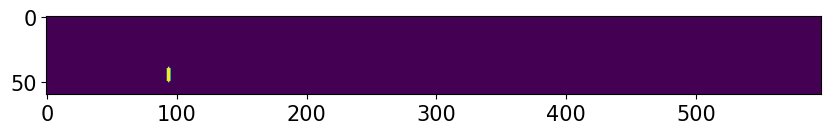

In [710]:
plt.imshow(labeled == 22)

In [419]:
%pdb

Automatic pdb calling has been turned ON


In [83]:
from numpy.lib.stride_tricks import sliding_window_view as window

In [84]:
reload(noise)

<module 'xrdc.noise_analysis' from '/home/ollie/anaconda3/envs/tf/lib/python3.9/site-packages/xrdc-1.0-py3.9.egg/xrdc/noise_analysis.py'>

In [66]:
synthetic.shape

(60, 597)

In [78]:
bsi, bsj = 2, 100
stridei, stridej = 2, 2
patches = window(synthetic, (bsi, bsj), (0, 1))
patches = noise.to_shape(patches, synthetic.shape + (bsi, bsj), mode = 'edge')
#patches = patches[..., ::]

In [235]:
# plot_fig2(4);
# plot_fig2(16);
# plot_fig2(64);

In [236]:
import slide_tricks as st

def mk_blocks(arr, bs):
    a3d = st.sliding_window_view(arr, (len(arr), bs)).squeeze()
    return np.einsum('ijk->jik', (a3d))

In [290]:
def transpose_q(patterns, bs):
    arr2d = mk_blocks(patterns, bs)
    arr2d = arr2d.mean(axis = 0).T
    padsize  = patterns.shape[1] - arr2d.shape[1]
    arr2d = np.pad(arr2d, ((0, 0), (0, padsize)))
    return arr2d

In [291]:
noise.padded_zscores(arr2d, 1, noise.mk_peak_blocksize(arr2d, 1, ptype='square'), shifts=False,
                     mode = 'agg_first')

array([102.34404968,  50.90191018,   0.64715233, ...,   0.63651072,
         0.6673498 ,  27.83086654])

### All 60 patterns averaged, standard error and z scores within q blocks

In [309]:
blocksizes = np.array([2, 4, 8, 16])

# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns

peak = None

sterr_vs_blocksize = np.vstack([noise.boot_stderr(transpose_q(patterns, bs)) for bs in blocksizes])

z_vs_blocksize = np.vstack([
    noise.padded_zscores(transpose_q(patterns, bs),
                         1, noise.mk_peak_blocksize(transpose_q(patterns, bs), 1, ptype='square'),
                         shifts=False,
                     mode = 'agg_first')
        for bs in blocksizes])
z_vs_blocksize[:, :20] = 0
z_vs_blocksize[:, -20:] = 0


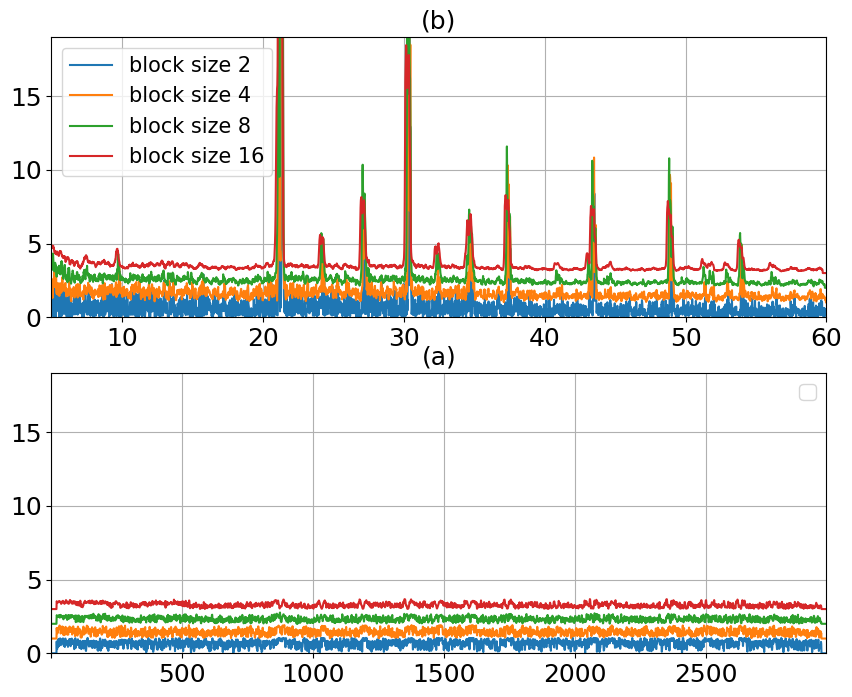

In [318]:
a, b = 2, 1
ymax = 19
ax1 = plt.subplot(a, b, 1)
scale1 = 1
shape = sterr_vs_blocksize.shape[1]
for i, bs in enumerate(blocksizes):
    plt.plot(q, sterr_vs_blocksize[i] + i * scale1, label = 'block size {}'.format(bs))
plt.grid()
plt.ylim(0, ymax)
#plt.xlim(0, shape - 1)
plt.legend()
plt.autoscale(enable=True, axis='x', tight=True)
plt.title('(b)')
xticks = ax1.xaxis.get_major_ticks()
xticks[0].label1.set_visible(False)

ymax = 
ax2 = plt.subplot(a, b, 2)
#plt_lineout(np.abs(arr2d).mean(axis = 0), 3 * offset_scale, label = 'raw (averaged)')
for i, bs in enumerate(blocksizes):
    lineout = z_vs_blocksize[i]
    plt.plot((np.log(1 + lineout - lineout.min()) + scale1 * i))
plt.grid()
plt.ylim(0, ymax)
plt.xlim(0, shape - 1)
plt.legend(loc = 'upper right')
plt.title('(a)')
xticks = ax2.xaxis.get_major_ticks()
xticks[0].label1.set_visible(False)

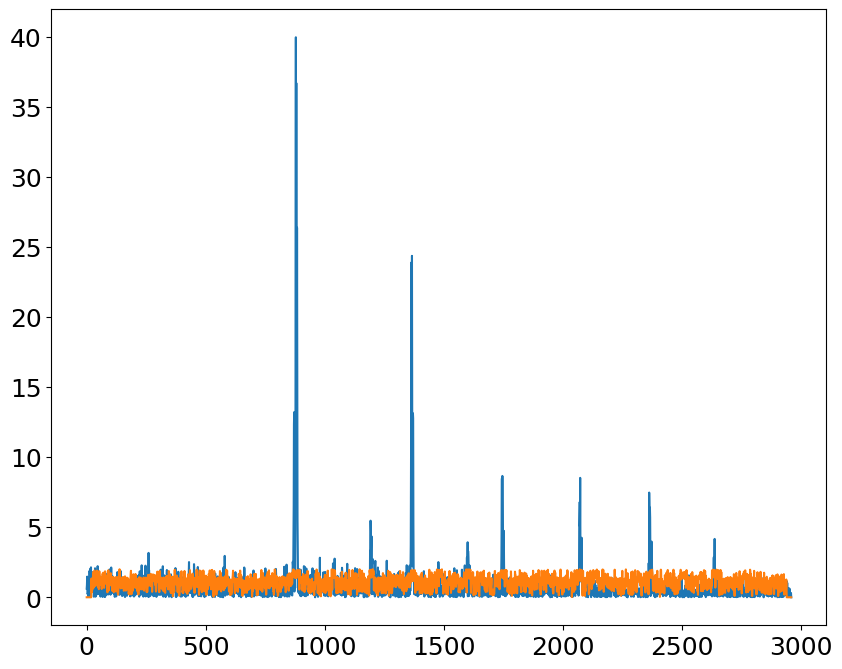

In [304]:
plt.plot(sterr_vs_blocksize[0])
plt.plot(z_vs_blocksize[0])

In [ ]:
print('Overlap = block size - 1')
noise.plot_emv_zscores(arr2d, z_vs_blocksize, q, lineout_indices=[2 - 2, 4 - 2, 8 - 2, 16 - 2],
                    lineout_labels=[2, 4, 8, 16], block_sizes=[2, 4, 8, 16],
                    offset_scale=2.5, ymax = 22, aspect = 17.4)

Variance / z scores with block sizes > 1, N = 60

In [214]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
blocksizes = np.arange(1, 65)
arr2d = patterns

peak = None

# TODO distinguish between stride and block size
z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, 1, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True,
                         mode = 'agg_first')
        for bs in blocksizes[1:]])

In [231]:
reload(noise)

<module 'xrdc.noise_analysis' from '/home/ollie/anaconda3/envs/tf/lib/python3.9/site-packages/xrdc-1.0-py3.9.egg/xrdc/noise_analysis.py'>

Overlap = block size - 1
0
1
2
3


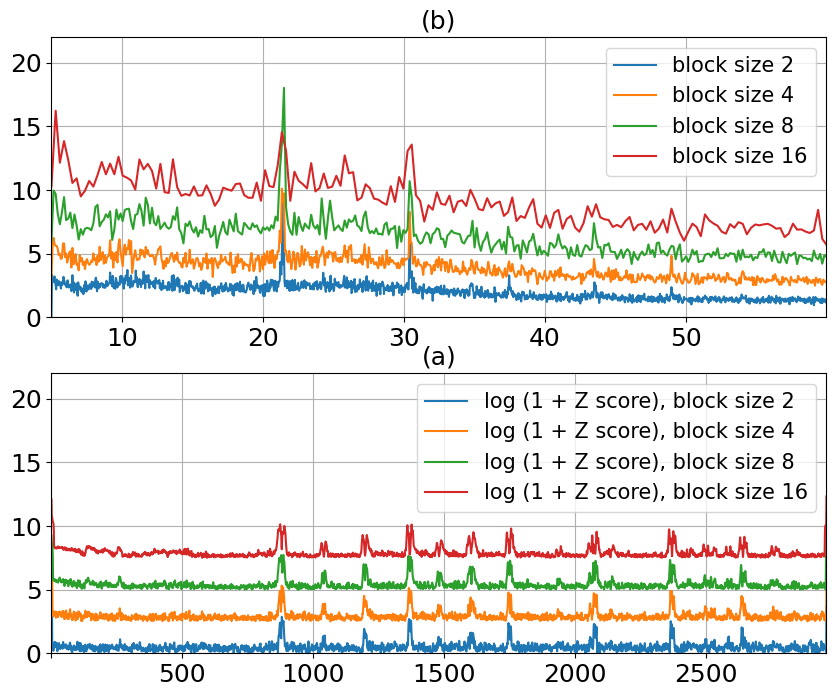

In [232]:
print('Overlap = block size - 1')
noise.plot_emv_zscores(arr2d, z_vs_blocksize, q, lineout_indices=[2 - 2, 4 - 2, 8 - 2, 16 - 2],
                    lineout_labels=[2, 4, 8, 16], block_sizes=[2, 4, 8, 16],
                    offset_scale=2.5, ymax = 22, aspect = 17.4)

In [250]:


# def interleaved_kernel_agg(arr2d, bs):
#     res = []
#     for shift in range(stride):
#         res.append(kernel_agg(arr2d, bs, shift))
#     return zipmerge(res, shape)



In [239]:
patterns[:, ::5].shape

(60, 593)

In [233]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
blocksizes = np.arange(1, 65)
arr2d = patterns.mean(axis= 0)[None, :]

peak = None

# TODO distinguish between stride and block size
z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, 1, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True,
                         mode = 'agg_first')
        for bs in blocksizes[1:]])

Overlap = block size - 1


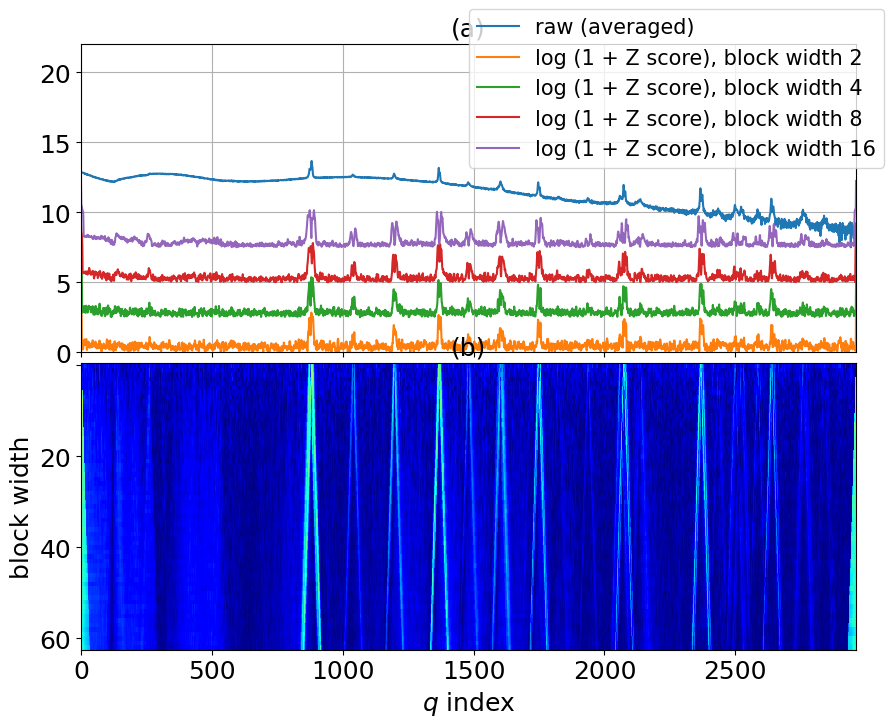

In [182]:
print('Overlap = block size - 1')
noise.plot_twopanel(arr2d, z_vs_blocksize, lineout_indices=[2 - 2, 4 - 2, 8 - 2, 16 - 2],
                    lineout_labels=[2, 4, 8, 16],
                    offset_scale=2.5, ymax = 22, aspect = 17.4)

Overlap = block size - 1


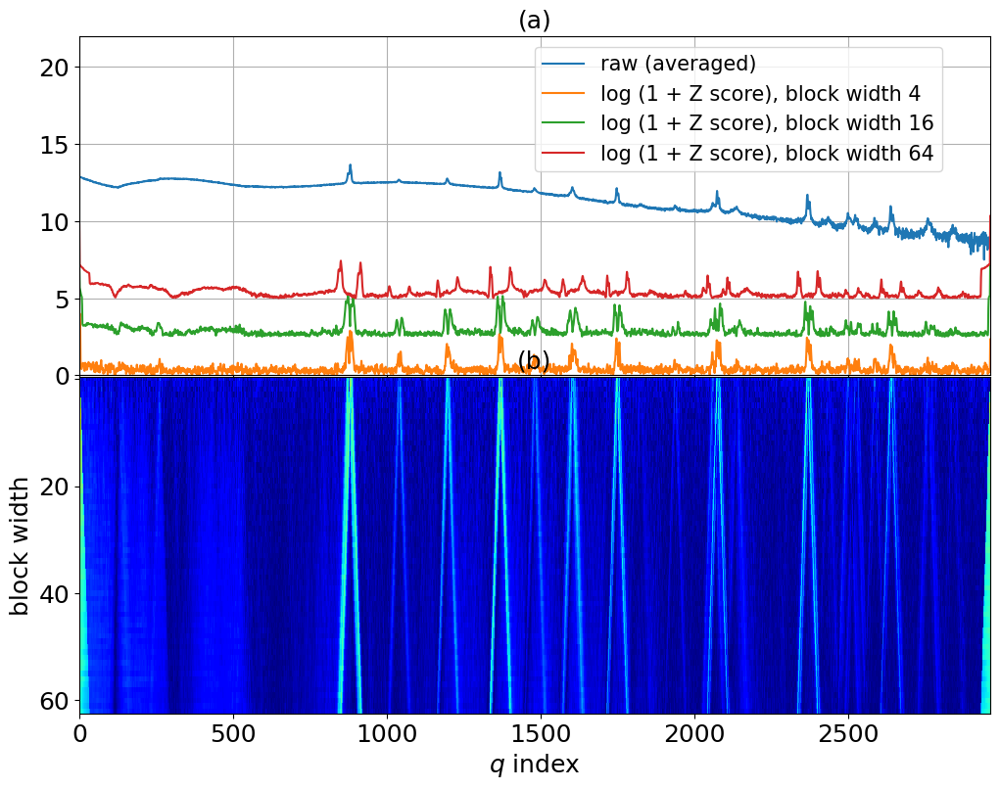

In [118]:
print('Overlap = block size - 1')
noise.plot_twopanel(arr2d, z_vs_blocksize, lineout_indices=[4 - 2, 16 - 2, 64 - 2], lineout_labels=[4, 16, 64],
                   offset_scale=2.5, ymax = 22, aspect = 17.4)

Overlap = block size - 1


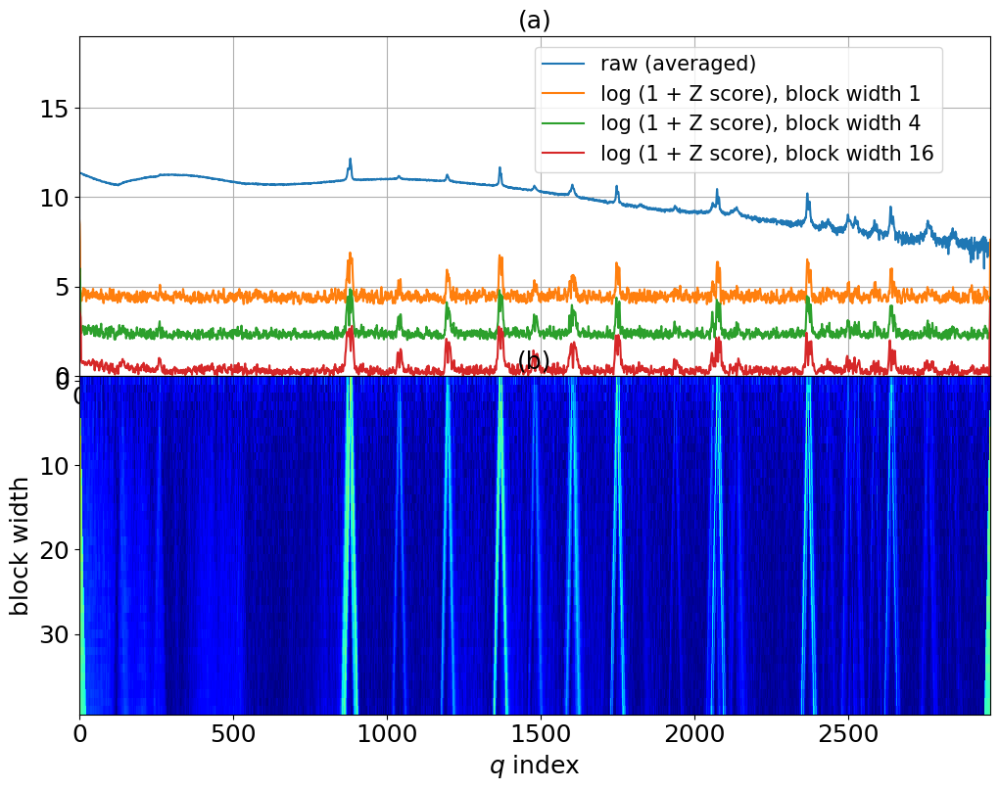

In [237]:
print('Overlap = block size - 1')
plot_twopanel(arr2d, z_vs_blocksize)


In [241]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, 4, mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True)
        for bs in blocksizes])


Overlap = block size - 4


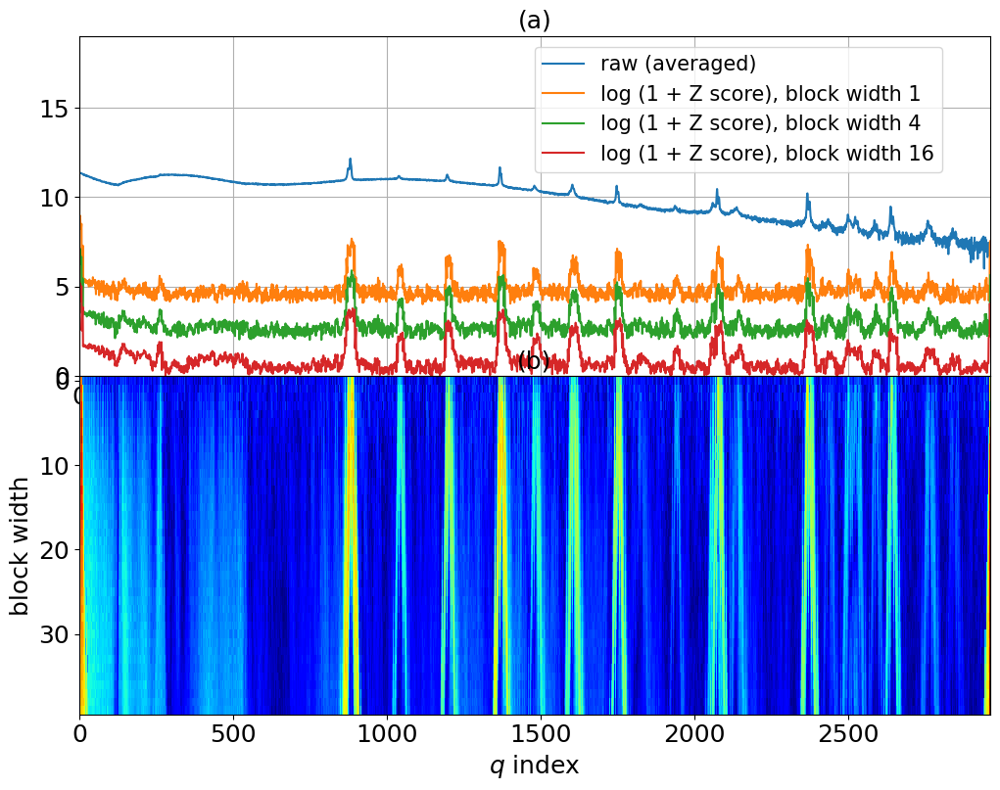

In [242]:
print('Overlap = block size - 4')
plot_twopanel(arr2d, z_vs_blocksize)

### No overlap:

In [70]:
# tmp = z_vs_blocksize

#### pairwise diffs before aggregation

In [49]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
blocksizes = np.arange(1, 41)
arr2d = patterns

peak = None

z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True, mode = 'agg_last')
        for bs in blocksizes])


pairwise (60, 2962)
pairwise (60, 1481)
pairwise (60, 1481)
pairwise (60, 988)
pairwise (60, 988)
pairwise (60, 988)
pairwise (60, 741)
pairwise (60, 741)
pairwise (60, 741)
pairwise (60, 741)
pairwise (60, 593)
pairwise (60, 593)
pairwise (60, 593)
pairwise (60, 593)
pairwise (60, 593)
pairwise (60, 494)
pairwise (60, 494)
pairwise (60, 494)
pairwise (60, 494)
pairwise (60, 494)
pairwise (60, 494)
pairwise (60, 424)
pairwise (60, 424)
pairwise (60, 424)
pairwise (60, 424)
pairwise (60, 424)
pairwise (60, 424)
pairwise (60, 424)
pairwise (60, 371)
pairwise (60, 371)
pairwise (60, 371)
pairwise (60, 371)
pairwise (60, 371)
pairwise (60, 371)
pairwise (60, 371)
pairwise (60, 371)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 330)
pairwise (60, 297)
pairwise (60, 297)
pairwise (60, 297)
pairwise (60, 297)
pairwise (60, 297)
pairwise (60, 297)
pairwise (60, 297)
pairwise 

pairwise (60, 103)
pairwise (60, 103)
pairwise (60, 103)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 99)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwise (60, 96)
pairwis

In [ ]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
blocksizes = np.arange(1, 41)
arr2d = patterns

peak = None

z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True, mode = 'agg_last')
        for bs in blocksizes])


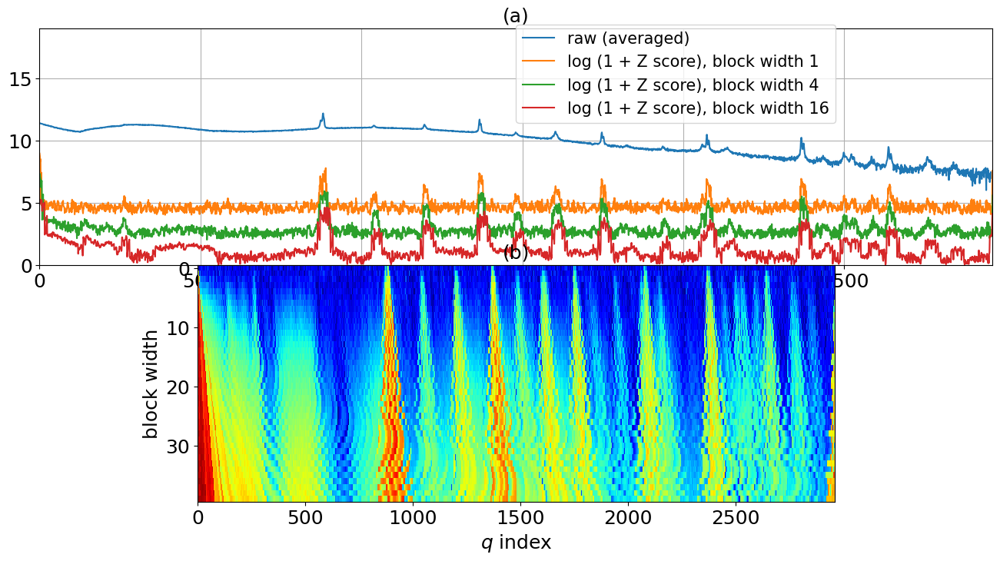

In [133]:
plot_twopanel(arr2d, z_vs_blocksize)

In [243]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, mk_peak_blocksize(patterns, bs, ptype='square'), shifts=True)
        for bs in blocksizes])


Overlap = block size - 4


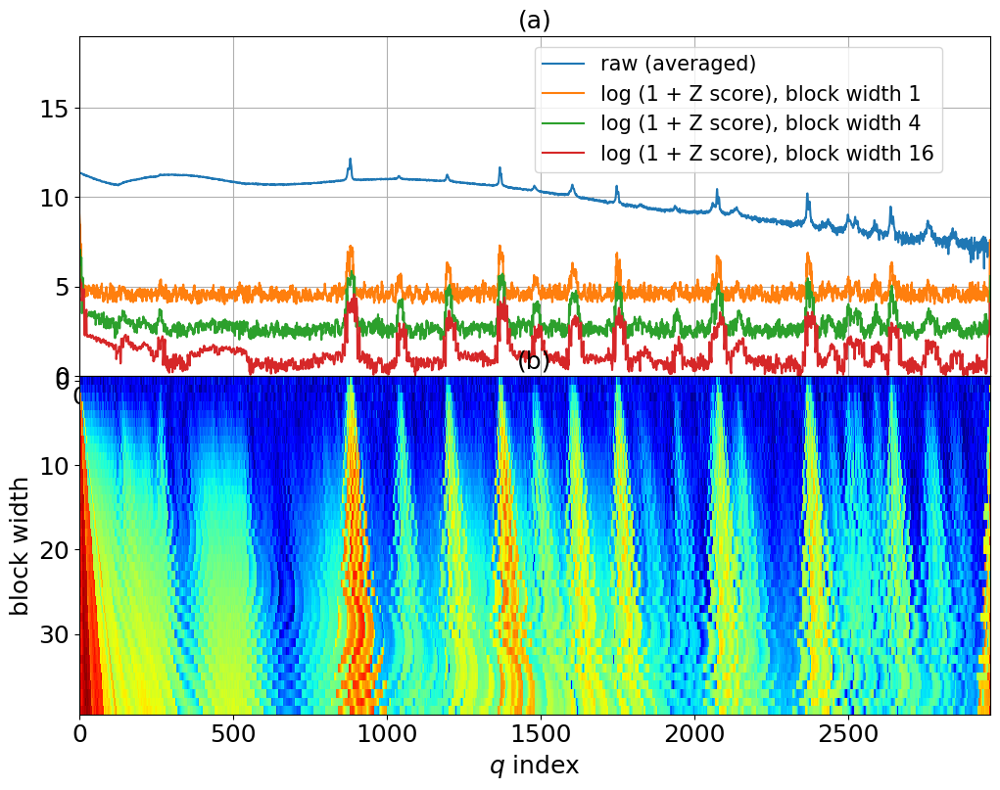

In [244]:
plot_twopanel(arr2d, z_vs_blocksize)

### No overlap, interpolated instead of oversampled:

#### pairwise diffs before aggregation

In [56]:
blocksizes = np.arange(1, 41)

# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns

peak = None

z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=False,
                  mode = 'agg_last')
        for bs in blocksizes])


pairwise (60, 2962)
pairwise (60, 1481)
pairwise (60, 988)
pairwise (60, 741)
pairwise (60, 593)
pairwise (60, 494)
pairwise (60, 424)
pairwise (60, 371)
pairwise (60, 330)
pairwise (60, 297)
pairwise (60, 270)
pairwise (60, 247)
pairwise (60, 228)
pairwise (60, 212)
pairwise (60, 198)
pairwise (60, 186)
pairwise (60, 175)
pairwise (60, 165)
pairwise (60, 156)
pairwise (60, 149)
pairwise (60, 142)
pairwise (60, 135)
pairwise (60, 129)
pairwise (60, 124)
pairwise (60, 119)
pairwise (60, 114)
pairwise (60, 110)
pairwise (60, 106)
pairwise (60, 103)
pairwise (60, 99)
pairwise (60, 96)
pairwise (60, 93)
pairwise (60, 90)
pairwise (60, 88)
pairwise (60, 85)
pairwise (60, 83)
pairwise (60, 81)
pairwise (60, 78)
pairwise (60, 76)
pairwise (60, 75)


In [127]:
# tmp = z_vs_blocksize

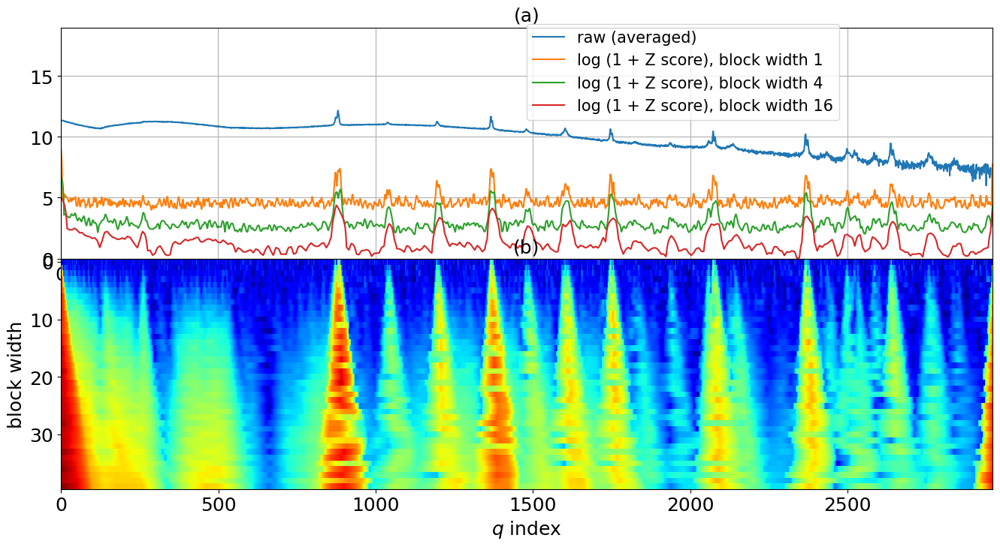

In [58]:
noise.plot_twopanel(arr2d, z_vs_blocksize, aspect = 18.3)

#### pairwise diffs after aggregation

In [54]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
blocksizes = np.arange(1, 41)
arr2d = patterns

peak = None

z_vs_blocksize = np.vstack([
    noise.padded_zscores(arr2d, bs, noise.mk_peak_blocksize(patterns, bs, ptype='square'), shifts=False)
        for bs in blocksizes])


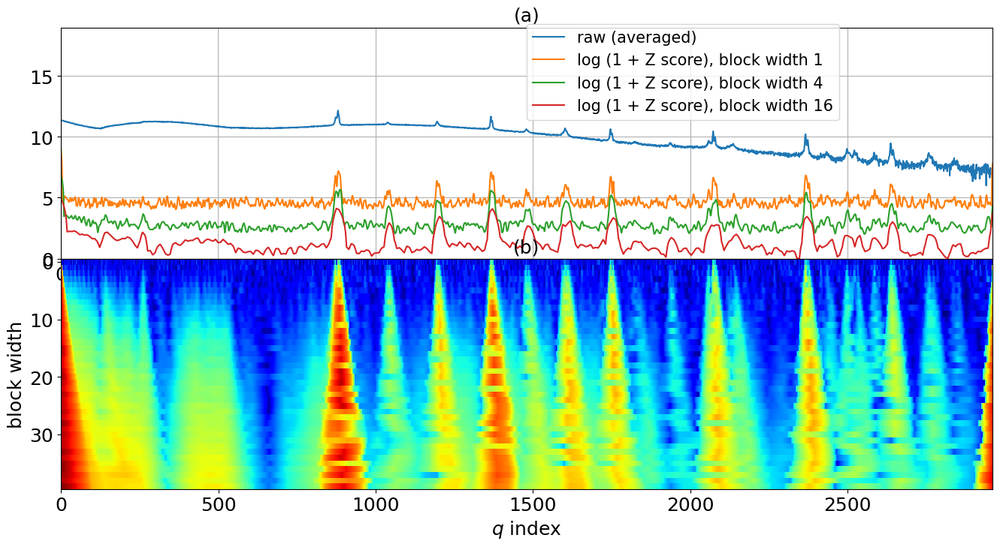

In [55]:
noise.plot_twopanel(arr2d, z_vs_blocksize, aspect = 18.3)

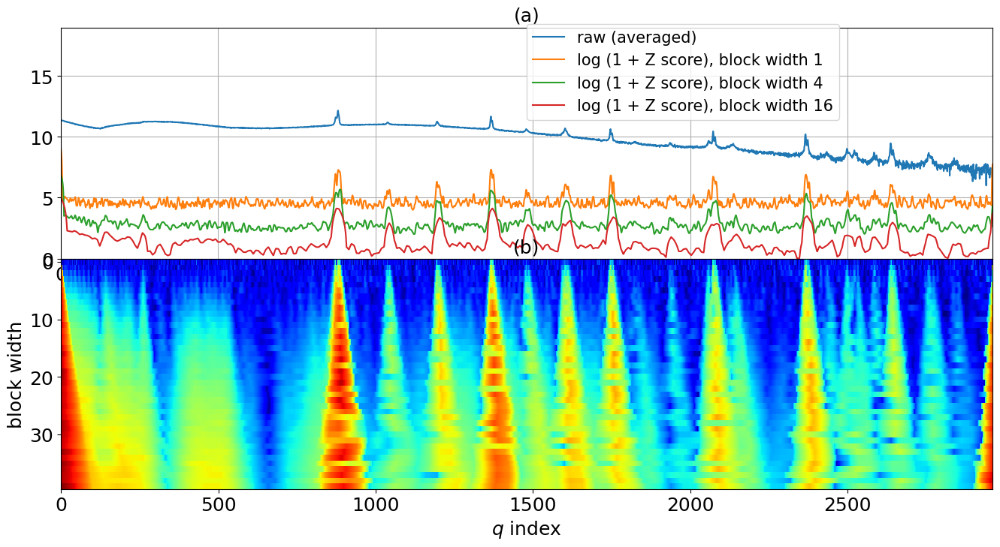

In [130]:
plot_twopanel(arr2d, z_vs_blocksize, aspect = 18.3)

## Overlapping blocks:

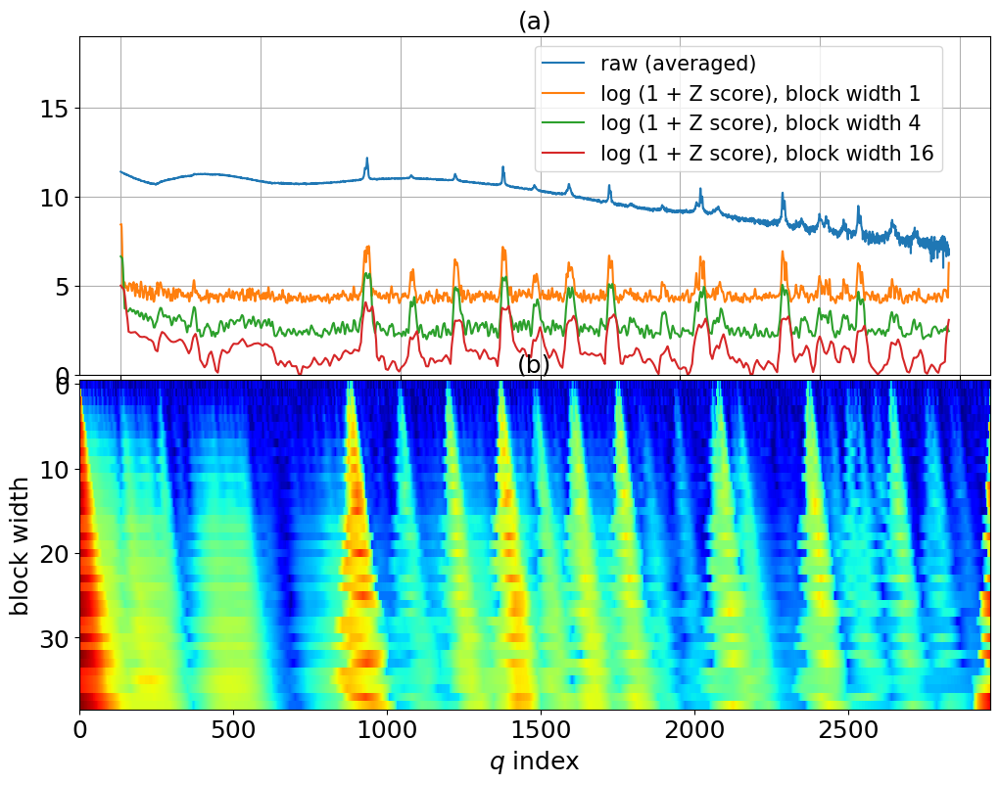

In [218]:
# Two filters used here. The first creates sliding blocks, second is a dummy (delta function) that does nothing
z_vs_blocksize = ([
    padded_zscores(
        # convolve with with 1 more than block spacing to create overlap
        pp(patterns, bs, mk_peak_blocksize(patterns, bs, ptype='square'))
        , 1, mk_delta(patterns[:, ::(bs - 1)]),
        shifts=False)
        for bs in blocksizes[1:]])

z_vs_blocksize = np.vstack([fill(arr, bs, len(patterns[0])) for arr, bs in zip(z_vs_blocksize, blocksizes)])
    
plot_twopanel(arr2d, z_vs_blocksize)

In [ ]:
# # matplotlib.rcParams['figure.figsize'] =(18, 9)
# arr2d = patterns

# peak = None

# z_vs_blocksize = np.vstack([
#     padded_zscores(arr2d[::bs], 1, mk_peak_blocksize(arr2d, bs), shifts=False)
#         for bs in blocksizes])

# best = z_vs_blocksize[9]


# size2 = 28
# size1 = 18
# plt.rcParams.update({'font.size': size1})
# plt.rcParams.update({'axes.labelsize': size2})
# plt.rcParams.update({'axes.titlesize': size2})
# plt.rcParams.update({'xtick.labelsize': size2})
# plt.rcParams.update({'ytick.labelsize': size2})

# def plt_lineout(lineout, offset = 0, **kwargs):
#     #- lineout.min()
#     plt.plot((np.log(1 + lineout - lineout.min()) + offset), **kwargs)



# a, b = 2, 1
# plt.subplot(a, b, 1)
# off_mul = 2.
# plt_lineout(np.abs(arr2d).mean(axis = 0), 3 * off_mul, label = 'raw (averaged)')
# plt_lineout(z_vs_blocksize[1], 2 * off_mul, label = 'log (1 + Z score), block width 1')
# plt_lineout(z_vs_blocksize[3], 1 * off_mul, label = 'log (1 + Z score), block width 4')
# plt_lineout(z_vs_blocksize[7], 0 * off_mul, label = 'log (1 + Z score), block width 16')
# plt.grid()
# plt.legend(loc = (.01, .6))
# plt.title('(a)')


# plt.subplot(a, b, 2)

# plt.imshow(np.log(1 + z_vs_blocksize), aspect = 33, cmap = 'jet', interpolation='none')
# plt.xlabel('$q$ index')
# plt.ylabel('block width')
# # plt.title('log (1 + Z score)')

# plt.subplots_adjust(hspace=0)

# # plt.colorbar()
# plt.title('(b)')

# plt.savefig('zscores_60.pdf')

### Same thing, N = 6

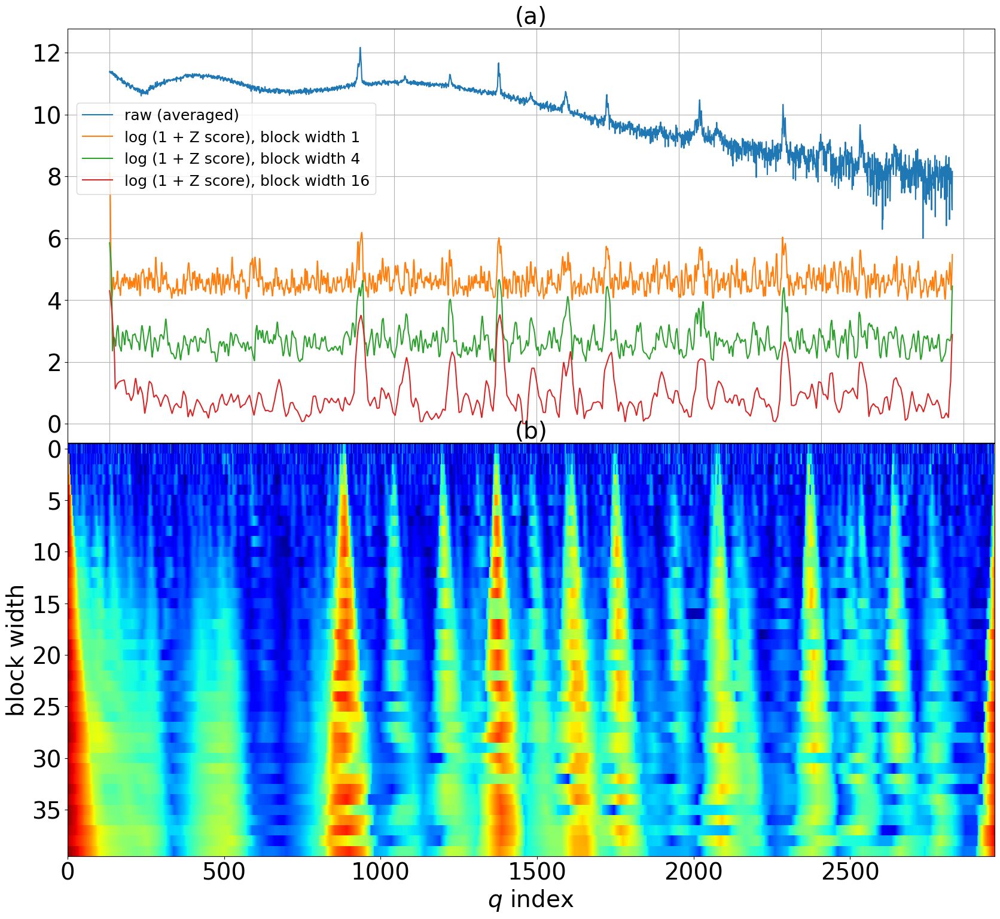

In [353]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns[:6]

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, mk_peak_blocksize(arr2d, bs))
        for bs in blocksizes])


size2 = 28
size1 = 18
plt.rcParams.update({'font.size': size1})
plt.rcParams.update({'axes.labelsize': size2})
plt.rcParams.update({'axes.titlesize': size2})
plt.rcParams.update({'xtick.labelsize': size2})
plt.rcParams.update({'ytick.labelsize': size2})

def plt_lineout(lineout, offset = 0, **kwargs):
    #- lineout.min()
    plt.plot((np.log(1 + lineout - lineout.min()) + offset), **kwargs)



a, b = 2, 1
plt.subplot(a, b, 1)
off_mul = 2.
plt_lineout(np.abs(arr2d).mean(axis = 0), 3 * off_mul, label = 'raw (averaged)')
plt_lineout(z_vs_blocksize[1], 2 * off_mul, label = 'log (1 + Z score), block width 1')
plt_lineout(z_vs_blocksize[3], 1 * off_mul, label = 'log (1 + Z score), block width 4')
plt_lineout(z_vs_blocksize[7], 0 * off_mul, label = 'log (1 + Z score), block width 16')
plt.grid()
plt.legend(loc = (.01, .6))
plt.title('(a)')


plt.subplot(a, b, 2)

plt.imshow(np.log(1 + z_vs_blocksize), aspect = 33, cmap = 'jet', interpolation='none')
plt.xlabel('$q$ index')
plt.ylabel('block width')
# plt.title('log (1 + Z score)')

plt.subplots_adjust(hspace=0)

# plt.colorbar()
plt.title('(b)')

plt.savefig('zscores_6.pdf')

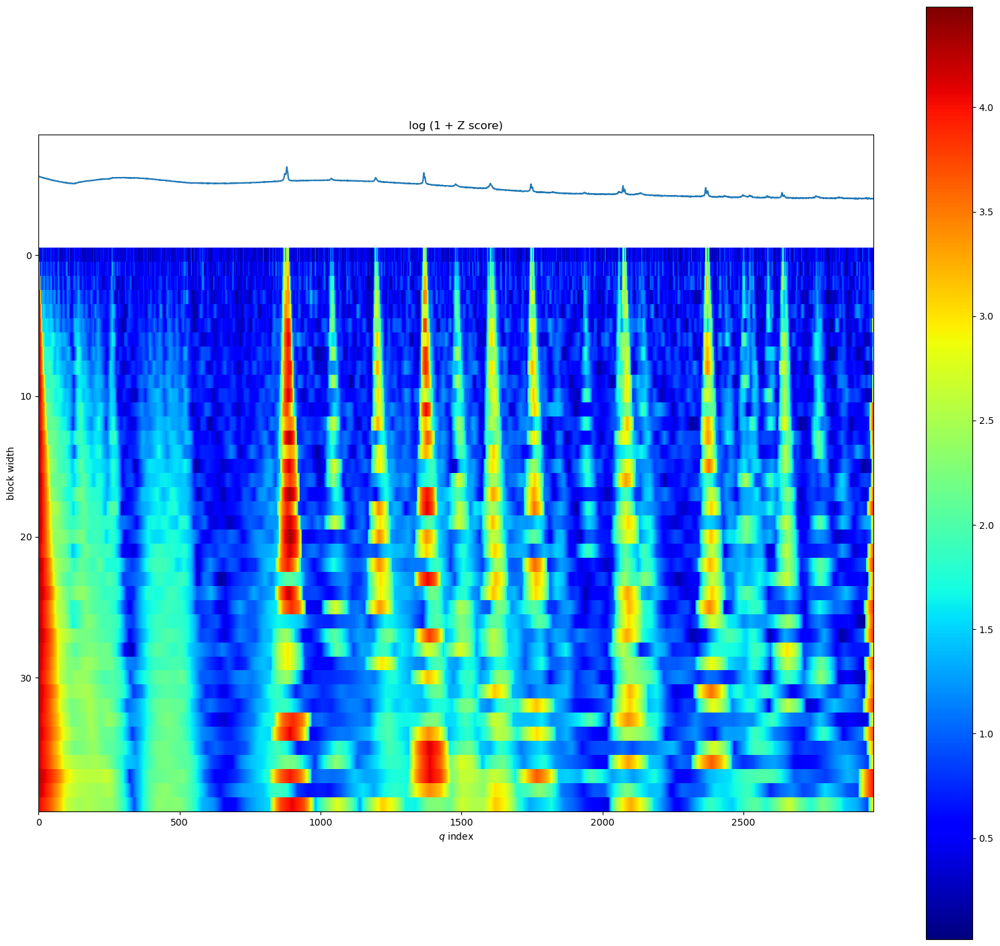

In [262]:
arr2d = patterns

peak = fourier.lowpass_g(100, patterns[0], sym=True)
peak = (peak == 1).astype(float)

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, peak)
        for bs in blocksizes])

plt.imshow(np.log(1 + z_vs_blocksize), aspect = 50, cmap = 'jet', interpolation='none')
plt.xlabel('$q$ index')
plt.ylabel('block width')
plt.title('log (1 + Z score)')
plt.plot(-np.log(1 + np.abs(arr2d).mean(axis = 0)) / 1)
plt.colorbar()

### with adaptive filtering

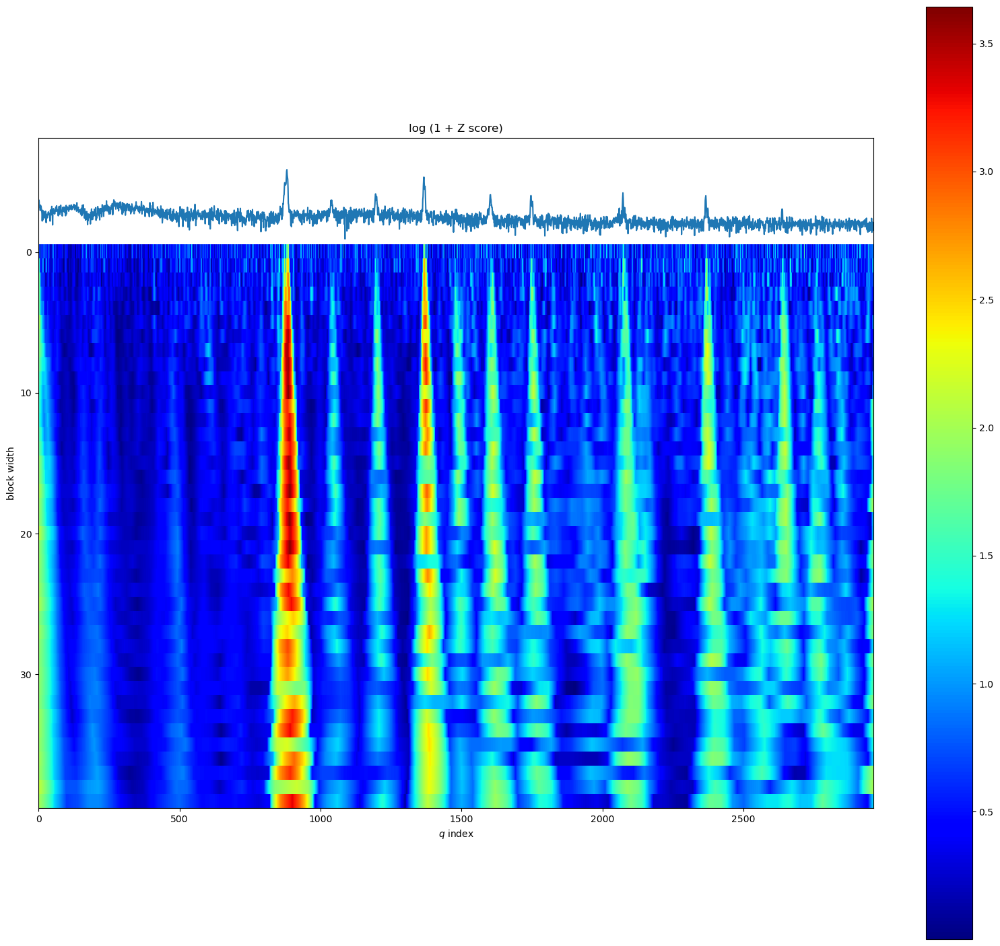

In [257]:
arr2d = fast_q[::10]

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, mk_peak_blocksize(arr2d, bs))
        for bs in blocksizes])

plt.imshow(np.log(1 + z_vs_blocksize), aspect = 50, cmap = 'jet', interpolation='none')
plt.xlabel('$q$ index')
plt.ylabel('block width')
plt.title('log (1 + Z score)')
plt.plot(-np.log(1 + np.abs(arr2d).mean(axis = 0)) / 1)
plt.colorbar()

### With no filtering

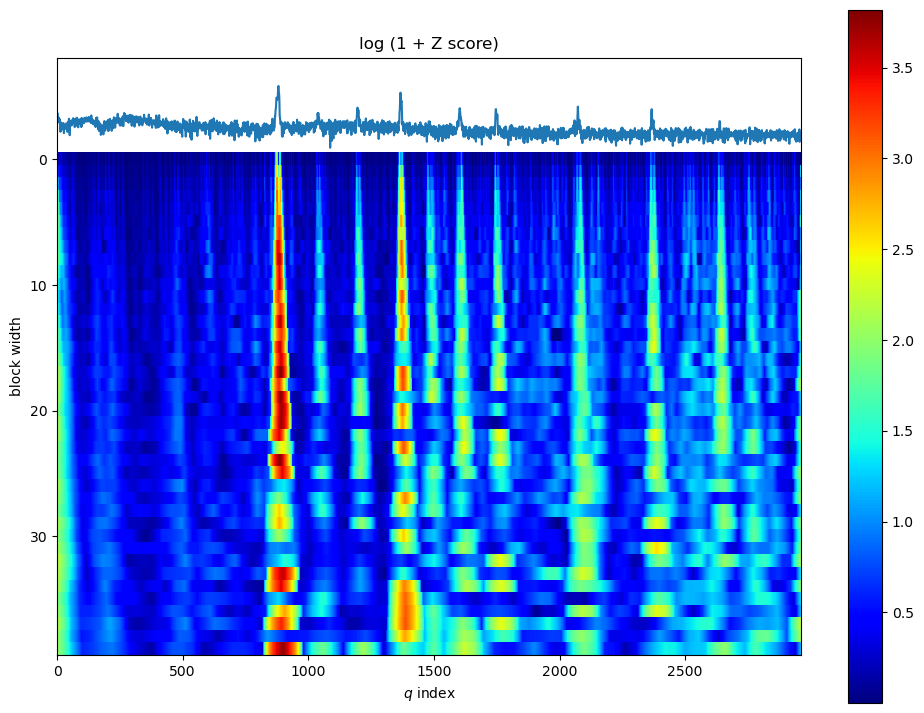

In [181]:
arr2d = fast_q[::10]

peak = fourier.lowpass_g(100, patterns[0], sym=True)
peak = (peak == 1).astype(float)

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs)
        for bs in blocksizes])

plt.imshow(np.log(1 + z_vs_blocksize), aspect = 50, cmap = 'jet', interpolation='none')
plt.xlabel('$q$ index')
plt.ylabel('block width')
plt.title('log (1 + Z score)')
plt.plot(-np.log(1 + np.abs(arr2d).mean(axis = 0)) / 1)
plt.colorbar()

In [185]:
from xrdc.datasets import d2d

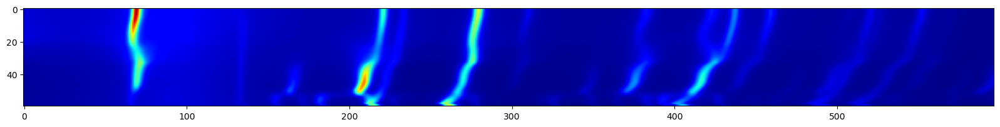

In [232]:
plt.imshow(d2d.patterns, cmap = 'jet')

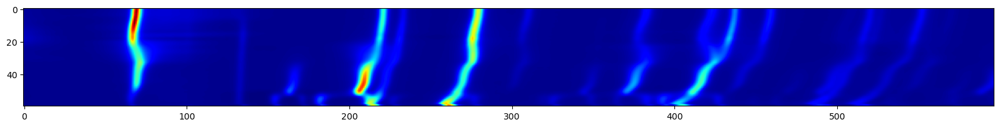

In [231]:
plt.imshow(TT.fast_q, cmap = 'jet')

(0, 0)
Peak at 69, start iteration with error = 0.25915070037116616
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229

Peak at 207, start iteration with error = 0.23421488804529866
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 2

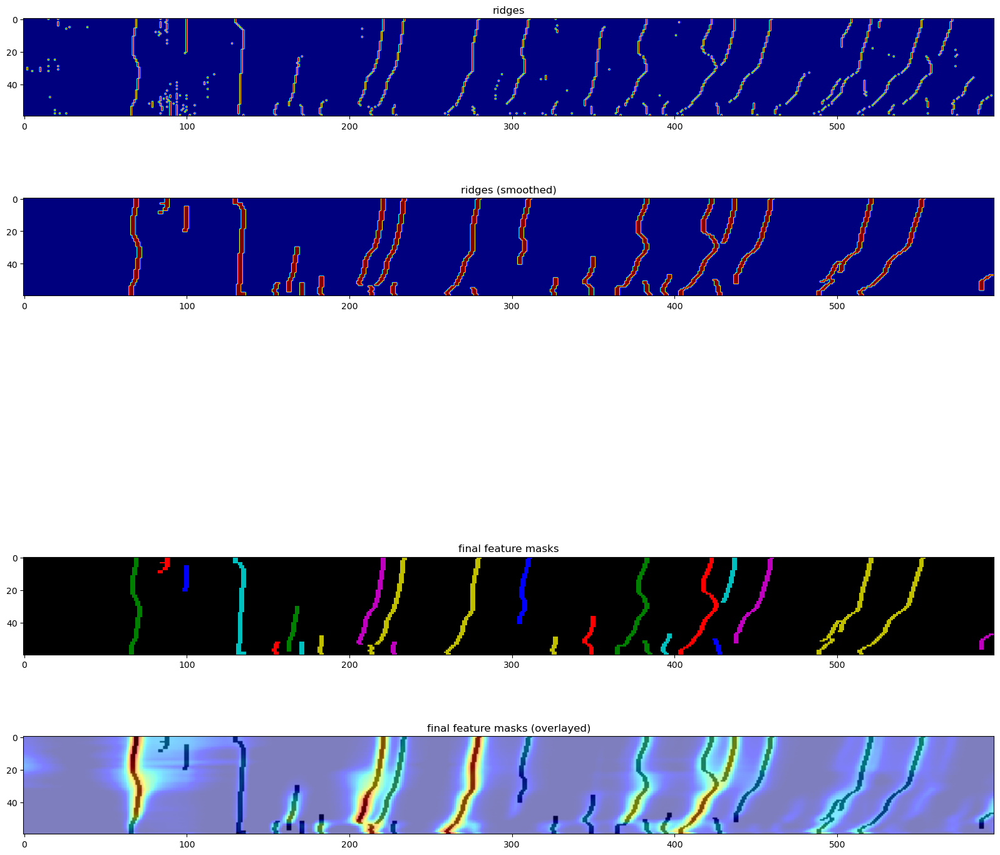

In [229]:
from xrdc.recipes import T_progression as TT

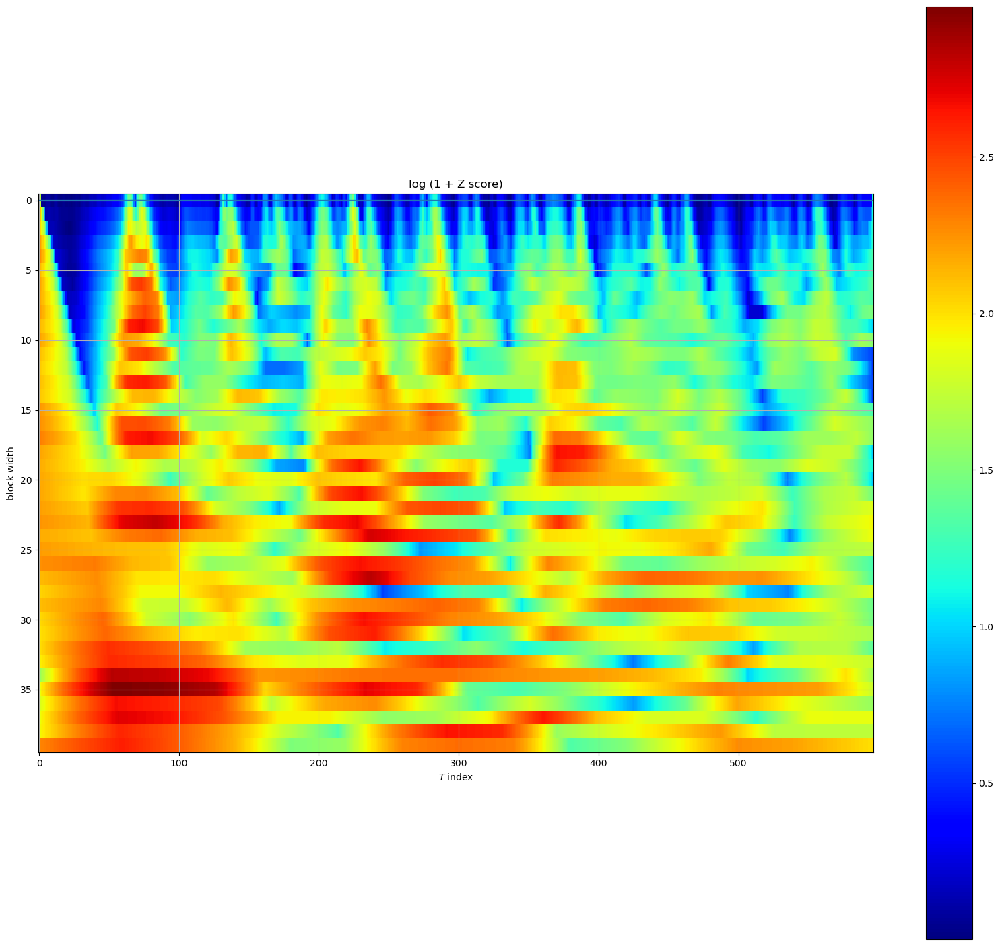

In [244]:
arr2d = TT.patterns

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, peak = mk_peak_blocksize(arr2d, bs))
        for bs in blocksizes])

plt.imshow(np.log(1 + z_vs_blocksize), aspect = 10, cmap = 'jet', interpolation='none')
plt.xlabel('$T$ index')
plt.ylabel('block width')
plt.title('log (1 + Z score)')
plt.plot(-(np.abs(arr2d).mean(axis = 0)) / 1000)
plt.grid()
plt.colorbar()

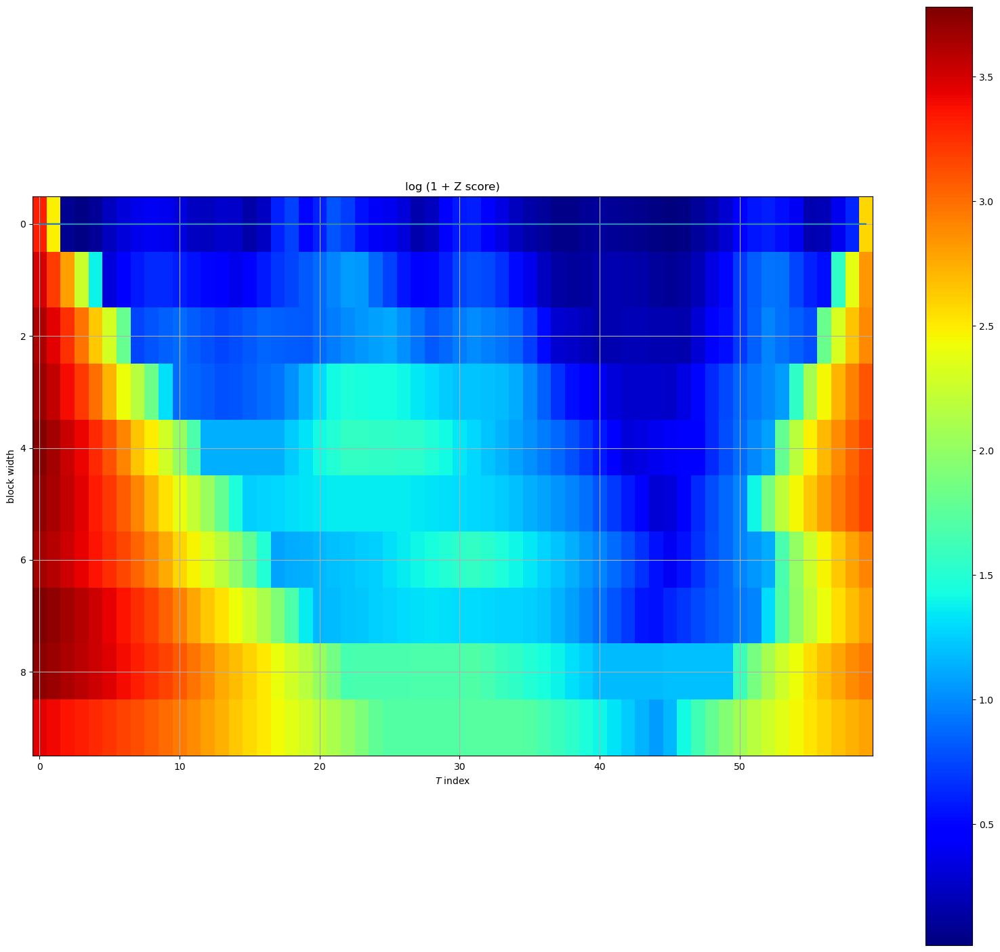

In [245]:
arr2d = TT.patterns.T#d2d.patterns.T

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, peak = mk_peak_blocksize(arr2d, bs))
        for bs in blocksizes[:10]])

plt.imshow(np.log(1 + z_vs_blocksize), aspect = 4, cmap = 'jet', interpolation='none')
plt.xlabel('$T$ index')
plt.ylabel('block width')
plt.title('log (1 + Z score)')
plt.plot(-(np.abs(arr2d).mean(axis = 0)) / 1000)
plt.grid()
plt.colorbar()

2022-10-24 15:30:45.603116: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-24 15:30:45.714804: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2022-10-24 15:30:46.035495: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: :/home/ollie/anaconda3/envs/tf/lib/
2022-10-24 15:30:46.035547: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.

Text(0.5, 1.0, 'N = 60, 1 / 10 collection time')

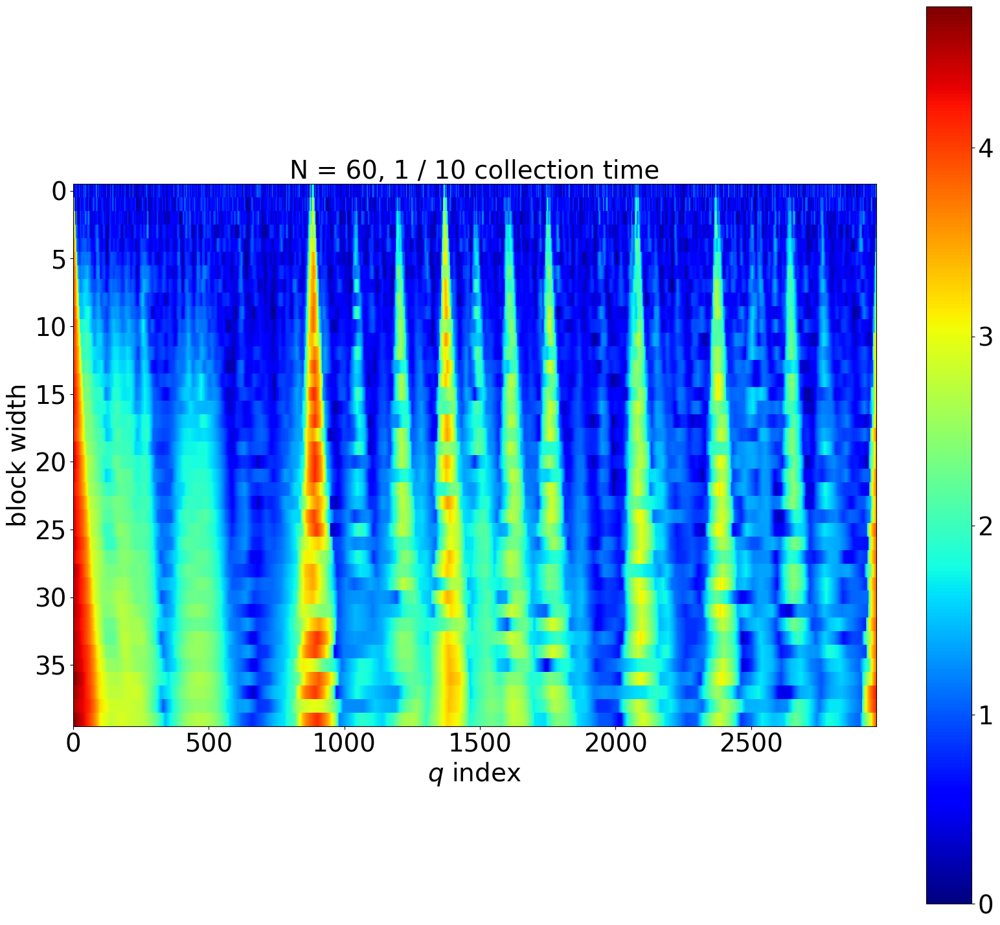

In [377]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = short_exposure

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, mk_peak_blocksize(arr2d, bs))
        for bs in blocksizes])


plt.imshow(np.log(1 + z_vs_blocksize), aspect = 50, cmap = 'jet', interpolation='none',
          vmin = 0)
plt.xlabel('$q$ index')
plt.ylabel('block width')
vmax = np.log(1 + z_vs_blocksize).max()
# plt.title('log (1 + Z score)')

plt.subplots_adjust(hspace=0)

plt.colorbar()
plt.title('N = 60, 1 / 10 collection time')

# plt.savefig('zscores_6.pdf')

Text(0.5, 1.0, 'N = 6, full collection time')

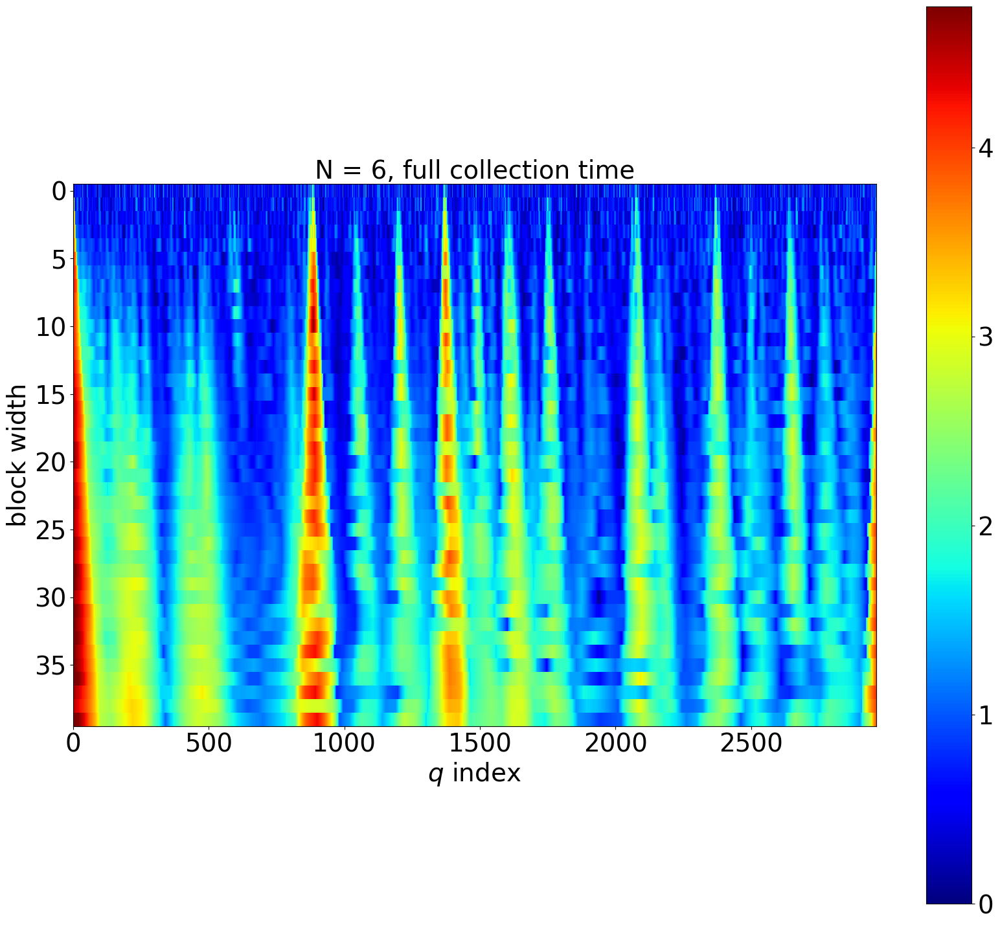

In [379]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = patterns[::10]

peak = None

z_vs_blocksize = np.vstack([
    padded_zscores(arr2d, bs, mk_peak_blocksize(arr2d, bs))
        for bs in blocksizes])


plt.imshow(np.log(1 + z_vs_blocksize), aspect = 50, cmap = 'jet', interpolation='none',
           vmin = 0, vmax = vmax)
plt.xlabel('$q$ index')
plt.ylabel('block width')
# plt.title('log (1 + Z score)')

plt.subplots_adjust(hspace=0)

plt.colorbar()
plt.title('N = 6, full collection time')

# plt.savefig('zscores_6.pdf')

In [43]:
simdata = np.zeros_like(patterns)
simdata[:] = gf(patterns.mean(axis = 0), .5)

In [ ]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
short_exposure = tfd.Independent(tfd.Poisson(simdata / 10)).sample().numpy()
long_exposure = tfd.Independent(tfd.Poisson(simdata)).sample().numpy()

Text(0.5, 1.0, 'N = 60, 1 / 10 collection time, no smoothing')

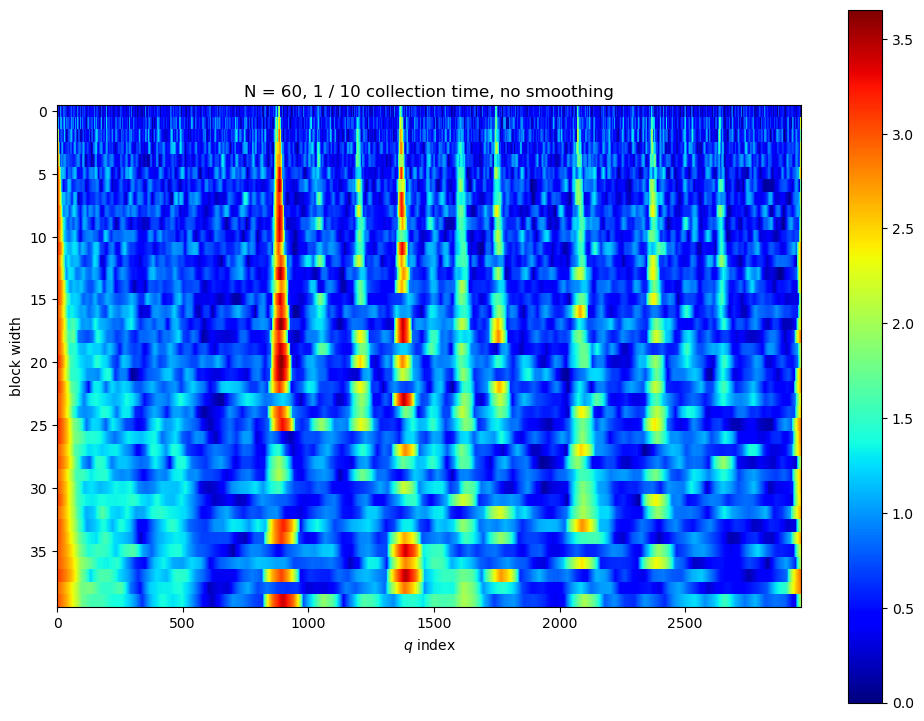

In [51]:
arr2d = short_exposure

peak = fourier.lowpass_g(100, patterns[0], sym=True)
peak = (peak == 1).astype(float)



_z_vs_blocksize = lambda: np.vstack([
    padded_zscores(arr2d, bs, peak)
        for bs in blocksizes])
z_vs_blocksize = _z_vs_blocksize()

block1_N60 = z_vs_blocksize[0]
block1_N60_averaged = np.mean([_z_vs_blocksize()[0] for _ in range(100)], axis = 0)



plt.imshow(np.log(1 + z_vs_blocksize), aspect = 50, cmap = 'jet', interpolation='none',
          vmin = 0)
plt.xlabel('$q$ index')
plt.ylabel('block width')
vmax = np.log(1 + z_vs_blocksize).max()
# plt.title('log (1 + Z score)')

plt.subplots_adjust(hspace=0)

plt.colorbar()
plt.title('N = 60, 1 / 10 collection time, no smoothing')

# plt.savefig('zscores_6.pdf')

Text(0.5, 1.0, 'N = 6, full collection time, no smoothing')

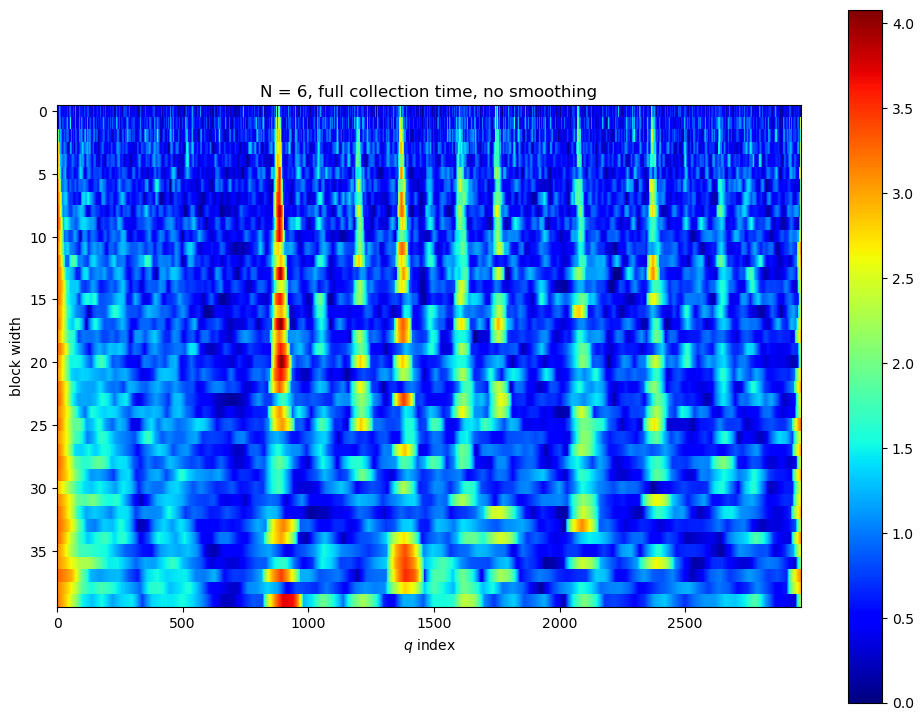

In [47]:
# matplotlib.rcParams['figure.figsize'] =(18, 9)
arr2d = long_exposure[::10]

peak = fourier.lowpass_g(100, patterns[0], sym=True)
peak = (peak == 1).astype(float)

_z_vs_blocksize = lambda: np.vstack([
    padded_zscores(arr2d, bs, peak)
        for bs in blocksizes])

z_vs_blocksize = _z_vs_blocksize()

block1_N6 = z_vs_blocksize[0]
block1_N6_averaged = np.mean([_z_vs_blocksize()[0] for _ in range(100)], axis = 0)


plt.imshow(np.log(1 + z_vs_blocksize), aspect = 50, cmap = 'jet', interpolation='none',
          vmin = 0)
plt.xlabel('$q$ index')
plt.ylabel('block width')
vmax = np.log(1 + z_vs_blocksize).max()
# plt.title('log (1 + Z score)')

plt.subplots_adjust(hspace=0)

plt.colorbar()
plt.title('N = 6, full collection time, no smoothing')

# plt.savefig('zscores_6.pdf')

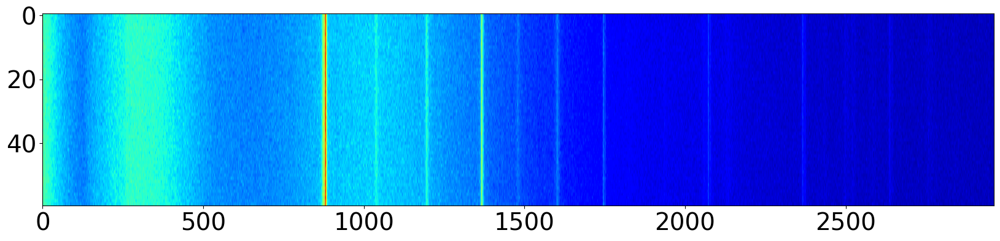

In [469]:
plt.imshow(long_exposure, aspect = 10, cmap = 'jet')

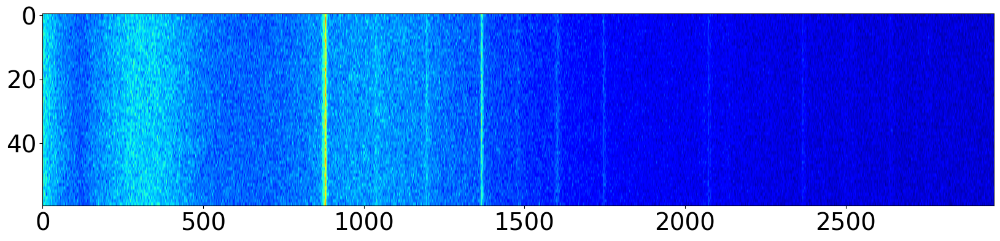

In [470]:
plt.imshow(short_exposure, aspect = 10, cmap = 'jet')

In [440]:
long_exposure[::10].sum() / short_exposure.sum()

1.0007715403142503

In [441]:
block1_N60.std() / block1_N6.std()

0.6874887434769663

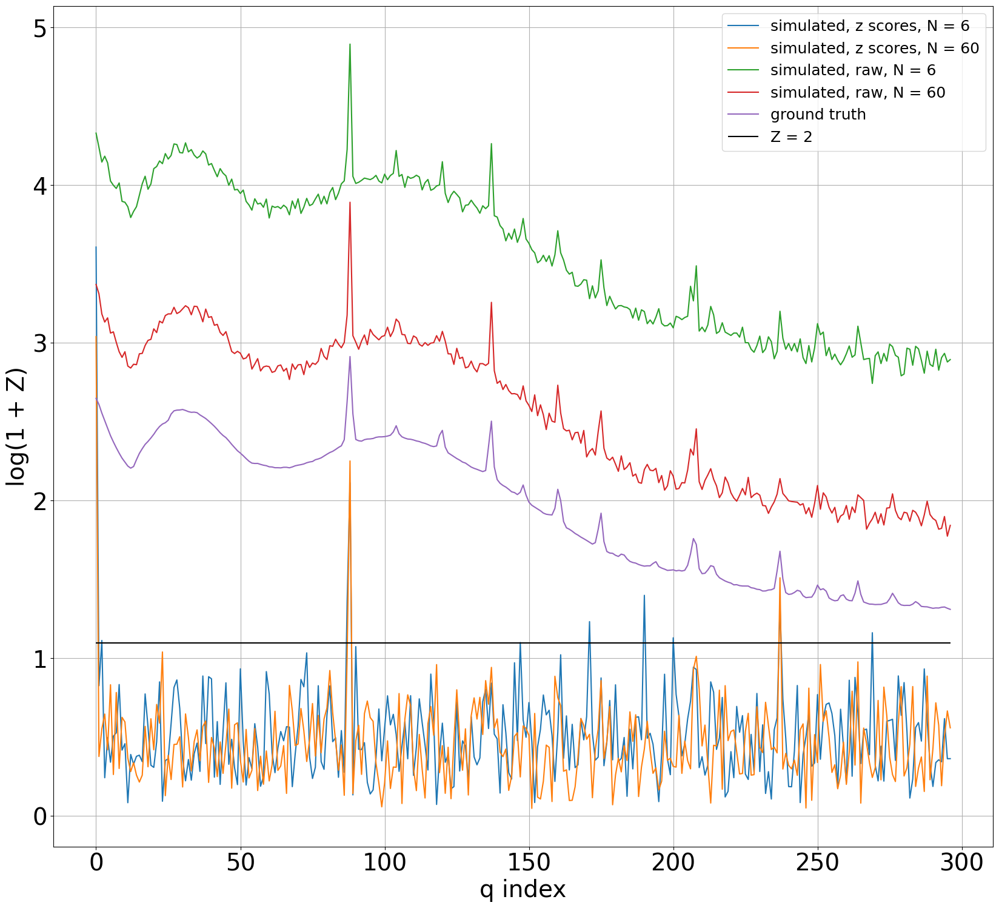

In [468]:
plt.plot(np.log(1 + gf(block1_N6, 0)[::10]), label = 'simulated, z scores, N = 6')
plt.plot(np.log(1 + gf(block1_N60, 0)[::10]), label = 'simulated, z scores, N = 60')
plt.grid()
plt.ylabel('log(1 + Z)')
plt.xlabel('q index')

plt.plot(np.log(1 + long_exposure[::10].sum(axis = 0)[::10] / 60) + 1, label = 'simulated, raw, N = 6')
plt.plot(np.log(1 + short_exposure.sum(axis = 0)[::10] / 60), label = 'simulated, raw, N = 60')
plt.plot(np.log(1 + gf(patterns.mean(axis = 0), 5)[::10] / 20), label = 'ground truth')

plt.hlines(np.log(3), 0, len(block1_N60) // 10, color = 'k', label = 'Z = 2')


plt.legend()

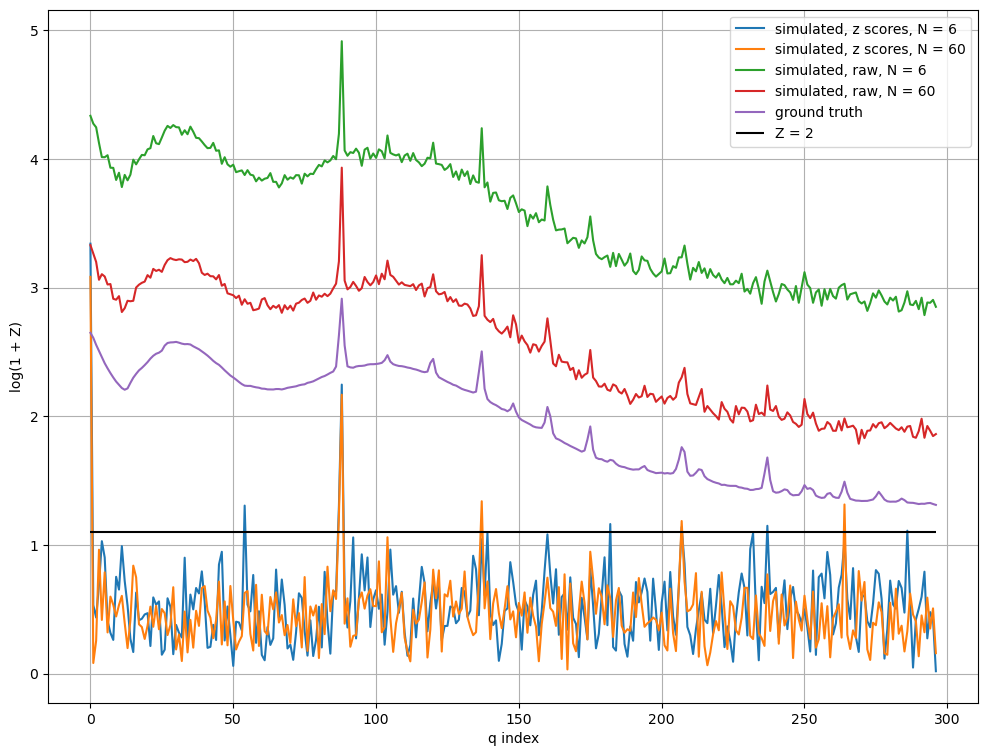

In [52]:
plt.plot(np.log(1 + gf(block1_N6_averaged, 0)[::10]), label = 'simulated, z scores, N = 6')
plt.plot(np.log(1 + gf(block1_N60_averaged, 0)[::10]), label = 'simulated, z scores, N = 60')
plt.grid()
plt.ylabel('log(1 + Z)')
plt.xlabel('q index')

plt.plot(np.log(1 + long_exposure[::10].sum(axis = 0)[::10] / 60) + 1, label = 'simulated, raw, N = 6')
plt.plot(np.log(1 + short_exposure.sum(axis = 0)[::10] / 60), label = 'simulated, raw, N = 60')
plt.plot(np.log(1 + gf(patterns.mean(axis = 0), 5)[::10] / 20), label = 'ground truth')

plt.hlines(np.log(3), 0, len(block1_N60_averaged) // 10, color = 'k', label = 'Z = 2')


plt.legend()

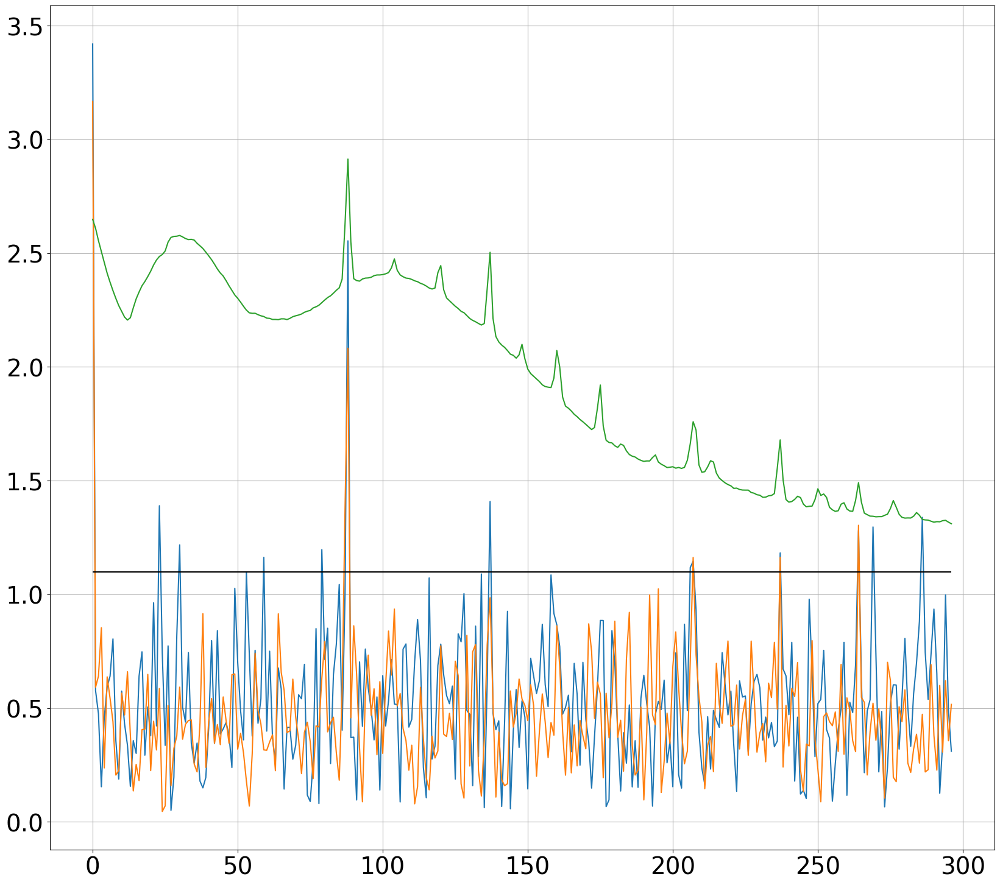

In [413]:
plt.plot(np.log(1 + gf(block1_N6, 0)[::10]), label = 'N = 6')
plt.plot(np.log(1 + gf(block1_N60, 0)[::10]), label = 'N = 60')
plt.plot(np.log(1 + gf(patterns.mean(axis = 0), 5)[::10] / 20), label = 'reference')
plt.grid()
plt.hlines(np.log(3), 0, len(block1_N60) // 10, color = 'k', label = 'Z == 2')

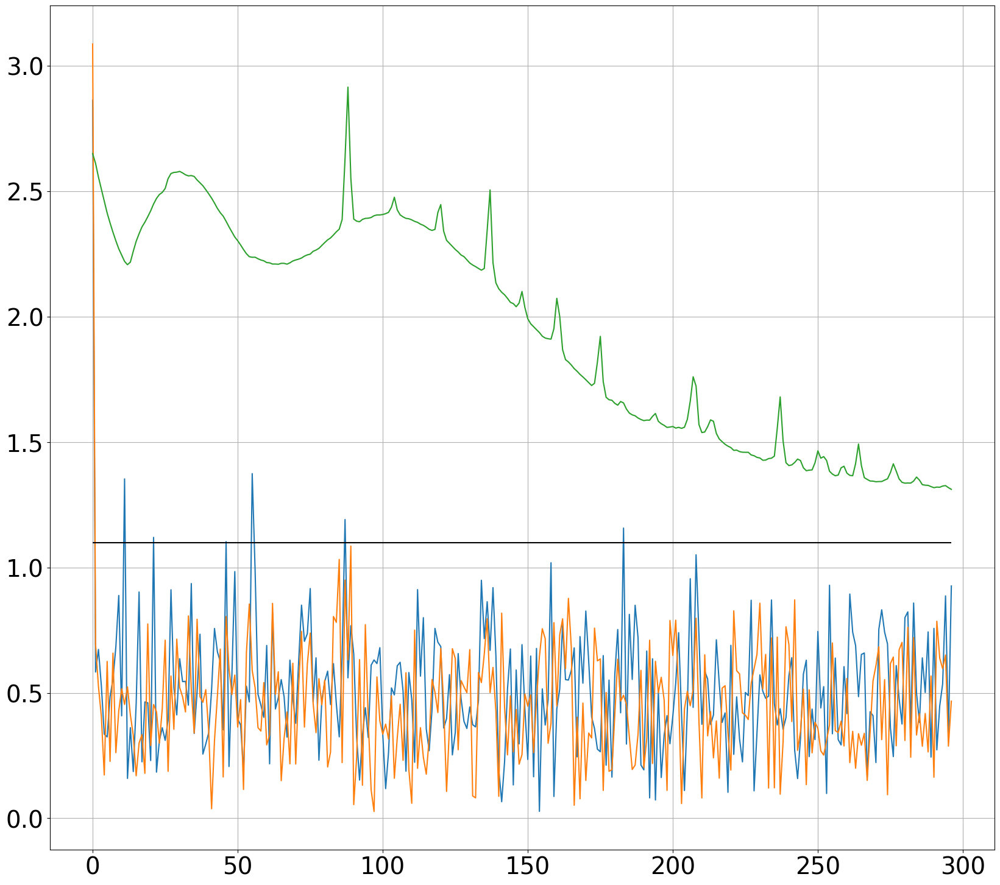

In [425]:
plt.plot(np.log(1 + gf(block1_N6, 0)[::10]), label = 'N = 6')
plt.plot(np.log(1 + gf(block1_N60, 0)[::10]), label = 'N = 60')
plt.plot(np.log(1 + gf(patterns.mean(axis = 0), 5)[::10] / 20), label = 'reference')
plt.grid()
plt.hlines(np.log(3), 0, len(block1_N60) // 10, color = 'k', label = 'Z == 2')

### Using 'local' z scores from the near-diagonal band:

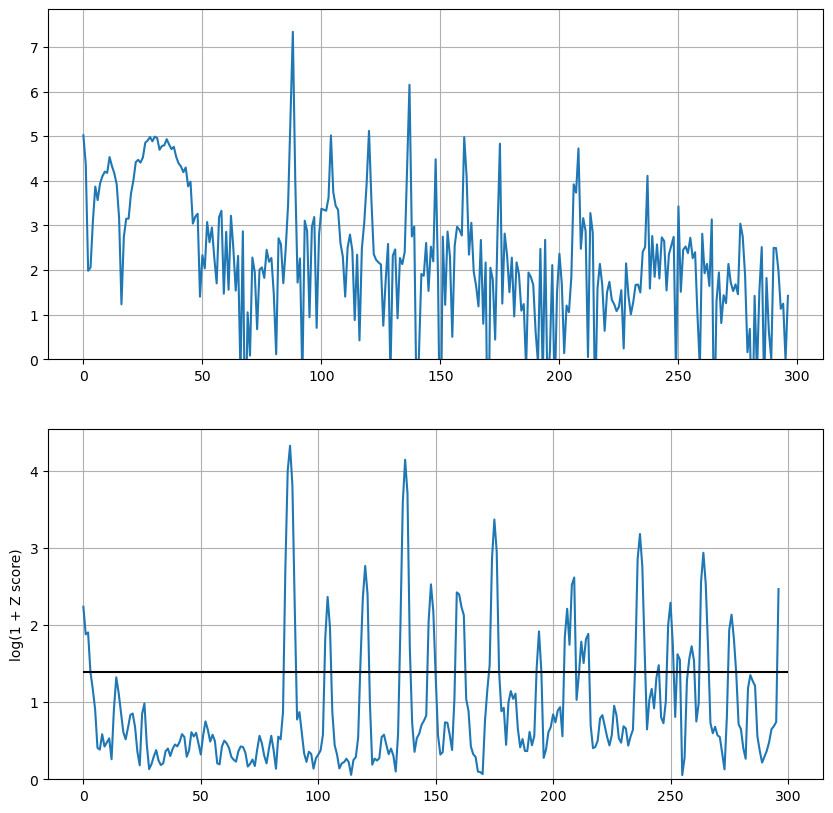

In [61]:
cmp_zscores(fast_q, get_agged_zscores(fast_q, peak, blocksize, off_diag_mask))

### Using globally-aggregated ones

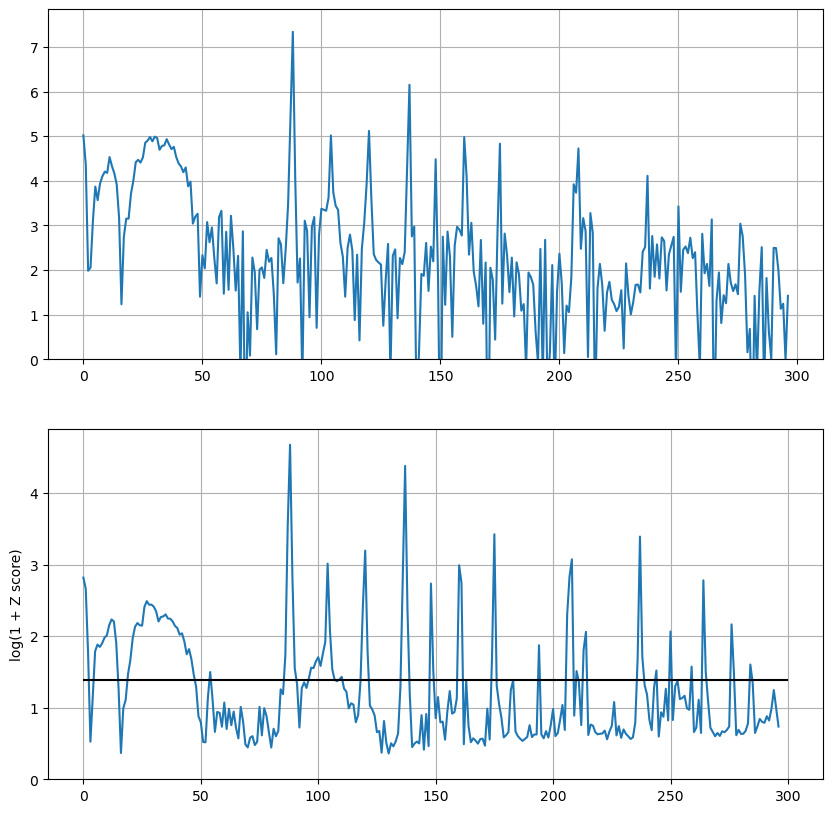

In [63]:
cmp_zscores(fast_q, np.median(zscores[bgmask_1d], axis = 0))

### Compare N = 60 to N = 6

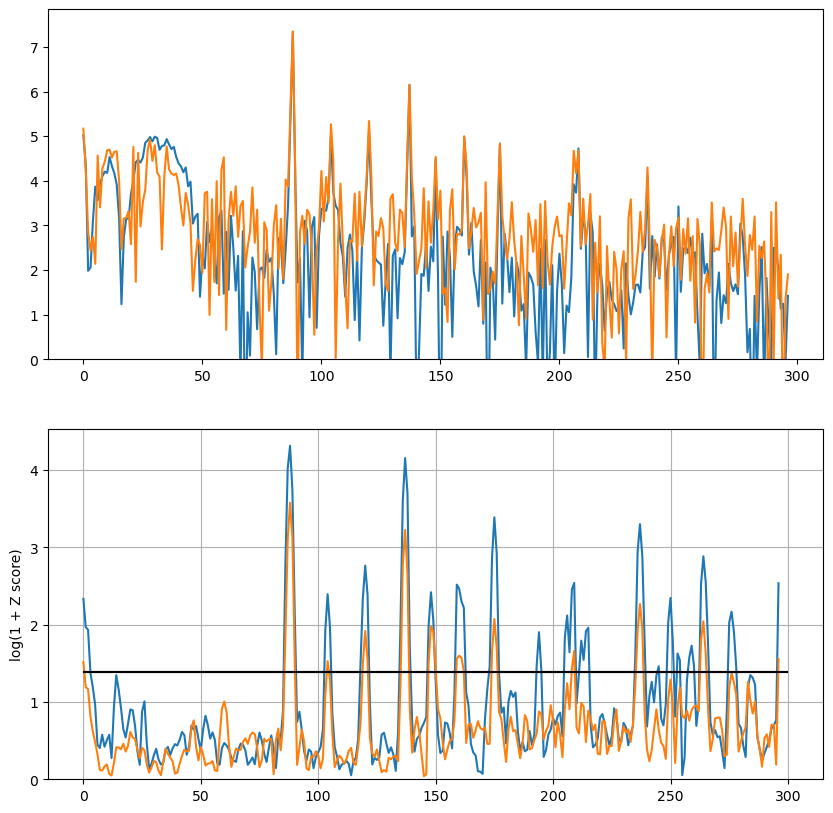

In [65]:
plot_zscores_subsample_rows(fast_q, 1, 10)
plot_zscores_subsample_rows(fast_q, 10, 10)
plt.grid()

In [41]:
blocksize = 1

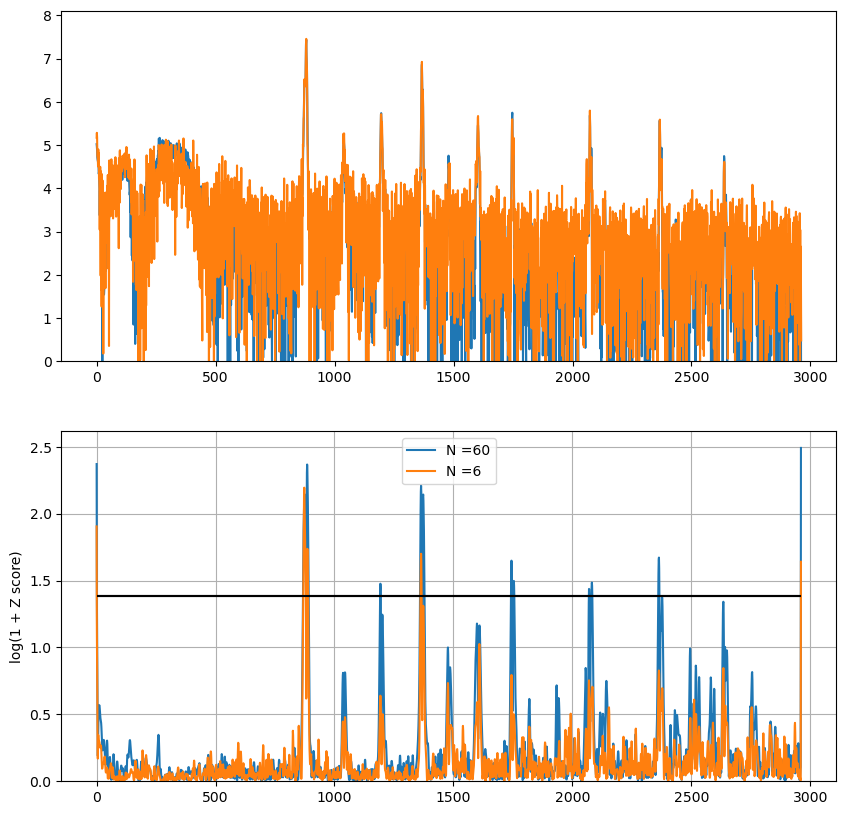

In [56]:
plot_zscores_subsample_rows(fast_q, 1, 1)
plt.legend()
plot_zscores_subsample_rows(fast_q, 10, 1)
plt.legend()
plt.grid()

In [134]:
def plot_q_zscores(arr1d, blocksize):
    #blocksize = 3
    #arr1d = patterns[0]#np.convolve(patterns[0], peak, mode = 'same')
    padded = np.pad(arr1d, (0, blocksize - (len(arr1d) % blocksize)), mode = 'edge')
    qblocks = padded.reshape((-1, blocksize)).T
    qpoints = np.arange(len(padded)).reshape((-1, blocksize)).T.mean(axis = 0)

    qpeak = np.ones_like(qblocks[0])

    qmean = boot_mean(qblocks)

    qsterr = boot_stderr(qblocks)

    q_zscores = np.abs(cartesian_diff(qmean, qmean)) / (cartesian_quad(qsterr, qsterr) + 1e-9)

    off_diag_mask = (np.roll(np.eye(len(padded[::blocksize])), -1, axis = 0) +\
                np.roll(np.eye(len(padded[::blocksize])), 1, axis = 0)).astype(bool)

    plt.plot(qpoints, (q_zscores * off_diag_mask).sum(axis = 0), label = blocksize)

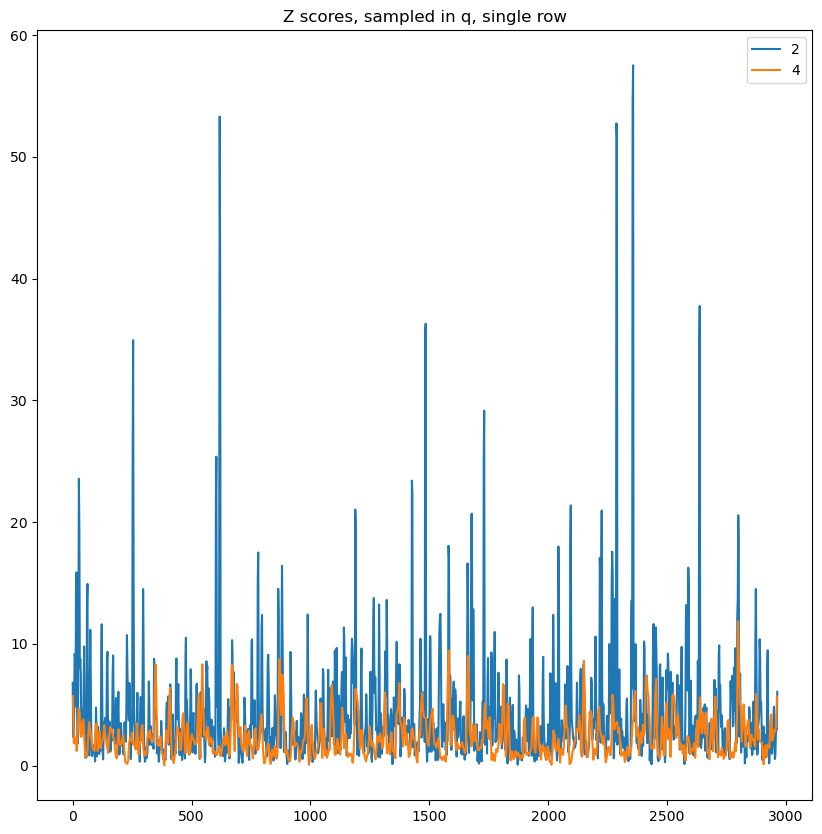

In [140]:
#plot_q_zscores(fast_q[10], 1)
plot_q_zscores(fast_q[8], 2)
plot_q_zscores(fast_q[8], 4)
plt.title('Z scores, sampled in q, single row')
plt.legend()

In [99]:
cartesian_diff(qbloc)

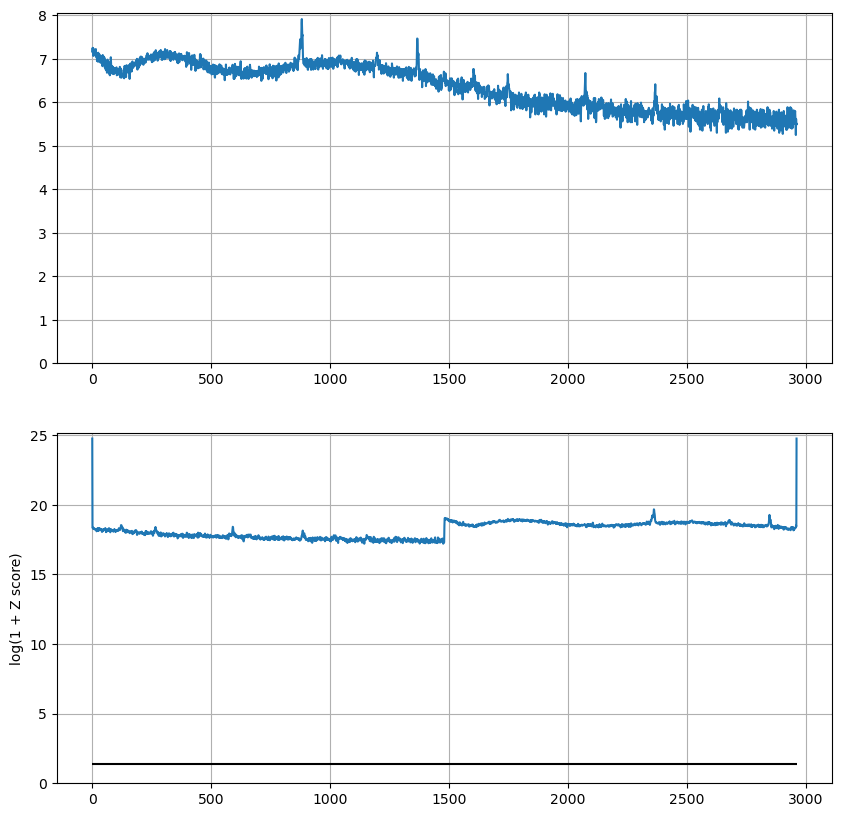

In [98]:
plot_zscores_subsample_rows(qblocks, row_blocksize = blocksize, blocksize = 1, peak = qpeak)


In [67]:
blocksize = 1

In [25]:
pairwise_diffs, pairwise_stds, ratio = compute_zscores(subsample)
rowmask = (np.median(fast_q, axis = 0) < np.percentile(np.median(fast_q, axis = 0), 50))
rowmask[:1300] = False

pairs_mask = np.einsum('i,j->ij', rowmask, rowmask)

imask = np.arange(len(ratio))[rowmask]

std_agg_ratio = pairwise_diffs[imask][::blocksize].sum(axis = 0) /\
    np.sqrt((pairwise_stds[imask][::blocksize]**2).sum(axis = 0))

(60, 2962)
(2962,) (60, 2962)


In [95]:
tmp = feat.l2_pairs(det.T)

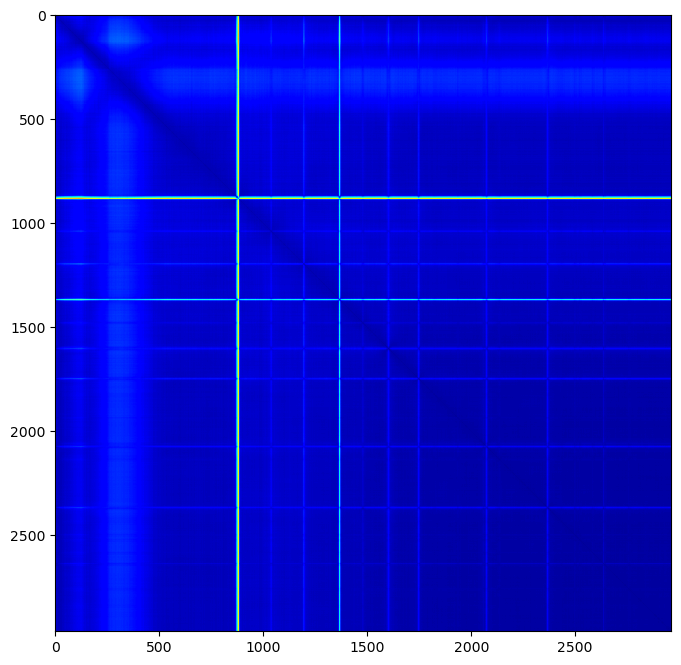

In [99]:
%matplotlib inline
plt.imshow(tmp, cmap = 'jet')

In [ ]:
# rowmask = (np.median(fast_q, axis = 0) < np.percentile(np.median(fast_q, axis = 0), 50))
# rowmask[:1300] = False

# imask = np.arange(len(ratio))[rowmask]

<IPython.core.display.Javascript object>


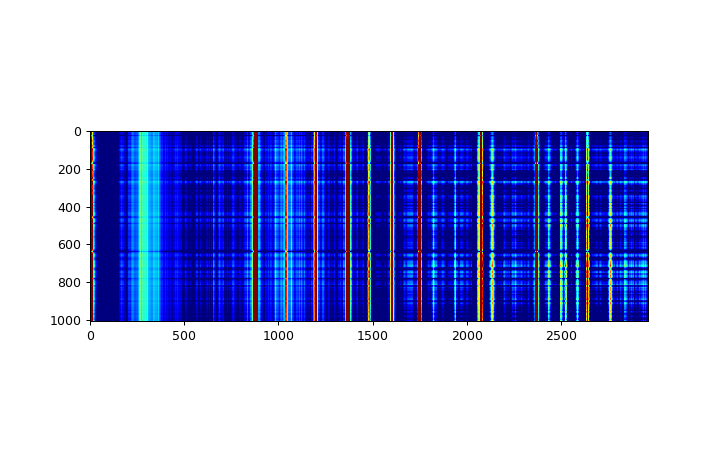

In [33]:
mpl.rcParams['figure.figsize'] =(8, 5)

plt.imshow(ratio[imask, :], cmap = 'jet', aspect = 1, vmin = 0, vmax = 2, interpolation = 'none')

<IPython.core.display.Javascript object>


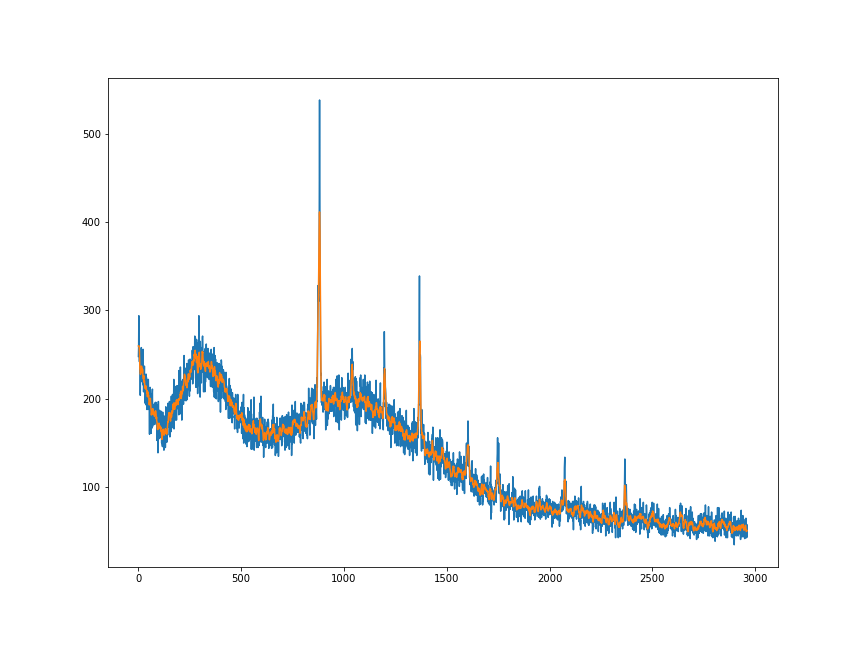

In [119]:
%matplotlib notebook
i = 10
plt.plot(patterns[i])
plt.plot(agged_2d[i])

In [49]:
def resample_2d(arr):
    N = len(arr)
    idx = np.arange(N).astype(int)
    return arr[resample(idx), :]
    

<IPython.core.display.Javascript object>


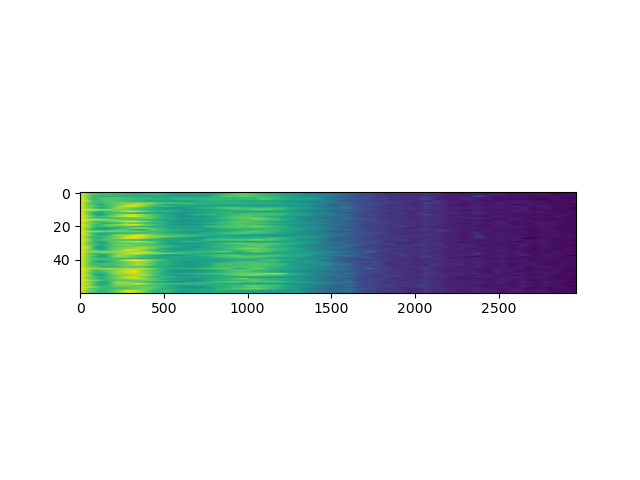

In [56]:
plt.imshow(resample_2d(background), aspect = 10)

In [46]:
N = len(patterns)
aggregate_uncertainty = np.sqrt((fast_T.std(axis = 0)**2 + background.std(axis = 0)**2) / N)
background = gf(background, (0, bg_smooth_post))
aggregate_uncertainty = gf(aggregate_uncertainty, bg_smooth_post)

Ideas

different z scores for features of different sizes?